In [1]:
from fastai.vision import * 
from fastai.metrics import accuracy,error_rate
from fastai.callbacks import ReduceLROnPlateauCallback, SaveModelCallback
import timm

## Old Focal Loss


In [3]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable

class FocalLoss(nn.Module):
    def __init__(self, gamma=0, alpha=None, size_average=True,reduction = 'elementwise_mean'):
        super(FocalLoss, self).__init__()
        self.gamma = gamma
        self.reduction = reduction
        self.alpha = alpha
        if isinstance(alpha,(float,int,int)): self.alpha = torch.Tensor([alpha,1-alpha])
        if isinstance(alpha,list): self.alpha = torch.Tensor(alpha)
        self.size_average = size_average

    def forward(self, input, target):
        if input.dim()>2:
            input = input.view(input.size(0),input.size(1),-1)  # N,C,H,W => N,C,H*W
            input = input.transpose(1,2)    # N,C,H*W => N,H*W,C
            input = input.contiguous().view(-1,input.size(2))   # N,H*W,C => N*H*W,C
        target = target.view(-1,1)
        logpt = F.log_softmax(input)
        logpt = logpt.gather(1,target)
        logpt = logpt.view(-1)
        pt = Variable(logpt.data.exp())

        if self.alpha is not None:
            if self.alpha.type()!=input.data.type():
                self.alpha = self.alpha.type_as(input.data)
            at = self.alpha.gather(0,target.data.view(-1))
            logpt = logpt * Variable(at)

        loss = -1 * (1-pt)**self.gamma * logpt
        if self.size_average: 
            return loss.mean()
        else: 
            return loss.sum()
        
        if self.reduction is None:
            return loss
        else:
            return torch.mean(loss)

## New FL


In [2]:
from torch import nn
import torch.nn.functional as F

class FocalLoss(nn.Module):
    def __init__(self, alpha=1, gamma=2, logits=False, reduction='elementwise_mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.logits = logits
        self.reduction = reduction

    def forward(self, inputs, targets):
        if self.logits:
            BCE_loss = F.binary_cross_entropy_with_logits(inputs, targets, reduction='none')
        else:
            BCE_loss = F.binary_cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-BCE_loss)
        F_loss = self.alpha * (1-pt)**self.gamma * BCE_loss

        if self.reduction is None:
            return F_loss
        else:
            return torch.mean(F_loss)

## New FL_2

use previous loss if get reduction attribute error


In [ ]:
class FocalLoss(nn.Module):
    def __init__(self, alpha=1., gamma=1.):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma

    def forward(self, inputs, targets, **kwargs):
        CE_loss = nn.CrossEntropyLoss(reduction='none')(inputs, targets)
        pt = torch.exp(-CE_loss)
        F_loss = self.alpha * ((1-pt)**self.gamma) * CE_loss
        return F_loss.mean()

    
def roc_score(inp, target):
    _, indices = inp.max(1)
    return torch.Tensor([roc_auc_score(target, indices)])[0]

In [3]:
data = (ImageList.from_folder('../final_data_v3/final_data/') #Where to find the data? -> in path and its subfolders
        .split_by_folder(train='train',valid='val')#How to split in train/valid? -> use the folders
        .label_from_folder()#How to label? -> depending on the folder of the filenames
        .transform(get_transforms(p_affine=1., p_lighting=1.), size=224)#Data augmentation? -> use tfms with a size of 64
        .databunch(bs=64)
        .normalize(imagenet_stats))#Finally? -> use the defaults for conversion to ImageDataBunch

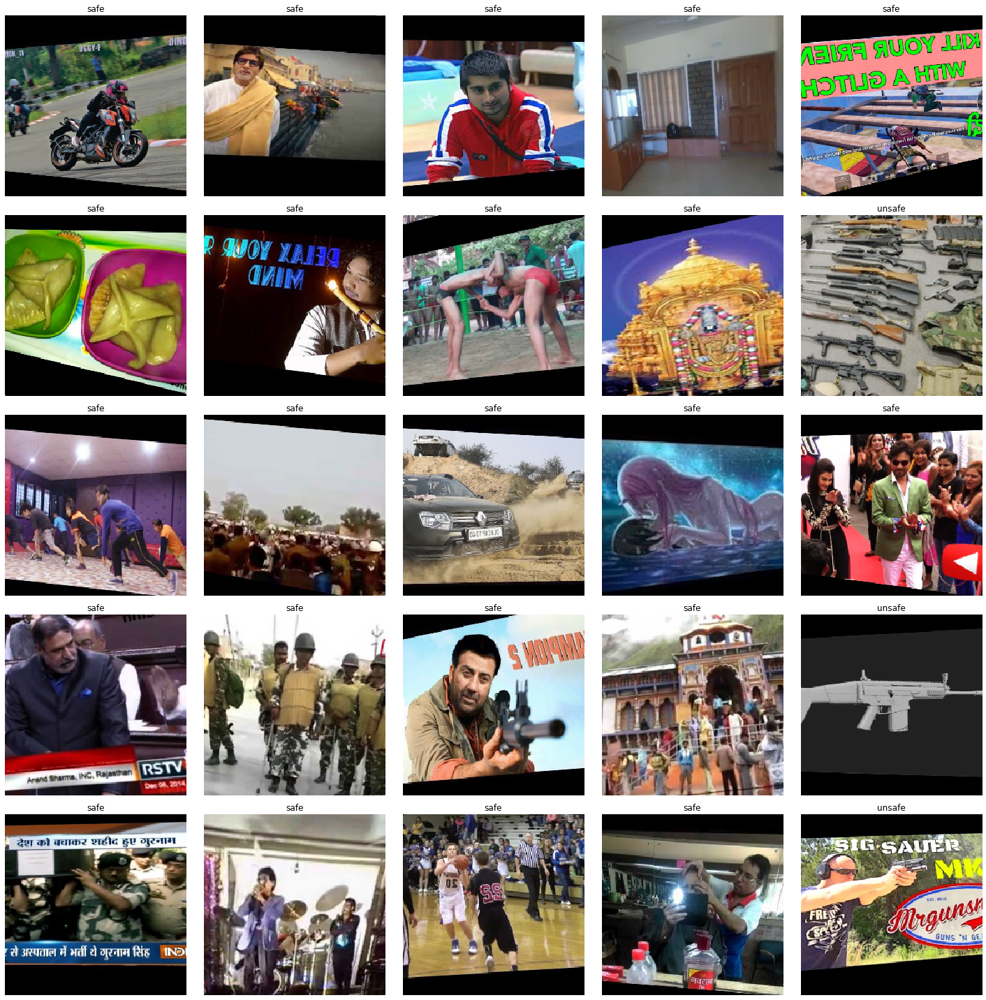

In [4]:
data.show_batch(row = 5)

In [5]:
learn = cnn_learner(data ,models.resnet34,bn_final = True, pretrained=True, metrics =[accuracy,error_rate])
learn.loss_fn = FocalLoss()
len(learn.layer_groups)

3

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 1.32E-02
Min loss divided by 10: 4.37E-02


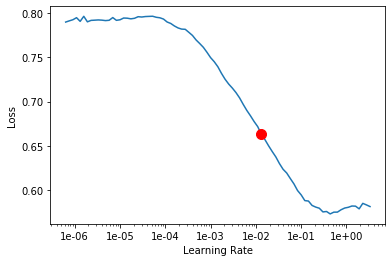

In [10]:
#learn.unfreeze()
learn.lr_find()
learn.recorder.plot(suggestion=True,num_it = 200)

In [10]:
learn.recorder.min_grad_lr

0.08317637711026708

In [7]:
callbacks = [SaveModelCallback(learn, every='improvement', monitor='accuracy', name='initial train_v2')
,ReduceLROnPlateauCallback(learn, monitor='valid_loss',patience =2,mode = 'auto',factor = 1e-3)]


learn.fit_one_cycle(1,max_lr = slice(5e-2),callbacks = callbacks)

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.169701,0.162486,0.932917,0.067083,02:39


Better model found at epoch 0 with accuracy value: 0.9329166412353516.


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 3.02E-05
Min loss divided by 10: 6.92E-07


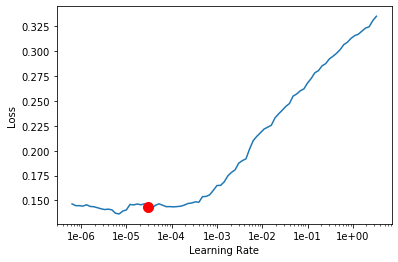

In [9]:
learn.freeze_to(1)
learn.lr_find()
learn.recorder.plot(suggestion=True)

In [10]:
callbacks = [SaveModelCallback(learn, every='improvement', monitor='accuracy', name='best_ep_res_v2')
,ReduceLROnPlateauCallback(learn, monitor='valid_loss',patience =2,mode = 'auto',factor = 1e-3)]


learn.fit_one_cycle(4,max_lr = slice(1e-6, 5e-5),callbacks = callbacks)

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.153075,0.158321,0.936250,0.063750,02:38
1,0.137451,0.164781,0.933750,0.066250,02:40
2,0.130958,0.151281,0.942500,0.057500,02:41
3,0.133423,0.150206,0.944583,0.055417,02:38


Better model found at epoch 0 with accuracy value: 0.9362499713897705.
Better model found at epoch 2 with accuracy value: 0.9424999952316284.
Better model found at epoch 3 with accuracy value: 0.9445833563804626.


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 3.31E-06
Min loss divided by 10: 5.75E-07


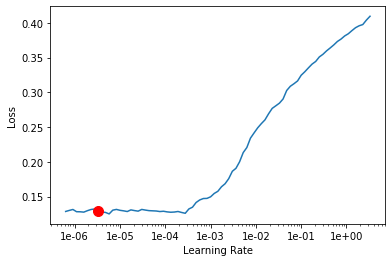

In [11]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot(suggestion=True)

In [12]:
callbacks = [SaveModelCallback(learn, every='improvement', monitor='accuracy', name='best_ep_res_v2')
,ReduceLROnPlateauCallback(learn, monitor='valid_loss',patience =2,mode = 'auto',factor = 1e-3)]


learn.fit_one_cycle(4,max_lr = slice(1e-6, 2e-4),callbacks = callbacks)

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.131058,0.153606,0.941667,0.058333,02:39
1,0.120969,0.125294,0.953333,0.046667,02:40
2,0.110799,0.123707,0.955417,0.044583,02:40
3,0.102466,0.134928,0.950833,0.049167,02:42


Better model found at epoch 0 with accuracy value: 0.9416666626930237.
Better model found at epoch 1 with accuracy value: 0.95333331823349.
Better model found at epoch 2 with accuracy value: 0.9554166793823242.


In [13]:
learn.save('final_ep_resnet_34_v3')

# ResNet 50

In [5]:
learn = cnn_learner(data ,models.resnet50,bn_final = True, pretrained=True, metrics =[accuracy,error_rate])
learn.loss_fn = FocalLoss()
len(learn.layer_groups)

3

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 3.31E-02
Min loss divided by 10: 1.20E-02


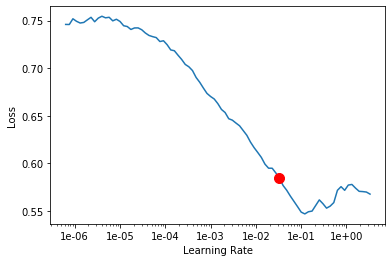

In [5]:
#learn.unfreeze()
learn.lr_find()
learn.recorder.plot(suggestion=True,num_it = 200)

In [6]:
callbacks = [SaveModelCallback(learn, every='improvement', monitor='accuracy', name='init_res50')
,ReduceLROnPlateauCallback(learn, monitor='valid_loss',patience =2,mode = 'auto',factor = 1e-3)]


learn.fit_one_cycle(1,max_lr = slice(4e-4, 5e-2),callbacks = callbacks)

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.150255,0.126535,0.954583,0.045417,02:49


Better model found at epoch 0 with accuracy value: 0.9545833468437195.


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 6.31E-07
Min loss divided by 10: 7.59E-08


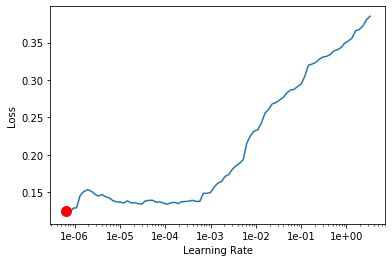

In [7]:
learn.freeze_to(1)
learn.lr_find()
learn.recorder.plot(suggestion=True,num_it = 200)

In [8]:
callbacks = [SaveModelCallback(learn, every='improvement', monitor='accuracy', name='ep_res50_v2')
,ReduceLROnPlateauCallback(learn, monitor='valid_loss',patience =2,mode = 'auto',factor = 1e-3)]


learn.fit_one_cycle(4,max_lr = slice(1e-6, 3e-4),callbacks = callbacks)

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.124164,0.124304,0.955833,0.044167,02:52
1,0.118430,0.137478,0.946667,0.053333,02:55
2,0.107739,0.102707,0.962917,0.037083,02:55
3,0.092353,0.103272,0.962917,0.037083,02:53


Better model found at epoch 0 with accuracy value: 0.9558333158493042.
Better model found at epoch 2 with accuracy value: 0.9629166722297668.


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 6.31E-07
Min loss divided by 10: 4.79E-07


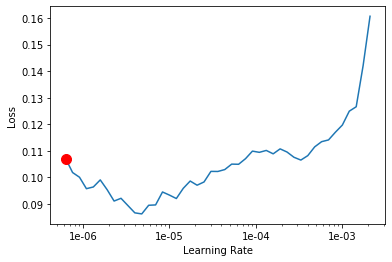

In [9]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot(suggestion=True,num_it = 200)

In [10]:
callbacks = [SaveModelCallback(learn, every='improvement', monitor='accuracy', name='ep_res50_v3')
,ReduceLROnPlateauCallback(learn, monitor='valid_loss',patience =2,mode = 'auto',factor = 1e-3)]


learn.fit_one_cycle(4,max_lr = slice(3e-7, 4e-6),callbacks = callbacks)

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.089785,0.114023,0.959167,0.040833,03:08
1,0.085424,0.115413,0.959167,0.040833,03:10
2,0.087255,0.107496,0.961667,0.038333,03:10
3,0.083338,0.104319,0.963333,0.036667,03:10


Better model found at epoch 0 with accuracy value: 0.9591666460037231.
Better model found at epoch 2 with accuracy value: 0.9616666436195374.
Better model found at epoch 3 with accuracy value: 0.9633333086967468.


In [6]:
learn.load('./resnet50weights/ep3_res50_v2')

Learner(data=ImageDataBunch;

Train: LabelList (31335 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
unsafe,unsafe,unsafe,unsafe,unsafe
Path: ../final_data_v3/final_data;

Valid: LabelList (2400 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
unsafe,unsafe,unsafe,unsafe,unsafe
Path: ../final_data_v3/final_data;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1,

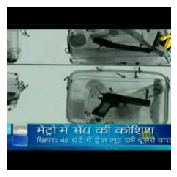

In [7]:
idx=30
x,y = data.valid_ds[idx]
x.show()

In [8]:
k = tensor([
    [0.  ,-5/3,1],
    [-5/3,-5/3,1],
    [1.  ,1   ,1],
]).expand(1,3,3,3)/6

k.shape

torch.Size([1, 3, 3, 3])

In [9]:
from fastai.callbacks.hooks import *
t = data.valid_ds[35][0].data
t.shape

torch.Size([3, 224, 224])

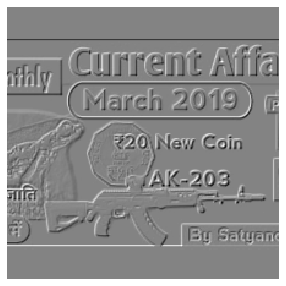

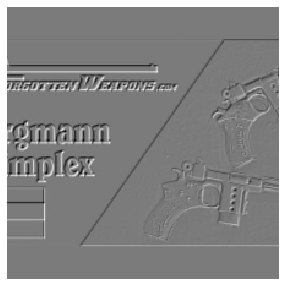

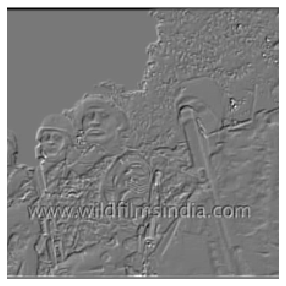

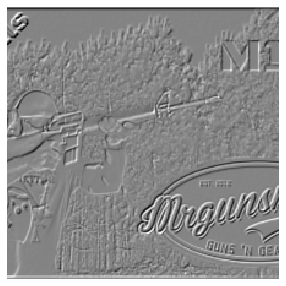

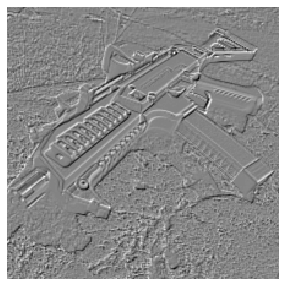

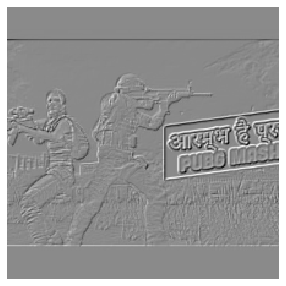

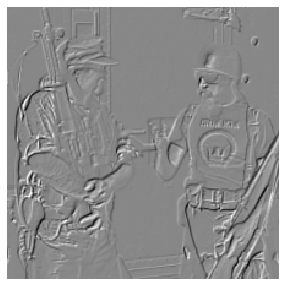

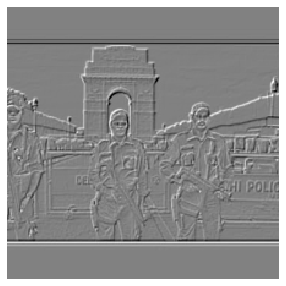

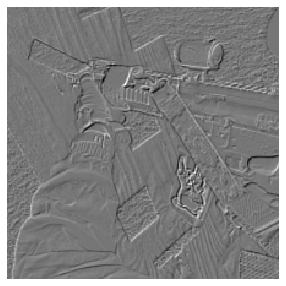

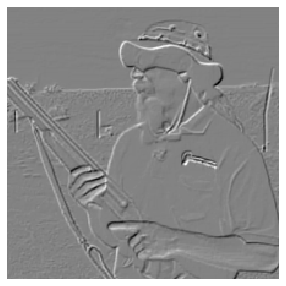

In [10]:
for i in range(10):
    t = data.valid_ds[i][0].data
    edge = F.conv2d(t[None], k)
    show_image(edge[0], figsize=(5,5))

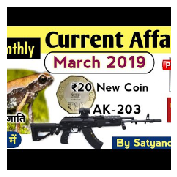

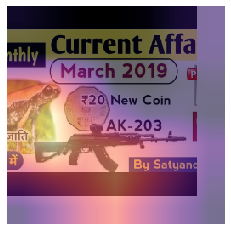

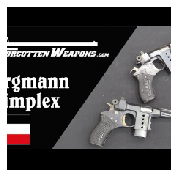

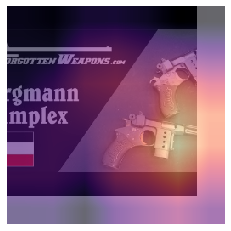

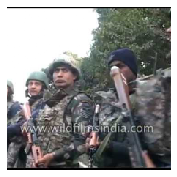

...

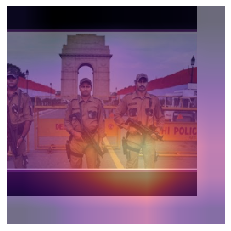

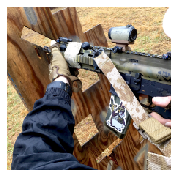

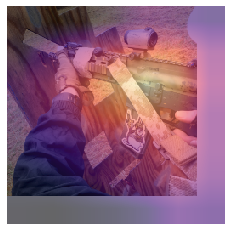

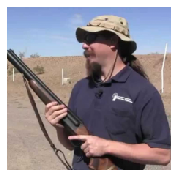

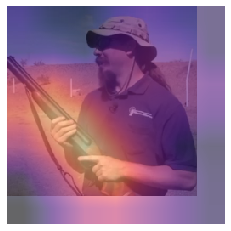

In [11]:
m = learn.model.eval()


def hooked_backward(cat=y):
    with hook_output(m[0]) as hook_a: 
        with hook_output(m[0], grad=True) as hook_g:
            preds = m(xb)
            preds[0,int(cat)].backward()
    return hook_a,hook_g

def show_heatmap(hm):
    _,ax = plt.subplots()
    xb_im.show(ax)
    ax.imshow(hm, alpha=0.6, extent=(0,256,256,0),
              interpolation='bilinear', cmap='magma')

for i in range(10):
    x,y = data.valid_ds[i]
    x.show()
    xb,_ = data.one_item(x)
    xb_im = Image(data.denorm(xb)[0])
    xb = xb.cuda()
    hook_a,hook_g = hooked_backward()
    acts  = hook_a.stored[0].cpu()
    avg_acts = acts.mean(0)
    show_heatmap(avg_acts)

In [12]:
edge = F.conv2d(t[None], k)
edge

tensor([[[[ 3.3873e-08,  1.3818e-07,  1.8972e-08,  ...,  3.9920e-03,
            3.9920e-03,  3.9920e-03],
          [ 2.0532e-03,  2.0533e-03,  2.0533e-03,  ...,  8.6599e-03,
            8.6601e-03,  8.6600e-03],
          [ 1.4199e-02,  1.4222e-02,  1.4246e-02,  ...,  1.7976e-03,
            1.7977e-03,  1.7977e-03],
          ...,
          [-2.0601e-02,  4.0507e-02,  1.8107e-02,  ..., -3.6315e-03,
           -3.9517e-02, -1.0415e-02],
          [-2.5515e-02,  7.0108e-03, -1.9336e-02,  ...,  2.5892e-02,
            8.8724e-03, -6.9563e-04],
          [ 9.0990e-03, -2.7635e-02, -1.8781e-02,  ...,  1.8491e-02,
            3.0403e-03, -1.6052e-02]]]])

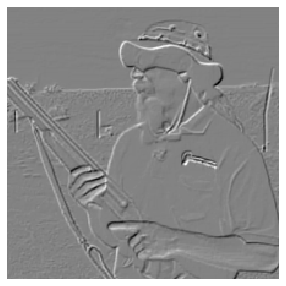

In [13]:
show_image(edge[0], figsize=(5,5))

In [14]:
m = learn.model.eval()

In [15]:
xb,_ = data.one_item(x)
xb_im = Image(data.denorm(xb)[0])
xb = xb.cuda()

In [16]:
def hooked_backward(cat=y):
    with hook_output(m[0]) as hook_a: 
        with hook_output(m[0], grad=True) as hook_g:
            preds = m(xb)
            preds[0,int(cat)].backward()
    return hook_a,hook_g

hook_a,hook_g = hooked_backward()

In [17]:
acts  = hook_a.stored[0].cpu()
acts.shape

torch.Size([2048, 7, 7])

In [18]:
avg_acts = acts.mean(0)
avg_acts.shape

torch.Size([7, 7])

In [19]:
def show_heatmap(hm):
    _,ax = plt.subplots()
    xb_im.show(ax)
    ax.imshow(hm, alpha=0.6, extent=(0,256,256,0),
              interpolation='bilinear', cmap='magma')

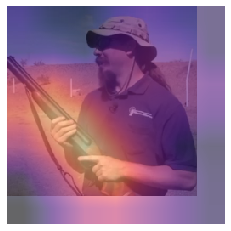

In [20]:
show_heatmap(avg_acts)

In [21]:
interp = ClassificationInterpretation.from_learner(learn)

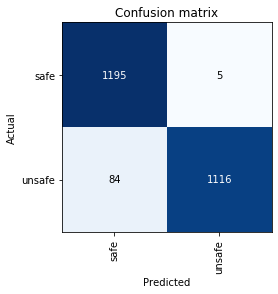

In [22]:
interp.plot_confusion_matrix()

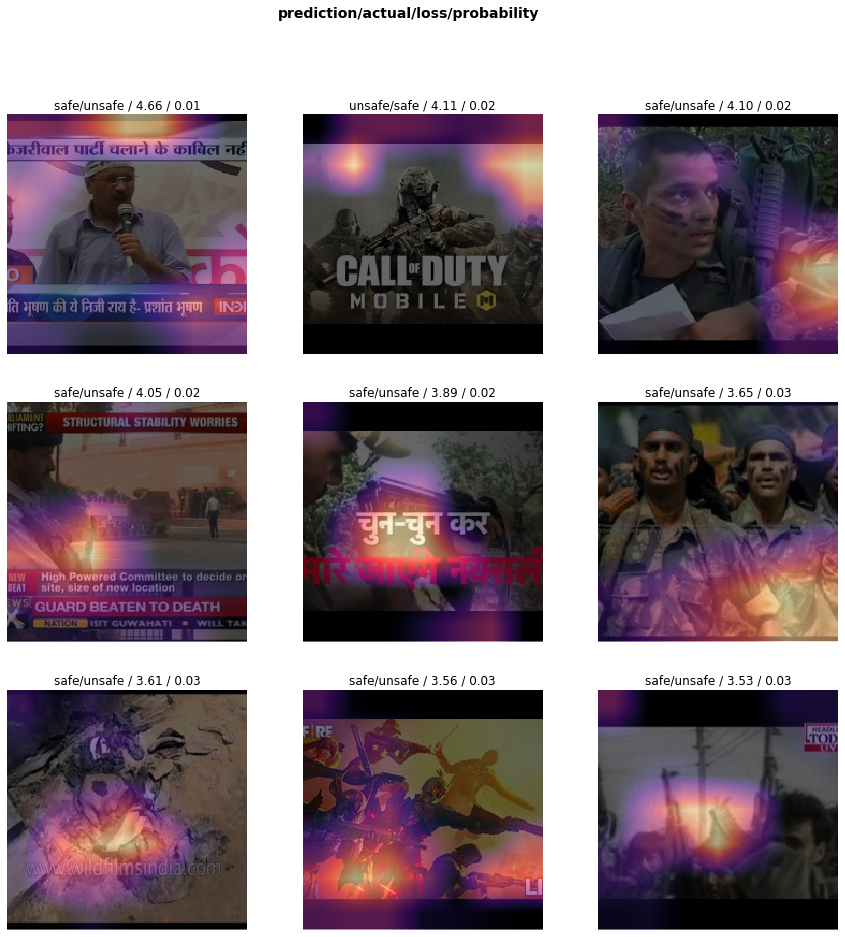

In [23]:
interp.plot_top_losses(9, figsize=(15,15),heatmap = True)

# Res50 Test

In [6]:
learn.load('./resnet50weights/init_res50')

Learner(data=ImageDataBunch;

Train: LabelList (31335 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
unsafe,unsafe,unsafe,unsafe,unsafe
Path: ../final_data_v3/final_data;

Valid: LabelList (2400 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
unsafe,unsafe,unsafe,unsafe,unsafe
Path: ../final_data_v3/final_data;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1,

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 1.10E-06
Min loss divided by 10: 2.29E-07


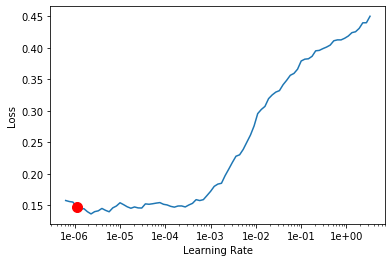

In [7]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot(suggestion=True,num_it = 200)

In [8]:
callbacks = [SaveModelCallback(learn, every='improvement', monitor='accuracy', name='ep_res50_v2')
,ReduceLROnPlateauCallback(learn, monitor='valid_loss',patience =2,mode = 'auto',factor = 1e-3)]


learn.fit_one_cycle(4,max_lr = slice(1e-6, 3e-4),callbacks = callbacks)

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.136240,0.142068,0.945000,0.055000,03:15
1,0.129988,0.106706,0.965833,0.034167,03:17
2,0.099126,0.122032,0.957083,0.042917,03:13
3,0.098531,0.102277,0.964167,0.035833,03:13


Better model found at epoch 0 with accuracy value: 0.9449999928474426.
Better model found at epoch 1 with accuracy value: 0.965833306312561.


# Efficient Net

In [9]:
data = (ImageList.from_folder('../final_data_v3/final_data/') #Where to find the data? -> in path and its subfolders
        .split_by_folder(train='train',valid='val')#How to split in train/valid? -> use the folders
        .label_from_folder()#How to label? -> depending on the folder of the filenames
        .transform(get_transforms(p_affine=1., p_lighting=1.), size=256)#Data augmentation? -> use tfms with a size of 64
        .databunch(bs=32,num_workers= 1)
        .normalize(imagenet_stats))#Finally? -> use the defaults for conversion to ImageDataBunch

In [4]:
learn = cnn_learner(data ,timm.models.efficientnet_b0,bn_final = True, pretrained=True, metrics =[accuracy,error_rate])
learn.loss_fn = FocalLoss()
len(learn.layer_groups)

2

In [8]:
data.valid_ds

LabelList (2400 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: CategoryList
unsafe,unsafe,unsafe,unsafe,unsafe
Path: ../final_data_v3/final_data

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 1.20E-01
Min loss divided by 10: 4.37E-02


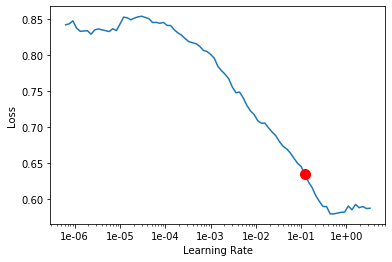

In [5]:
#learn.unfreeze()
learn.lr_find()
learn.recorder.plot(suggestion=True,num_it = 200)

In [6]:
callbacks = [SaveModelCallback(learn, every='improvement', monitor='accuracy', name='init_effb0')
,ReduceLROnPlateauCallback(learn, monitor='valid_loss',patience =2,mode = 'auto',factor = 1e-3)]


learn.fit_one_cycle(1,max_lr = slice(1e-4,1e-1),callbacks = callbacks)

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.249636,0.271152,0.886250,0.113750,07:51


Better model found at epoch 0 with accuracy value: 0.8862500190734863.


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 1.58E-06
Min loss divided by 10: 9.12E-06


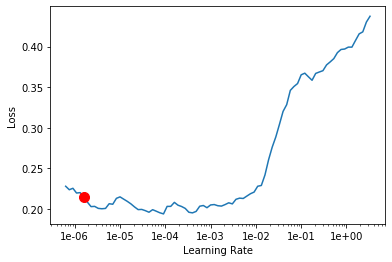

In [12]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot(suggestion=True,num_it = 200)

In [13]:
callbacks = [SaveModelCallback(learn, every='improvement', monitor='accuracy', name='best_epoch_ef_v1')
,ReduceLROnPlateauCallback(learn, monitor='valid_loss',patience =2,mode = 'auto',factor = 1e-3)]


learn.fit_one_cycle(4,max_lr = slice(1e-6,1e-4),callbacks = callbacks)

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.206426,0.225497,0.908333,0.091667,04:48
1,0.198026,0.223810,0.910833,0.089167,04:57
2,0.199075,0.206416,0.917500,0.082500,04:59
3,0.189168,0.204157,0.919167,0.080833,05:23


Better model found at epoch 0 with accuracy value: 0.9083333611488342.
Better model found at epoch 1 with accuracy value: 0.9108333587646484.
Better model found at epoch 2 with accuracy value: 0.9175000190734863.
Better model found at epoch 3 with accuracy value: 0.9191666841506958.


In [14]:
learn.save('10ep_eff0_v1')

In [28]:
learn.load('best_epoch_ef_v1')

Learner(data=ImageDataBunch;

Train: LabelList (24594 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: CategoryList
unsafe,unsafe,unsafe,unsafe,unsafe
Path: ../final_data2/final_data;

Valid: LabelList (2775 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: CategoryList
unsafe,unsafe,unsafe,unsafe,unsafe
Path: ../final_data2/final_data;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): Sequential(
      (0): Sequential(
        (0): DepthwiseSeparableConv(
          (conv_dw): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
 

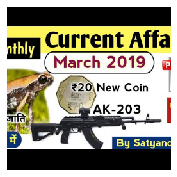

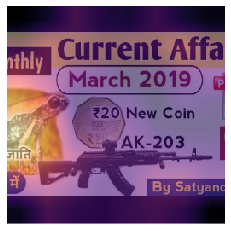

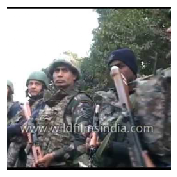

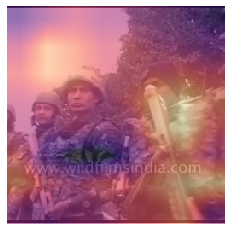

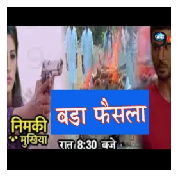

...

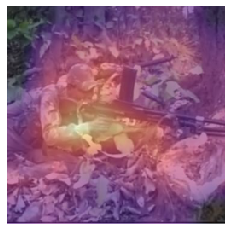

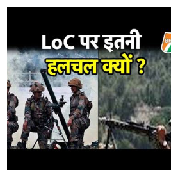

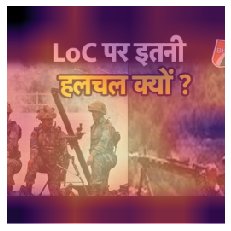

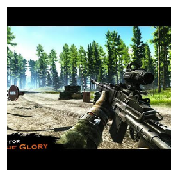

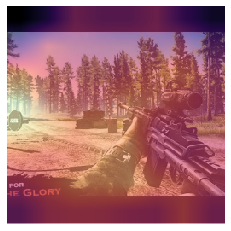

In [29]:
m = learn.model.eval()


def hooked_backward(cat=y):
    with hook_output(m[0]) as hook_a: 
        with hook_output(m[0], grad=True) as hook_g:
            preds = m(xb)
            preds[0,int(cat)].backward()
    return hook_a,hook_g

def show_heatmap(hm):
    _,ax = plt.subplots()
    xb_im.show(ax)
    ax.imshow(hm, alpha=0.6, extent=(0,256,256,0),
              interpolation='bilinear', cmap='magma')

for i in range(10):
    x,y = data.valid_ds[i]
    x.data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAOcAAADnCAYAAADl9EEgAAAABHNCSVQICAgIfAhkiAAAAAlwSFlzAAALEgAACxIB0t1+/AAAADh0RVh0U29mdHdhcmUAbWF0cGxvdGxpYiB2ZXJzaW9uMy4xLjAsIGh0dHA6Ly9tYXRwbG90bGliLm9yZy+17YcXAAAgAElEQVR4nOy925Mkx3Xm+TvHPSIzq6qrG2iAIKmhJIoaM62NrY3tyz7s//84azazppHthRI5KxIUiVt31y0zw93PPpzjEZHVVQWgCWH5UA5rVFVkZGSku3/n+p0TYmY8j+fxPP7yhv7/fQPP43k8j4fHMzifx/P4Cx3P4Hwez+MvdDyD83k8j7/Q8QzO5/E8/kJHfupFEf0zQrnyxE+J699/TZH++73XBEG6LJH1+/09Iuqvi6CSlnfMvysigpAQFJUUn6VxhYSigJBM5+uqaX83gmD4lLT42f9Glql67zXa6fH53PV72oPvuX/N9ZH7w+6dY/fOeSgy389RSSgDSiKREFMSGTUlxVGNeVDxuUjivydAtb/G6b/VsRQ/m/m/Ov+z1d/9d6OZUc2o1qj4v0KlSaNSqFKoFBoTzQrVJoxGs0JrhWYFo55+d7OT773M2f3X76+Drebv235+v2FW5aHjz5rzefwo48Hd9zyeHM/gfB7P4y90PIPzefwo45nq8v3HMzifx48yns3a7z+ewfk8nsdf6HgG5/P4UcazWfv9xzM4n8ePMp7N2u8/nsH5PJ7HX+h4Bufz+FHGs1n7/cczOJ/HjzKezdrvP57B+Tyex1/oeAbn8/hRxrNZ+/3HMzifx48yns3a7z+erEr51pcfHfKdK076sccqTvpZy7H3z19XoXh1SlSfSK9kkQcrUebKExJicnrsXjUK8XuvDkkA6+qTUA0NI3GvQkT69+iVD+9XPSTSA1UrfVh83jLad6hKWV8/bmC+x/vnKMNcjTLXoERFih/RuSLFq1KYK1Ik/paTapRYEVktN+uaJD8u5uca/adX/vSVMPFj2KJHqolfxPxiilDFP9Govl4q+JuzV6BITDxeoXJ//u9XnJxWrVjc++MVK6fX+GHGk+hT3XzgZZcyL/+pHwQ6kdPzTsAsenLcgbcAsQPzYTDGed8RkLK6B42f1ncGpyabnPx1CsYOsDU41oBKspx/H0D3gbeA9X2Qvg++uIasBcvpPT4GygfLxAJ0DtTTsjBdyeS+qh24J6DEgdmB28/T5Y6oGMkERH1e568lYPH5JlRJEGveqHHHiSYJs3YCMJuBFPNm9iB4l3NX4JXV+SdrcgreH2o8Cc6k4wdedgHVfQ16CtRTgC3vWYPyFLSLNuxnPAZEv48nwYhL1/uAXN456+P5ist4fykMexC8/vfT7+w/+oKvAfQY2JbPOR0JTupL1x/z2LUUeQ+UfV4e0pY8AMx51lfHZyDCrEX7Pl8AGWowXlOR+GZuqUgc6xp01mCzBm0IQhVBqVRRhIqSaNRVXesCuhlgq9raR4G7ms/7WvekTvQHtt2fBqd8oOZ8BHxrrdePrMHXgdw14EPHl+s9DkLgPSD2s9ZgXN/D+3e6Aqcsxx8Cw2LNPAxMP7aM98ze+ZyHjt3XdMt4CrT+0ncHtay1ZAfmGpQxD4oLSA3N6YBdNGYHZgein3/PnF3/Pr/myNTAqSGoLPNYzUihQcV6wbsLXKE5ME+0aA0TN4qt10XToSltDb41OE+AuwK0Nd8L8/vSI6D9Yca/i+Z8H5T3td73B14/+j747p/jAFw++RSEp2cvQITVJqFvmgVg+p4PDS02ydqnun/O/bEs4PvnPOWyfJeF/7YznrrGbD3E915rytOf/XWWvwOErIDZX5fVz/mz1tp0pUVV3Ihc20Wydh9OzGD1Tgn9L3NdKTQSSpXmWlP8jLY2UZ8E6BPAFdeqT2rbH3A8Cc78gT7nQwCcARpyGLo5sxz/88E3f2L8xslr8tjxe0CEBYxPWSrpfVR+h9G166MvnYxmj4P5zxnva85TLckMvlNQrrXhrC3pgpcTU3YGaP8X723zZ0bcJq6BCYgtALV4E8ZitfT5k9CigmKuRVHM2gxSQ2lkTIxE17aNtVna5AHQ3vudB4+falQk/biac5DdB172FHxPa741OGO1HzE9WV3tMcCdHJPTv0/ucAWsh7b9fC9rif/Aef/e+bv3BMAHfuD7JvA9YRRo7P7kAiY51XT3QMn9c1bgXb/n/tdYVjQA2883N2fvA1TiHJa4zByUama0eyDFjEoHjAUke1Cu3YuM270eTh20feYWc/ch0N43h3+o8TQ42X7gZb8FgE+YnWut95DJ+RDg9N7KP6VjdP3qAxtmOe/+V/phNdd7l3/itRNYfeBtpPtvvG9Di6w03fuA7D/hcVC+d/7q9/l9nIKRAJkHffz1dg+gQug2E0QWLSrIgyBNARlFHYQrf/AEpOJNxPzvpQnbw5o2Xg9N+zhgf7jxtFlrH+ZzfpsGfAiAfQGXjXEKvlPgLCv+2F59lF3xCMgeu853weT3xctDmvxHH/cF2gpETwFyDpR9D1A+NofSrxnAbCuAWpi44LDo120sWlSMR0GqGLaKTtv8H3HNBbTrc9IKsACpw3NOQ9m3AvaHGk+Cc7ThAy/7fn5Q7v+9AuB9/25tUs56d3XOSYTvRx5PgfVRgH/A9f7cb/Z9t8l7QIyDazCuz+tg4d7f98/rQ1fnmi3ak3vA7D892OwkBA29lATUetBI3POTuJZBitd6CsZk7bN3/5ATkK5B64Bdjp6awuu/T83iDtgfenyLWfthDKFT0+jbNeAMQJj9i1NJLo9uiKfGd92g34XY8X5yZLmP9459h3MeGh/MpfyBZNSJBSMPz/V7AHzk/D7W32kOCMky5/IAQM1mz8c9RpMAtdHEQWrzezyeq8zxJExWQBVZ5Xdlvm4H7XcCbID2BLBiM5jvA/aHGk9rTn0sw/b0+L4APNWmj5tFa9Pq/ufA+2B80My4d6g9dKH16Q9c4tvAdgKye+euxdO3gfjf0y54Sqjcn/dvPX7vWveFzHsaeXVe66/fA2YXhkb8bYtJu/iP995jMr/XTGaAWeRNsSXO2n3wRqRIeBiw9Ht4T8M+4Mc+RPz4M8bTPucHBkGeMkPvS92H8mAP+TfvX2s5vgaQnfyU91+/9x7lFK8ngI4dct9geQx8D0aO5cFTHz/O4+PPiUl9l7d+2/099vkPafzHtGf/u2vPNUBnMHIK0v57N4mdf8sC1HhjW63tDFYWcHcTeD6HtSnsgF1r2KdM4jVYF870jwjOQT9sN/w5IHzIbPouPs3Monrob3nguDx2/grQ0hdtAe1Dmu/bNvJ9zbN+/SFgfohf++j5fwagv4uZ/dD1v8v77gMUTrWo3AMmrIDLWsjKfKzfinmkaAYr/TrIDMr7gO2/3wer39f7gH0IrD/0eBqcyWfodP67fHt6vB/Nk0dfO+FlPvr+eF1O72e+k5WGs9VKrbXe+vhi7iwfvGZgWlxwPudEqCzRwf7hIvO75vtfv03if/eBumKoPQrO9YxLv5CttoPde99aMIjfa79hxd5fvj7Bdu/9jy3zyQIEih4IAsx/moG2QJRgDRCbhXPDQdY5ti3eLTFhfvsGYqs1W8Tleh07APvHLmC09yyh+bXuWZqstG5cS1w4NwOzQuqmcwCzWdedfREemNyHeLe9yuYJKH0LCQHcPzy98v01fP/4EsCZtePJxlyMThHnDq25mX4tey+Y8GDYfp7gByStLXe4SLj+93JD/T01fmdeGJlD6GuLRVfSwgFxCkqx5Yt3Huh9Td9/Td1E69//3pz2F5q14Jr65y237xPjGudxfqc/k8rWl1zNzb2b6scf0IqLabl6d6i72c04uSinBy0ErNqs9TyI4w8wUhVkXoPY+Ks1dbD6dSzm3tYfgS3nWppf64EjM5tdmX5LTbTfmv89a8Rlz6jY7NPOAkScjG9xM12ovL8EDxzrN/GEZfMtASGNr3tfJD5yxZDOM3gsgCjraKvfkc7nCRK8xB7dVVneE1+NPg33wdkndZGQAar5+JKybrNE9Q3dVlqx1xXOkhrA9CQHtmzAtsyr+Xfo99mv4ZJxTWSEvnwa15P4w68V15DTFeuKcugbmeV87UjpR0VnE6vPpf8eucF5/hZ7wk4+KQRB/N0T8yeulJ2+bw2QRUGs6278XtpKo7n2jPlk0ZqqCWuFvJJ0J3nK9X3Isg1PrKOT3+t8zOjR27XGXIJK3Yym2bwn2krTmiP0RKOeaFmxeV0WoWartV0rCmgzK/jx8SQ4//pvf+mLrMvm8186cE7FwVxtIl0jCkll3rwnvEtdQJxYtKiom15dg/bw+0O/C65R7vsTfXM0679bvN79E4lEs7/nOE3U1qgNRBVRpc2Zb5k3RgdULUZrjbm8SRWazZpNLDadQFJFtW99J1WrCDn5kbzaZNK/GGF+LjMLYn6PpVBbbFkzhpRQVVQVM6jVaLXGuinWWpC4IauSciLH7p8/waDURquN1hrNBBGltvLenljw5aKyCxUzfE4Ai8WzalirbpImoYU0FE1sxmHW5rVCrY1SGrU1WvN1bc18Hd779FkMnt7bPe0k6dSiAmaBvBbomjXM/1jXEBw5JzQlJHnWvoVT7N/T93UXht2E7os514Te15hdoHwHzvST4PzF3/wSTaDpFJwSwLqvQXPy1MtchKtKSv4ltJuvGvnOALgKZE0z8DqYE51OZrP20PkjbfY9J6u07svAvd9XYF1pSkM4TtVvRoTbuzsOx4lDawzDhjRkSmkRIVy0Ub/a8WAcDw7onBKiCZpLwq4pzQwRIyefg7mKQ10wDTmTknCWlrkQg9q63lo0qCAUM0qZOBwnyjTRzDXSdhjJOZGSgimlGMfjIQDrxcalVKxVNpsN2+2GNNzfFspUGvv9geNxcmtDE1Mr90zGnovU0FxRm2tCbY2pFqpBin1gLT67M3ZakAk0sduNDENyIVAb+/2R27sDhyrUEBSlWQB0iQZ0gduTKrPVIu9TUjT1IM5y77PGXFkA42b065iBNRduKmzHDXnMpJSRJCAVEJo7zYgqiJ4wiiyYFR2czR4AKAHOB46vx5Pg3G6yd9iwujJXF03Yv17/jCQWQLTZPO0gc7AKSdfg7Vxbby2R1BdOxchJFjPWgrsYZrKIE8JFBbG19BJqi5xTykylUZsnrg1j3Iw0g8PxCFKprWIm7M7O2J3Bze2ew/EYWiZTW0MUNLmB11r1h8BuhKxwOBxJCq0VJL4bhpvpMfdDUobkHJKkiorN85AwRJUhp3lzTbd31FrYjCMGHI9HaimI+SaQBkky0io5JbIogyhJklsd1iAr1owxC5CQIVGrFx2rVYY4t2/x0hqoYVlRy5QaNoIm1yarjTykRKkF1YyEFumbtZvrrRa/sgg5Ka2t+LCBFiWT00CrjSQJrNBqGIHimjtJ8/ucTVEjs1ISsigJDc0HzQWTKC1s1ROzFhzws6YXpBbykBmGRGswno3klBiGjKZEKZVqLogRZSoTwzi44I75mTVhctJ9sxBGbc0dWgSISQ3h+ThCnwanFsAlcJ8MAliL98P8s1n4btJ7wMCgTrlS8Z9eCmsOLvCinuyAlIgm+mJM/rp0gdBFkJuPKmEuWteSruFamE8qsBkSpTYKhokwZKGaUPeVaXINhChqsNluGC8vmErl9u6O2hq3t7ekYWTcblxbeJyWrMowjmTxBcYgJWU7Dm5ql4mpFKCRtCJSApjVrQIVhuxPit5odBaIav6LzQZspNbCNE3sUoKUuN37fNDc9MxDRjDXPjEnKYOob8FaK6rGMAyh3ZRWKqKTg8cgq0v/MQtFDLGG4Mn0atWFovk6uwYQjMJmSIi6KdrdCvfZIzJgLnREFE1hbttENfzx1Qb7ckc7FDS5rTFsM1vbwNFN2aYhWM3N9LbyOX3/6ewW+T6Zt71bX4DpYlrWDlKDKq6RizUQZZDCNmVeXOwYBiUlZRxH/1wzSlWO04TvJBi0khByyrMf2nr03Or8mQZY09kaOjF1bYwndz9O+3sanL5rFp8ofroPtQ7lS4AzfKpukooxaGg69UlNarPJqxFOz6mxGKM9YNFBGCZxp4LQ4m/rQio2jvtKffJFvS4hqZDNmEpBqqCinG0cRFnMm0VRkVbIKmiCtN0w1UYrI1MxbCrkcXQ2SjNUJ6/KTwbqpqhaI4trrrxN1DpwOB7JqliriDWSCCm0/ijq36PV5Xuq+4kALYG2Sms+N2fqG78IlKnRyhFNylYMteZCz5QGDGqU1lCD3GrMtVA1hFzz1h9ikDE0JSrGJJAVJvHOA0eJQIcR5qEDZsyDa9Y6AdX9Y/WeA2oBIu0xgl4hAtmE1jW2VbT6vOQ8YOI9gw4hFPw6YS3FnC3JkzBsw9XppJd1dwYw1wYsZmwzLylrkdUpoWw+uTxnsxk5O/M1doHhAqG2xqBClkSpAcLuskUQpfN5w+I+yZH3ze+aOnxajKlNWHPz/QPBmWeuvYSIkjDFZr25ZlHYolm7P6naSKHlVIyUum/ZZhNY1SODnhZpMbnNzxMNUIefE+BNKqiqBw4AC7PP8SsgYcRoQpv7SVMtpJTRLGCJnDaUGjWAAmMCTQMlG4epktPI7f7A4XBg2u/R5IGDZPE9wjws7egEaLPY8MJmzA5UTVhTWqsu4U0YRBlUo6VHc3cAb8OBNUopYJDVqGEtbEafldKUSYTDsZEVslbXgHgQKKtQmktCASRMcTeBZTExzdt9SGvkpB6gS+rTllyL9oxjw335Jh4TSBH39d5bGua/zgT0DiEJf8x5r4IlT5MkzZ7rDOSJMAeuPFLv9ZQuvB34PT5nIcQ19onvM/8Mdy3cgF7nFlsIl2ruC7YIXgymIImPX5wxDIlxzMyVJrGvJmuIJCQJmUwNG1+z0tWJhWXmSiLwMGs0dZ/cPNhltWG1cjzWOSj5QeDc5G7KCK1PBoJIW/zOlf/ZLKKE4h3cRCop6Rx5zMlIAdyUzLVo1BeouNbyTRxmsViA2zWlztHO8Fu1RtpEZrOrIWh1qWuxQSwBOcHhCBIJhewbtlSvAUTVI6himMJmcGLZ+S6jSbi+vmWafOGGzcYjmrhPJTZiraAmbqLH8e2QY+Ol8Ke6Oe6mbE4afrphzYEqqph6VFZpHkxSRZIHSqRamMYJa42kjZzd2xNp4cf0gIfNADAETb7h3cBp82vEeopBSr6JxRo5gOZa1tDY5MEimIN3KhIEc4n9GHbQbBIblhqY540kuT+LVXJS12KtYtIQiUh9CJdmvufWaUEHpVtk3YrTLuilM35sTo+o+f2ltmhP13CCJmVUY5M1cpkuDJIljnWKus4Wa5Hc9E9Kj+LTBU9M5ZK66u6Wr0FrjVomaqnUWpmmFmb/4/z1p8E5GK02RBNlKrPoyinTqoWkShE5FJBKa5WsW1o1VI2sBbGB1iqjGFmi/Do1VLzfCzWRNJGTMeUGrRe7dpNYHOQB7DnoNOcENdIFKXyJvjkTRg0Jb8iYqM0otaEopkIT90Nd8vmmG1WoYmCV1NwMugmT1jedR+3cPlK2Y6JMxnYUNAJZWRppgOk4eTeDiPyrmANKK9uhJ9zNeWO4tszZKGK0amFJtChcdy07qtEGgSYM0lwLqzNDsQmjoqnSuwKIVMQqKYqYS/eVaahFAxmLDStG1oapzeZgDQvRgNqEnjEV8Q3dpDNlwqVRpaerpJlnmlCf4xD1LqS9X7CVhrTGABwxTBoqDtolUCsBwu5jRiInEsvJI3NAY5t9f5q0MDGd0mJqs9BybWekpOyGxpgtrK3YC8379qm6y5SyUqthUhmHaIfiJiWYUQP4HsAOw9qM0gVCLVh1JWSqJJlQVcb8geAc9MhUjygZzbbkIcWwtDi3OTk4VI0mDeWADIpqo1klpUpOwpBhTNljVuo+lloFicBRApEKEUTqlDgHZyTWhbgHtxh6grc1o5Tqlqy4s+7BijZv0pwzFTgcK1OtcW3v1Vqam9eIL5oYVBEsTKUxe0QxVCGJ5KyWqdAwxiExZHVNCngC3CIdY6Tsmi+JkTWxG1OYo12ShDEozecF98FabTQzT9kkFxSt+uaRlNz3lhZ5U48QjqlRpJtYC8Gj82VSuBuYa5xMcSdCBEuuJUm2AqYsv6clPVAjgGREO5X41ytAusbrlA2v0+yMMFdrZu53CZCHzGhdAEBrAlYjABTWlHVfNvznWWMaEvGMMUmYwv4ZHngJrWhuGWhsoHGT2Y0+j62rP3Egk4XaoHfWa1ZJuH/fMFJavq9EZiCpMuc9Q7Ec90em4xTprYzUyjgMqITf+iHgLG/+ibOzMxRlKsWlmc/THEYXDa1lDSFxuL3l/GwHVERhO/gXF8CmxlHP2J29ZtSPPQ9lE0narBVzCpCa0hsCqzT3idQ1IMoMTiWDVWxyySes0zdObyjVy3NrLagkNjmxGT1lUKrL8iRCU590zzWL34skGsL52YDcObDMLDS5IDTG5NcbskQk2oW4oshudHBqYlDfqqUUNhmP3hK2GW5Kljoh4oKsaaJIZZoKmPukOYlbhy2YDWYIxTVUEjcNk/ue6/wb3Q/DN5APv39rk292PFUgkZet5ia/kwIcoI34ad18lFA4GgIlgiYmYf4yxyq6SS8CtSwukGbFaqXWRtbs7ksEktJsJnZt2akPPW3nqjSJA1xVIsDYDeAIBjVmM1tEycNAHgZ2ZzusHGndr0wjnfCcNbvQrwG8MdMsoeEDY8y0Q3HbgDId6GScUo3bQ6EhpDzQgP1x4jhNbLYjNNjfXn8YOH/+2QX7w5HjsfD61QumqXBzfc3Ll6+4vbtju9lQSuHdu7e8evmKWhsvdjuXdgpYYTM23r19g6jxs5/+hM+/egttQ9KP3HcNaSfdJEiRqO/SB3fsVT28uGhP5hxs84g4OUUUrhhixe9BorZAPIdqCKVWWm1kSaSsTM1TO9WimX+YaEkFq5VRBbYbrLbFTG2GJvU8ZlaSOBe5+8xjbMKsaY5ci1WGlKgqLpC0bxbfRq0ZtVQPhKXkedNGmJgFTOcNKdlCODoIektICx8sYdSwBjoXtSe+NXWLw+JzK71BszsJHvzRTgIIoNcgG6jOTkf0+wmTtwfkwNdKV6wgXKBaxAwIC0jC/PUayQrhe8PiwrgQnnG+Sp8w+6gdsNqvQ+yZeJcmwCT8zNC2VOp0ZDeoW2OaYk3c3sgiC98a3MKqlVoLBPvK/Vdd3Y+7DKU2jqUxTRXTRLPGcSpMpVCrkbOGL18/DJzVjnz19Re8u77jJ+UTNCmf/+EPpJT4/eef88nr16gKV9fvuLy84E9f/Bu73YZNHvnm66+5OB/45PU59XDNdjsyyoEkB1q9ZQj2hktAmxPPc5Q3NHOX9kSuU2YNyuwDS2cVqWINzGqE3sMEEveBsoibTAYlKiMQ8c1J1wY+w4IHLjyqKaSUsDJwddxjzQGc8wjNaMWCPK1kDUGDkFVIkfLpppxHVd1U98AHLFqtMSQ39aSTKdQDVL5BIuKrHaRrwr37R74VO70vtBMeZJIQKBamYtc0IE5JNN+wTZS5yVbk8Wq4xaX6Pfdjzfy7VAOrtlAx+13EGtHdofhcUZnNRY/KB7k/JZDkyfvqVoDnmN0q6qZbNwf7HPRc72wkzmZ9D810VpML3dYavU9KSk7Z1Fhvd9HSbDIn9QxumdMehlX36VNSt77MDYVWCc1p1OrfpzY47I9MpcRUuNBXgfPd4030ngZnqagKu83I73//e/7u737F/u7I2e6c2+s7DhcHMCNLok6Fm5srWjnw6uf/gT8djhx04mL7EW9K4ePLTyiHG9QaSkXliGlz6WaRVgj2uQOqInkhzbl/EaZsJLe6ZPUJiSS4wDgoQQDE8BKlpQql+3bBELFCTi69e8i+2mIMDkqwjhq7IaFnW2ozpnKMpH3z69dEC23nC2qR07SZ0pdCGBGvqYZ/ixtxomF/SfcVxX3DFBrMPKDgTKpOtrB5Mwo1rIuIEIYwQ5ynSvizYh6dnWmFIhTteThmfq0HelzbSOSQu/ar4XhKi6SXeX6ZkDeOYYmcs6+ZdSGLW0gd5QaUwE9t/qwTlbieLLEHdwl7pmApglCMuTv1gk06BdLCMuta0azOgBuTxrHm+0j9vtxNc9elq+1EKA+VyIF2KUBE/SPyj2GSPDpuyrFMHv8I9lJO/qCIMWU24+MQfLoTAoVMYWpHXp1v0XLg9eWOdrjh5W5gQyOPmUM9sE3GYBOblBilsk2wUeNwc8WL7Ybf/ea3/OIXn0DLOOd7mk0UT5PYbK52LelmaXewmx+fgRm/h0lL8+gcaDCOcJ6jCVUW04QIIpk1UDdxxzxSnMHmaYQwcZt5SZeIEw3GBMNuw3E6kiy6pKovmJhHVLv29xxkfI+Q6kFRdukt7hf1vqlOim9R3eDHnHchkKDQN1gjKeSs61SeX5Tu+8cGsvjZGoUIliX3jTQRueKYlgg21WqU6qDTtvCRNaKOOWcvEBDDSpv9XhMnWKi4fyqhVYUAsixBPCW0f18HYJBElsTdvnjgTXVZtFg/WYNPen6zkw5k5l53q0ostGXY0t3qMNwlyHkgz3Q7B35sORdIPeBERHApLmQjziLWKM2jtqX6vdbmBH40OtLXSisFMWMQYRgSu+0WtcqY84cHhO7eXPNqd8blZkvOA2Wa+Oyjl6RS+OXPf+abthYuLs5hf8cvf/4LEJhu7virz36CtcLhxsA2vLz8Ccf9wHHfOD8fSFpDc/rTOZCKykJGnzVcgCMc0QBo8Hv7+knzXFPrebIUQcqCmcTj9ZTWigdptCeQ3RQubZof4OOke6gSG1LDn1LX0C4kGuNuCHqZJ5drrRyPBSG7udp8QcdBVuH1rjEjiEKPRHat0jz8T2dRhUGmQsrObnL/29+TkgufHjDpyXAVISWwZlQa07EiVhiy82GdMqlB/YPaCrXYyqETrEWVT+ehSn/qiJvMah55tqinEgu3Ap3L71qLCK+6D9uBk0TJGpya5oIhbUYgcz1O7Pd7pmmKRH/wV+lbYuWu0AsKlsKCLsAleN19D1mck6Iyx4syFGsFUnZ3JNwfN2s1siQhICzI+xjgqcVjqUylcazCzd2RUgKsEQRpFuwxhS55xJUAACAASURBVM3o6cIhJXajcnl27rGCFYnne4Hz3dUVdlUj5K6IJFQT5fgNIr7ZhcXX8RC6zP6E+1geoat1cnbO7tLteZsQvGKj1YZIw8S5vEKKYtwAqLrD3st0OjBFBR0VK+IxgEj+9taa1nACghmyokkJMGSP1npy32lyqjl8pRAYqYfSvdzKErQimB19A4vnTQ+H/Zzf9MCAYaVQ8OhuTyloTqi6Vu2tpiTMNgtz1rQfFzRF9YMYCSXliNDia2LW5nI+Jxl4Un2RbwbFqMmT6Dr4OTRIGdSpoQ7MVullfjM4Q8D4R7plUFvxFYqUk6n7mhIUwW56t4joo2GOssQLsrhV0X3QOWCGsdsOtDJRpn3sOZutmu6v9kWczVpZhHjXdverVAQ344dh8PRZ9l3SYp/6HFpEk/sEyqxliZ+tNao1punIze2BY2lUkpe9hZDuz2NNya24XjCxGQbOd1vOtqPHXKqX/H0QOD97nSBvaJZp9Qy1Qq23qClopugGWiPZkdYKo4xMpmgeKOWA5BySwcibDfVwi2UQveXumy+RYWTYjLTDDYKnC9DE5etP2L/7hlpuPFmbld2L/0TafcRkDbJHF2tTBo4AvilTRogqCHFpHcUsSBaC3xDmRpkT3a6RLASDOgcW58lWca1RIhIp2RhbotUKNjEobHeZ27s73yq1YJbm0rBSC80UGfyaBH1uTBLRPgvBYAzigQa6SW9hBqbYOFIdxIkIRFQk9VSWRd4zcSxlztnVVv3eRcjJ01Jp9E3T6zq9+3mK9JVQK7TqOVZrgpqGjws2BQXODFMnHAzicdIarp91Ex8X1N3MxQxtjZQ8sq3iHy5YsINg0ypslHJMVGu0Jk5rJK4d4rMHCZP2Z/H0WMKSRDErXuWk8eSxCD5lldCCYYYLQWF0dwgzJ7k3mXOjGJ4Kk8Td7cQ0+f6r5mZ7r3jRjVfaID431MomK2NWNlk43yQ22dclZV3MoO8LzlcXlzBmdMj84Q9XnG0zu80ZtMK43fGnN9e0UvjJR5eUesSqMDV4e3PFp5++ZApJc77b8sVX37DZwvlF4m7/Ja8uthzaHV/+6XM+fXlOKxOqiZQyf/z817y42JA1kdJIbUeubr/ixe4CHRKoB0gyukhIE2cBtSDqq7nPEUn11nwzeajeZiffay7dp/OobZu1x1qiuv4LHzI5s8hM50DVmAMssWF6SN8t0epTbb7DnHqYQw1EoCB8qBEXFK0TCMJC6O8lTDbU/SON9JEbGfGMj9l3bZBCoxhoDs0quBbt4FRFis+htQiAqH8va27aSnBKU3YOsffkkUjRRDlYc2K7IbTmcKkRiK5hl4oEaUIXzRZhGzD3W7MKQ1b3aYO11U/uJYPEGnX95mu5mLbQo+PdtPXRasVccrqloB7F7xHwfjdL4NBTJjUKCUTSHO0ehwHJeGni4UhKOscs+ierCptxYEj+nTTiECmpF098qM/5L//8Wy5/8jE//5v/wOG4Z5MHzs9Grt6+YbcbsXoXgZAD33z1J16+fEEz47B/g8rAbjuyv7vDrHB1/Ud+8vqSXVayCiNKs8rd26/YfJQ5tgOf/+5Lfv7Xn3H99k+cDa/Z7F7zr//jX3n9s1cc5IZzCeK6qtPRBOd0inQijMtDc5UjqSHNiRNJG60pohbSuJuWXjEDTnK2iLiJdd6jkOnRxzg/aZhrvdO3sRmVti8RvXZN2JrXcGL+t6ibfBJ5S5FG9ztT7KxhdOFTa3HTUHX2PYGIusaWTuYAE4mgWdD9MkjrpHk8JYSEWavk7N9BotA7t0zN7v+1ChRDkj9Gz5p5+rE1DxKZ86K9NtPvR9QQSTSBUiuIt1huHbyIk1UAp+55gr+zizoULKwTDYA2hRLmqnUU94mYc95RzbPatzoDWbsL7esmOr9n3VrGCSXdx/QgnbTOi/XARq3VubWECZ8hRbeGEiDuj4Lo/HHF65IH1xGc7zZs1uWRszT5AHCOZ4m748S/fv4FMmxJQ2Z7ds71m7eklJ2IjZCHLejA2W5DKo1xEMYhUSggR3bbHeMItU3AniyJTEYp7DbgZIUNmHB2tmV4mxk0RUmYcXfXkHFwzScuvZK4xCs9th8mbCOiunSAgtXwyQKYPRDYfY6U3BdqBlaCNC9Rcypx/Xlf2ExD6+0/vA2HUlMEAMQBp16K6ThKvlApNF9r05wicGI7EaEOTZcSrYmzdYIE0IIF1Jk/AkgmNLyH93tlTgdSi5wrKJKVNCT3N9VrLXuaR0qL9XTfT2POrBhL7yGQ5OVcCk7EEMKE65/lGr+JUptXvtTux4bg054P7pZJBHyswdS8a4OENTFEuVWkLCPu4H94pN/9yVmzhv/pIF0eWyVEMCjpXIXT5dzyJDefu2aeJunBndp6GZy7IjklplootbjWLC2CYTIzmjrYxyQeBNqObIaoejFvBrCOPn9vcDIan/7sJZIH9jeVzJ6clJeXGU17qt3x4sUZaaxszhN5GClSSCkxbDJWCuOYGbcZxMiDcvlqh+aRaV9Ik1LVSLutW3A7gU2m5g1f31Y+fXHDz/7+FdZe8OLTX0FOGBOIt/gAp8URZlWvAHDLcGXQKJHUD81p+Hsil+VkA89LTZNxPHprDU8mJ3LXseGPEIEHs/DLpKEZbFBKqQiFXhXRaiElwVqhNqE/FbrnaZs5l1i6uRmpokE8Gd9RUVpzIWOePDfrQaPIV6qbjpNBKwVUSCitljDRFRmVNGby0LWHm10qQp0Em6KsqedBI8pq6qkeEU8t1ea1qzTXOIqTwjFhTBnQmfY3lebpGYvibLyONuFVNV3oeBzAOE4lougdzEs/qaVrQA++de3TNWHPhfo5KQgUPRg1BPssZ50pjF5B5RZHa+E/RpR1f6gcywSSyDlxnCbyMHKc9uz3R6ZSMVPfg80FdZ57OnlwbTs4gyxTkSZz+qrnCz64E8LxUHh1ecZut+X//vI3fPTqDNodH12ec72/JenE+dnIMPjD1kiV7WbEtJKyIa0hGv+SUdrE/njHJoGkxv7mANo4lgPDkJGhIhmGsx2lZd4d7vj0k0sOh8p2I7QchqVG2ZPkrv7mIIoM6nkQ4rgF7TqkuzWdfVARotIEiBxXTkLLQinuL6fkYQSNPGtPrGr4mqYCplSrlKkh2aOQNbQbEejoj67zQpZo32HOFjKWJljizuecq+tmcwsTuuIVI6GMPLcb0WwR8a4T5oEuVMjVa3IldoRkcQKAxmeF35ZT71qwZzpExLV1SpwDwz9KkGoMklBJmDvrYf315lfOsxVVLAVrp3Uz2InjSRqahFKFJo2pNEo5LkLTuuXioHfhuKgaV546+4q9QZfN5A1PgntLGAdMzkvQpxdyW5iYXuoVvNnm5vlUJrpKrq15G5MAU0pKCpfYzMvJPLAYeWbxpuw5eepqO24YcvJ0XnCkv62P0NMlYxt4+80bLnc/Q2rl6y+/4NXf/hWf/+6PfPqzzxiGHV9/9Q2ffvSp+5hnO95e3UQk1E24gn+/nBPTNHFzdcv19S0fXV6y2QwR4vY+OpqEcRjYbLZ89Po/8Nvf/ncuL43Lyy3Vbsj6CtUc/XgHpA1Y20evYo96eNDVF9S0bygnYvc6Q89ZRQFvd1mboOa+Fqj37SHYKuo+Z6fDqXR6vIWZCsmEmpcSJ+lBPnHTNmkIDwmnKrk272R+iY4R86O0pH+CtwIpAcyGv19E0CHPDcRShHe97M0J9ZI8b6ER2UShiVG7oFI/R0LAJVEGRjpvlMnn1Hp5VvO0iQ7O3dUuPKosMlLwwuluUPaiB5zy2HD/X8Ui71q83KoaagXTYd6wEubzLEhtFajB7623X+s/ehDGyQ4B3nCRXKv1nDARZ+qgXuovS3Xh2lpDU17Ow9MfJ+AUX0ekp4TCIol190BQimCQ0wJ9v9X+LT4MnNWMqU7c7G+QBGMeubq9oQBXd7dUJiqVN+/eMNXCN998Qw2q1/XVNahy3E/cvrvFijBsB5JsefvuCqZrat6QdaAciptxNTHtK0kS2+2Wv/753/P1F79jk0dsuuJieAWaZ5PTUN+o3XmQzriJiW8B1Lb43aIe4BA1kvX6QpvZK923GMeB41RnBotn5C1I00QU0Wa/R80bavW8aF/0mWa4AqD7RQbJGUYeSjUv1wqT193cTgnznj6VyC26yPDIbIrz49qKoNGRwhugRbQk/HdyECuka2iNFrvNhaSMgFCLiwKpndTtjCCFEAYONmtBnsdTT9ZiTm1xArtv7fcfS2XetEzNTU5LwhSRFIlrOsuIoPoFW0kkmHrdabHZ//ctIAHAMCHDzBSJQF7PawZCm3lLl94wujYopVKKN/2S1ePka+l2DB5Z1k6I6MywLhQ8DuBlkh5/ydH9rQekap2v9GHgHEQ43N7x5uuvsdpIG28EWkqLLnnCNBXurq+oxwP7GyJhLNxd37KfJrbbDYf9hFhCyLSiHA8wirJvXit62E+0YgwM7G8PtFK4efs19VhgUvY3R9pwy+5FhZZp2haJGUD0SWImQEgPAyJB9QkiNx4t7cLWSUfmZHaJaKgKu80QFQiT012lV/6niBJb+DI+4dU8fycBAqWnGFi043yPof2ANPQATwNNbgZ2HhoOtjkZN7tc7gsWa6RhjHpXr/+U1sje9GUhEOgSVJKkkUoQSIqliAT3bnU5kXqO1CZaBFWcmuERXDX3NWk+tUj/voR7sPjEEioq9znp82ZGqxG0SRlIjDVjpZNMXKj2NZujtRH80bCALADqL8vcQqcv8KyZIr4QlZlo5NJarZTWSwc9+FSat+XcbDaImVcxWWOaOjAjaEjECFro3a49Y83Da/DPCZPKOcaLvnwKnk+CM1miHg7oxTlDHjyqZbAbt0gTMgopIbUi1ft9Wmy4Ycwu/VvjuN8j4myZw7GgOgCZZhM6CNO0J8kZmjNv3r5hEqc77W8najnw5Z9u2X1yDlpBI3coJUjirsSi60VgtZtUPpGEBhUFqa7NZj5YSHYPePS8qftb45C4vTswTYWcMikYRKqdgdKX2gn0GpS0rjmF4GxGkKd31ZIkSE9HJAlSuWtPiXrN3ulwDm7ATFqwkERpzDAkmnmE081UIaUMZpRm9CbZkjwuoNkDTSKuKVqYu9I3jbgP7ZrLWUsSWtyLLQQdo3tC8aICj2SBNsOKm7piOoOm78Kugf13L4AQ9fYpZl7yN7Xuo0oE72Qubhbpls7SvaGt1rEHh3ogyX3wFkSUJcJtq3aVZl49MpXiUdm5IkewXlERBeGNiEV0q8BsXiPvQrEQCmYBAVjz4v6ck1t7srCoFtL39wTn69cfs9kMHEwpCQ6WGGTkur5hpwM6nAM7bNjy8hO3z6/vbhFR6njG2Q6OR6Pqlpz2VG1sdufc3v6R85evOMe4vbnlQOP2tpCHLecX50zvrrm98gZId8fGq9efstleRANnpUVdpiXXkJ6k7wEeIhAkix8SQqVZENW7mp0Vr8w+kWkNAntjNwjtaFh1+mGpE3UzkMW7INDNVYEsiam6aJUUIXXrpov7gi3odtaUJo1hzOybF1drdrHbW3SgNgMIUXTTGC0xHScysB0Hbq6v+H/++f9iKp4A1wjyvHr9CZ/+5DPGizPujkfnxQo0TaEZM6W5NnChAzkiu7k7TERHi+zVNhaOtzF5VLc234vZ6NQg9+/Aap/7hjeN90i5qWAtzeqsWIMykXq/J/NOfj1lRjCLbOWWdKR3cOWo00R61rSFpeH28FSafxdVjsdwI8xZR9WMw6FxNKOaBondO/83jHYodMPZ+1P1KifX/H6PXlLmKR/XEi6EPEXjwiiK89Xvz5pRWo32OB9I37u6q9xNxmTKy49/Qj0c+ObtW4btBV99c8PuxQXjbmB/fc3tzR0tjeTdOS8uduxvr7g+7ClpQ8uNy49/yuH2mj+8veLs9We8Obqa21y8wspEK4UjxnVJvPzpL7i5vqGUCT0b+OZ2z8ufv0DygKk3TEb73CyMDAvpbmFqgSyAJfKBESHzOVv8Fm8Z6cDtrUUaTgqYWvUqFCHIBATDyNAU/q/50s3pHFn661aqBxLC1zHxcq4iXcIvm06dGb5Up0TQJttAa41BvGj8qy+/5J//5dfU6cAwjl7krcI4jkz6NTUpL9pHfPLZZ+yPR/bT1Leu5znRKJvyFIPUQj3u+frNO969+YbjzR13d7eM23P++m//jiFlb2spcGgHl2shDEwq1MW87JUic4c9nK7nNLfovwTRFtLTHd1uzRqBuubXa0gUm4sH+TrUrbsGMrsoXgQQ1gASlSJhycSHaErklClmHKeJY6lUVp35WotKHHdKPaIawBci0u+gVfDHWyQlC5hpEBJkLlxIqvEv5ipSVXM++omI0NMBIbKbr+OG25sD03GPkmimpLxhf3skjZmpGrthx4FMtczt7R4pkHTDx3/1NwwXLyBlpH3Kxd0d5xcvOBzvMDN2u13Y/c6DHMfMkEdeHCemcnQZKXDx6mMkDbEpIhgT0VfpNXSGB3C0+ySxYFERL30TdEZYmBVuOcaB+XUhmZvXU4m2m2ECa6fUhYnay608kNFm8zUlzyuWppSmQZqu/tyQ2L2SIg3Sk5zR4Nf6qkXQptWC5kTKiaurK/7rP/4f5JTYbQeKVXRwDmnebakivLm+9r6sw8jZxTlnL865ORyorXprSIv+SWL86Q+/5/btW66++Ya230MzyuHA2W7H8fYKIiVmzUg5eTqG8PEqIQQ7lS7MeJzOZ4YTFxJQbOaqzmSCBphzpb0IPdZIPTrscYAQXRHsM4sqF3qpgf/eZjcl/gXbxCPeRMcL5/HW2iKn6h5oFxgizuDppmsKJeyfG/sIoqbWu/nnlEjqedo2C/zFtDVrTvW09SsyC+sPAue72zsuz3e0w4Gv333NMCS0FrbbLeV45GK74/ruDUJjtx24uXnHvhmbBBdZ2YxbXn/6KW3M5HFDq8b5x69RVV7q69jAKRzs0CB9UlGaFVLynq/NoKUVGK3NqQcxcaJ2q25yCOFXde26zHD34cIiiWkK6WvdjYiAEiCa2NbE7d3eTWMaFlULRo2evCFVsyE18qpqSIaUBS9aS0xl8ryYBHU7RfsM6aD0Y63feE9/AHkYSOqm03//p39i2AxsN1tPrmchD5m7/YFyOMJxQg8Hvnz7hi/evWHcbvnpz37O9sUZ42ZLE/farq+uuH77huuv/oQdj6hVmlVamRgHZRuCJWfBVKPNsgW/GZ9r7cQJi+CVLc9SFE9PhYxxal6rYZo4Cm3enNGp3YgCbqMGp1g6fTE2t0VAqLtrPQ0inTAdwsK9bAdGiz1Wa0WaEyN6D6wlhOx5YqwHcJYocOdZ+SMvlHHIjOPAkNySy1mpUimlLaBsjRZUyFM3yjw3bXgVy4eA8+31rYeTVbk7HEibC67e3mIi3N3esR233O731Dqx0zP2d3fsgZcfXaLVK1UK0VaQShpHcsoLK0I0gjuuVVR6LjLRRD3JLdWDGM2JBxqk8u5Mi8SiNYtmS56Koefm+tKrg9g7yy2AlHnVfWG6idWZJQlhHBP7o0UUUalWvCFYq17Jod6rVgtYht5+o6dIunnTxP0Z6xsqCXTieoC0pzg0hY8Wd6cRVf2v/+2/cSxHXrx8yX6/53g8cDae8+72jptbXxtN3uMn5cz18UADfv/Hf+Mf/tP/xKef/RTNGw7HPV9+/RX72xv2t7e0uztSq2SFzW7jWvliy1SVNCZq55gayJC8C98UPaA0gXqbTUnQSvWAzpxWIp4pY5726uyrSF+07ioq9Ce09cdSLx2T+7YO/y/W11cu5jNckn66bwsJf9+Fie88Z/b0h1SJ2Zym6byAjqWunX3PeSM4idzldhwAo7QjilfR9N6LvTqnNZm7U3bhX6v7pq2ZPxLkQ8BZ1Fv0UwtV4PruFuK5GpaUqsLB4+EUFSaBY228vb7h1SYzHQuWM8601sgBRuVGfxJV15rpVNW7abLYnxIBhy5+eu+bFmFtx5rzQDt7pxv0wmLSChJ5T1sCRrGS1nm5EUzqzJhxo3yUX3gQpVWO05EauVLDK9/HzcYLT0oEJNSZL6Y9j+caJak6CaDXDEbneyLS2osxa3DWXMl46dlvf/tbvvzqK8yM69tbNHnf87fX17z6+GN+9Q//wMXlJb/+9T8zlSPH44QkoZTKy49f8et/+Q27y0tevDrDNPHHL7/m7uotZ+oPKEqDPx9TBm8rujnbok2xrJgompM/b6UYxAOIpAYRoATKqs2VMEBwf3FSR/Ju+K16El6SA1RjmRue5DdAqRF97yI28sHec8SF4+xvRmRW/RamUjG8y4WFCd275PVSum45Yb1krs93vBb7oAeeQELANHbjEM+68QtkTRyPBw/4SZ6ZSt4JMMVeN2qr1NKorZDGbcRDPlBzbgdFbaI1T7ALzc00qwzZuN1fgzasFq5u35K2G4Zj4VAr15MwbrLXDQ4DU6mMCjUS4NZ7dswVtOuEri/O/EgFIpizJC8Xs725OWMibNQf1tPr6TycoPP5c9nmrG1ZNK9ERQTMprGIR+ZmU7e5iSwpWB5h5jVpHKY9eTP6RjbvQICKRyRrBIRSolPsWndzROhlDNa1pXSfVoKQIPzx377gd3/4nO35GWWaOBwOjDJy8eolpMT5y5f81d/+DZ/99Cf86+e/p90BtblAUeXmbk/KA//lv/zv/C//6//GJ5+85pf/8e/5P//xH/nk04/55ot/Y7PbMqbEuzdfY6WwbxPD9gLdbbwhWnMbVrV6GqVGnrdFQ7EuS0V6Gc+JdutBIyHM3FmLSpi8Hq3uDc26LO4m5eL7+e+9JnN5MK/bzkoEkOfd003faC0T99RFvVMDbWYgtdhvPUs0Bw6l96cyyvEA1VNvzeK5qAYm/vQ3DCfJD15F5Z3eWzStE8phj+CtYz8InGevLr3bwaBsz85IGCmibYqXymzEm4BQDwzDlo0kB0dr7FtFBkVydgkiRgk7Z37AKuE/BDDDYZxNi9n2NDm1WeI1TzfY7JukIQCgPVDErCGXN8b5qV9eFhO5f24s8tz5rrnJ3RDEnDVS6Q2pxMFIpfWuxxbMm+ic7uZmbFMLl0tXOc2UZqD6dwrQ4sLrj19+SQWm48EZKDnTBI6TP8HsUCYOpfLm6pYmXldJ9gLqVgq3xyOXLy/ZDok/fv0Fn3z2Ca8+ec14vuOuHMmbDU2Vw3Rks91hZfLI5maDJPUqpObmqMxSsUeh7QQIoKtgjwd6Zupdi3mHOM7cSV/En7olrTNt/D3OVvL1XwJAPVzfXZclTrCMvhbzhpn1cP8rngkAcKIlEZmJFbO/TNcJkc9uts7YzRpZYl9K0Crr5A2+ZnaSeoffnNJcM/zQeBKcn/7N39LKEROlppER8OZL7ugXFdDsF4nWHVkSZp0mZchmpIQPRDvG2kmPB8QixYRYbF4B67y3Hv2cp3M9gR2zLWh2UTSbWS1UbAoJEMaCdrtmnpt2cuXF5F3JBt+W6j2GgqrWxXttwrF5Dabm5OybmGEJjot19ooQanzRml6Z4urdutYUZpB+/e4Nx+noHeU1Ua3QrHFxtuPs8pK82fDr3/yGapXr/Z2bcCrUaiEcle3FC7748ku+evuG2+nA7mzLxUevsP0tMmSmWhhV2Q4D2/EFm92O7dk5ognNIxwLMlisWZdkzcnv4p0IZ9mpAjU4zSGQojlgEJWDmNr3QGhBb3/qc+3Po1pICj0OMGsyiz7DfeuwAsqir09VaBeOEfRbb72uV2dQs2jX2fuPTpE9uu87NMwygtEUpHoV43g8Mh2PUaLnDzl25lRjHLJzmB8ZT4Lzk7/+RdyIUiT74+KkBQOl0ZKzKaRVUvLZy6JoGmMBGy1nrD+iQFMk5uNbswaRdYEVX7yDRePryxqZ0GVol1zSfw8p2JWOLbJ2fn9fwVXY289dzFxZbZwO0nnNJGohW+VQDKs1wvxel1nMGy9LMGc8Me12mnVfNyqEJckcBLLkVB0Rf31Oxqu3V8ybEax5VUve8OLlJXnccLXfc7h65+6Cwn6/nyslDCHlDJooZoxnZxxbYwI2mnj9s5/yh3/5NRcX5xzeviVvxniYL972ZBiwwR/RlzYjTCVkqCFkEGfR9B5O1Iii9yLsbib0qK0xk/fD2AgiQyy1EgaohJbt2k+ct2udeeVR8659567wFp9p4T6FwO8lZt3amkeX0/OfxhJqwj+j6wzrIO31mi4oNK7TrOd3PQ7SxB9+3Ko/ciSRoguGMsjgjKG6upd74+nWmGe7OR2RRSKaqosqXgVc5i/aTcr41o61HrZTvGv58t4ZTuJT2ATEOnd2jZyVeJynUZjbkcTrLcL7HbXdPLbWmybLYj5bJLdjdbT1D3Qk9vYgPXDQu995Ey7IefBq/X1Fc/g+3lo8SpG8AsRXxh9P34MXEvZSiwCQJue2epQWZnJmaNHt2ZZp8hKmYbdle37BsTW+vnoTfXVBktKCL5t0oGmKelGJdIiQcuJ2Kvz+T1/yP//n/8yL1vh//+U3pLTxpzUrNCnY6GSIMgglJ6okqG4V9AcldM3hRkgXi+7YWzXflN5lexbKhpt2PQ4i4gwsc1YbKXvv3CoNKQ7ITnUzLEq0uhoV38ENaG3Wct0C6+7EYpD1BxPZvC87GTDRg0W9ZrUbLxEkROa60v5kdgsBLvGZilGDoNAb0hnMzd8Ub3WyzYkxeT1rf8Dvg/h79BWI6OgCutnU8lkN66ybaguLAulNedcSagHXyuBg9gnWB2cNKLNmNTFOwRnjgWNeYmQzZ3X2iMzicQVdPcb7u5aU1fWkL6KsU1QnklYI/CSvriA0CmaLi9y/I04f7BfrrUNsJXfmfN46MhkfOG43lFq4uLik1sr1zQ3HMvnmyolaivv1DYhKjGMppJz8sfJNeXt7g6jwd7/6j7y7veabt2/Z7c48cZ4SkjKlHtkMedYuvaDb8KZmIp7zMF/9zwAAIABJREFUlFVZXu/SN7sh3Qqiz0HfFyGfuwC1lWAORTo/s7J3H8Aiou9Nwr3eMoJ9IdC7irBu2kjYVYuNu+xRYzk4v7eb1Mx/dVdrtthCIKRoq9pmYbPaG4uWWX2mGwQp0mnbzcg4ZCQYXU+4nN8CztXEgTH3dVhU4lzEJ0Gd8huMR29L5LNaW97XxdgKVLYCxhzdWwsC8PDbvdHTMMzmxnqSFgk7F1RHrrSpdfbdPJ8Y8UCeYLXY6vXVJiIqVEQtnnKdGDNQC8ep0E/rt+EJ/25mWZiw6ikDCTNNe9Ak2pRoC5PWIJpff/aTn3L17h1fffklIuopI/UkuzbhYrP1R5in5MIi+1Os+mc2jBcXF+yPR1599BG//NWvGLYbpmli3G64urmhPxggIU5ir5WMa3m3ZmItQw84cNxTa5Gw7Fpk7i3Sojdrl4UtljJe7n1v+1PJwbUlLSK0DQdjrGXr7kWgvYPTY3qeWmoSrVHaAl2L25qhHG8SZlj7es1m63pP+d5OqvTH1asuOVGHRtSwrlqjgJvZKsag6l34kvrT3pIgovQu9A+NJ8HZTZaTfW8sUsX6xvUvl3JeNnLXnLJoi7lAb72D+2jzhU9299LU1/93KqVCynUwrQXHiixtM0B7gntVDLym/oXE7hzOkyhDXNoE70vUFgnbayitLWCyiFSSXCDMjbCN4G86aExiE81PLRI3l5o4xzaS/2e7Hf/2+R8Y8sDhcECTazJNypiSCxt1EG63W3a7LXf7/Ux60KQMKGnYsBlHRITp6Anw7dk5N9dXnG0yNu19PqaCbfombLRWSZJdL0YQw1YAnCM2/kiymCBHokT6wLBF8DVbANqRYSAkeu/Z3vs48Ds/LsK/qtJFucRe7Pv1ngI73c+zkli/vkSbZ878vU0q8xb1vdHa4hK5ELZQLunkPd7kKzmjaMicEA6f0JrwbT2EWtjbcnqTfTbXukxEaFNh5jX29zR7f5Y6GO6bpCKRi+yO/OK890/rLRpn8KxAbT2wa8vCM+csiY1vM+a6yu6PBvCayZWhEtK8C6g56LSK2Vt8UIvWiaVWiAfjLOVdRn+wpJu7sgRFoneuiZdZtTk0HBso+XnbzY7tZsvV3RusNYZxRKx5KR/eeT/lxHa7cd/nOPHi/Iw8jNze3pHH0Ztn1+qslGbxvM/G5eUl33z+O47SGBEOdwdebEeOh8NcqOxarwToFh6zdDO+Vpe9pXh/3q5W+lo084fkRvS2tDbj1xuwGU6Xsnnee+pkzpRK+HLzaxHx9TISZO7bH5vBJB4k5Nd0+mNfyGUf9e3pwDyN/vqet2Uf9G09C/d5Z9K52b2cUPCm0ZvRn4nSOzGKEe1t7uPidDytOfs+ncNV3fq8f9WQilGFITNdMUBzcv79nNiMEWgVf07VioweqlpwRv97qjN+nW/TLB51sJwiYc7MxSp90/R77IXMtiyCzfSxvlB+jqpvJgmzJ/LuTl2zSF5XbxaF6pzi6X1/ulnb0W7BEDLUi8gFCG1J8DYx75E6HZz1k+NpyEmEVieUzCcff8Tdfs84DLx9d4UOmcPdLZvtlmrw7t1bzi8vGYaBUibA228O48i//n+cvceSZFuynvctsUWIjBRVWbpanT6tbwuQFzDQYDAYzChGnJAjPgWfgc9E44QjDmgAaAZciNu43X26+4iSWSkiQ26xFAe+9o6og77nojvMsjKyMjJii+XL3X///fc3bwkJeh8geKyWBuN6WoPKA2GTIrggwIuSMC7EgA5p9NqEgYyQPm71ikP6IUQ4lVvSDhagDgYM5Bh1DBnlFUfZ5ZAPpxx+GmnXS8Nai2CVJlkjTdQxZSPNbKwRyJB/9Hj71X/pDD5aaYLOHkDEA54xekNA5uOQ+9lzvXTodc4A3xj8/ikcJT++2TjHmDYfwHihDgd8iOiBMQ85vGacBfGR9/zaKQ90DhQx698IiSB3gsThrw7GPsLixyHKuKMePCw5VD1WRxiN7aNuBzUSkg45MIddOkloKkoJh5s7GKjJO7Z00wdGfi3k+oEa4pwjjR2Rx0Ad8puUF7noBEX5Aw1WW85OT9lvtqMjHqKa5D3X796jgN0KysmE2PUEBZuuZd/1VNMJDx6cM1ssOD8Vcok2Fu8Dk/mM5v6O1ntKq3G+J/qE9zJ6IThHiIPKnpf6dQJSri/HYW7KsNEchblJ7tKhXijGpZVwjXWmyIkcZR43n9IY6Yx3/mAP42Y9NFMH1/P6iy/YbBtmJwvOn75AaUMbQeV2LaHWfY2No8bkhpQUf99j9JrDEstPjinxxxv1ACKKgcoGK8r8R0ymAZz6i41zWLx8DXmFP81sGBPSI2sZfh7P6tgws1GMBpFyvezjTRXgv1DGzu81htmJI3Do6DUJ0jgnJevrpCNDh7yJp3ExHOdAx6GteIIDND9wKAdFNp00QaYdHc5riIdVNtU8wHIgcKvBYHOIduisSPkX2UCBl89eUGjD1fv3dH3HZDJhvb5HK5hMJ5xMptRVKTRXYN/37LoWqyH0HWdnp5yeneKiFwQ2eJI2/OQnP2V9+ZDP/ubf5q4LS987ZmYmc05TktmcTYvVaqQjKqQTKAQv9c0MGI0yJfmaff1+qTj4wTykaLxvejSScQzCuAjUYR0cGagBtps1zWZN7D3L/Z5d03L28CHF6aXcFyOk23Gs/HA4+f3jMfOMYz84rtDxmIaN/LA8D2G3zl5Ypq1l9fqsOzxIZipAD9Q0jk7xTzy+0ThlwNDXckj46Pnx/x2na8JvzYf/9Zd/FG7nroY0QOYpL2SVY8d84oOG6/gG+eTioEoeR1R20CI9hKryfCDbH3R5OAq55KbIx+ebcUTeGHdWA6Q81TiHdiFF4rBvjqhlvpGKjMweHMFYn4Wxu0LnF+R1x5AqyFM5r7quscrgnePF02c8e/GMX//tf8I7x+LkBKtlYtpmuyUZQ9P1TOZzHj9+jKlK7t+95/mDS/qqpvVejllJCeXi4SW2mnB7d81cBYp6gm877q+u0dMFdTXH7Vq00bkbQ0gOLgTUpIIQ6RtPMproU864BDOIKZPSY8wzWDzOebLSGAMVT6shPYLRVY7XIz/PG97QxbS+v+f63VtS31EmJePr91s+/+0t9nzJJz/84ciPtqYQIGdwwcM6HETQ4EB8T+mQVx6t1cMiPHhzkshfDrVQo9Sh39OarFWbebhRBMXUR1vAn358o3GmPBZOmowz80MfiMyKww4oizswmN2Iih1/+ODdGICe4YpExvsxDK05iiOUYhi2AQwlHnlBRDpTvJfir9FmNNLDri13wbsxFMjk9rz7asshjmUUYxo0YQ5hjRIKmpaxDdoU0vrjAykFgvfEELNoVe5/jAeBKmXMIZdNKjNgxDNm5zoa9IiEx0y414k+RHZ9w2Qx58X3voeyBlVNWG+27Pueoq4wxlKXNb7rmFUlzy7PKQpFCD1Pnj3DdXtKo6htgQc634Ay6BiJwWHqmrb3bIzl4eIRbe8o/Zr36zcQREz6Wy+f4/se33um05r1zR0n8xN2mx31ZEZC40IkRU1C9Fxj9OPmnRKUxuRxEaJqMBizy6mFQWXxLCFlhKyhG1OWGtMlyTn2dytS57BR+MYuQDQlm+09l8+qEV0tMzfYWhkBH45Kcy5FCm1HRTxTGJx0z8v4iShrzh+FZAId6AMwBmitKFRCIeBYYYrc8KYh69UOju1QQvkLjfNQ9oi5yHzI2w5FzUOYehywDnHDYdf7L1Ewjt9m+JvxNV9DahVHPx/+JSEUPaVGIwzey+iCvHEM24BEzqP7GmfkHN4vjSWQgfGihtB2uIg50kwAXow0RBkhmAKHICeBUUaUD1I6YPTkWufR3qTydUoa9CBApmBom0lEUpS+2PPFKZeXEq6ppPjRD37IF0XBZrvGO4fWkXbbYI1mXk+JIRKcF7X8GOn7jvVux2q7QxcFtp5IAB0jP/jBp0yMoTaa5c0Nu80WoxRN1zOfTDFA33bc3dxSWEu339O3Dck5lte31JM52+U9k3pOocvcGMChgnaUIsR48EKHFEPqvTqXlwDS8WadBuRY4L2kIrvtBlRCW2lmt2XJ+/t7zh5c8PLFS1FjDzGDPgmCF1Am93haqzHK0Hcdxto8tfywZsmefCSPHT0GcbGRd8th7VprQalxbKDRCqFcmwO55x94fLNxHiFmSqUxLDu0VQ7l28GRHQxmsLR0WNaH9xyMiY+ZGaBI6vj1x5asPv55JD/n40uHiWMxJvFmymBH/ZmvbQxDLTMq6YTIwMyoe3MERhz+LoesamCIqHEX9uEYABJCmNIqz9kQ9HbQnFV6KLHkExjbq/LPA7IAI/NaZe2ki4sHI6EpxkRZ1fzwhz/iN7/5O96/eQUx8PD8LNMaI77rUFpxujgh+MDvf/sZm7bh7OICW9VMtSEoxaQoaNqO1XpF3+y5ODlhPj9hWlY0uz2319ecnZzw6OElwXck71mcnLK5uxX1hxCxqqAANss7ptMFRTEBRKNVjylkRs2Rpnk5Fz3u90Zr8sQJxpJSVIcyVsqrKnhS8IToBAlVCRcjVZ6p8+mPf4xShhQilbX44FExYK0lpcjF+Slt27Fa3aPycYe+x5Qlvfcoa7IqgibktEIPa2AgqmREMQeUY+45spRG9H88eXRWqT9IlP39j28Oa0MaPzANVKOUyImX7Lj53/G4PzKoNBqxGuLTlHfK0WscIPLhRMfvH1vun7TVlN9vnOGIwiqbJzKozFAa8kp1dMH0GGansWRzyCGGz5aw5eDmdA7zSZlAgIao8syUbFdJyZiTJCrqCYHSpdFmgOPlWg5MqPH0BvZ91m0dzzm/JuZNICqVZ7zIIKbvf+8Tplazu7+lqgv2ux0+37NqMsFozRdffMF8ccpkNmPfdSht2KxX7NoOo8CESKEUVVGz3zf0NHx5e8fTy0dCfmg6uklHZQ2eIGp91hL6luA8u7sldTVhog2haSgQUWZNIg4o7HCK+WKqIGGrEDVyZKMO9AJSBmyGDT8JKcKkAElqtt45EhpbV+z7nhff+S71dDbqNrmupSgM5w/PKKzFaEMIkWkxwabA1bsrqnKCtQV9CDIqAUQDCUmNo4Iifj36yyUTnRUSyPhBHggNMubCWit56KCu/9FC/vsf3wwIxQOxeUBih2RaNFoGXzGyhA9Wc3wMQ0gx7ixwvHGM/ZhjuHwImA92nDiykYM5p3yz9SH3La0iaC31xhAHcfajEkx+xySGQoyjkau888l7HUCuEdxgCMNsVvxOGKsgN3nHpEBHUjeITAvYpZW0b41c0yFKEKa/nJMiq9Hnyz0g/7kk4FyPKQoCSH+luE+h2WlNbTRnlw/4cHNNXVqKquJnv/wFy/Wa12/f8+TpM169fcvDhw+wWpFi4NMf/IDzBw+xWguTJ3joHW9fveZv/s3/x/MnT6imMyb1lPubW3ZNy/X6nmlVcXpyQt97kStJirq07Nf3FLakms7Zb5ZMF5d5s8ucVDlzyblS7jsdKkZRDG+owsiQowFIyqoXEVFfcD2f/fY3xJAwRY0ylpvVBlVO+M6zl3gMpVU4H3n48AGzaY2KnSyvKMMt+tZRm0B79562h7aPzB89xl6ck2zJccPYeINyGKtzTizK7ppCq6zCIKi7yPHIhDIVovRwqoToI2fv+03Gx38NfW9IO1Ej7J1GTRyJA2W3yFqyGYU5LrUMDneo/X3NGRzF4HnBqtwBMlgfX386hL+KgTggxndEUsjeUWpcA1yfxksd4iHUGPLSNFCyssUPNVRxouoQCiMeULrfU86FzJhvxDwaMZBGqpuQKAaXIQY5tG0O4XKKiNj0ERs+GYWKMtlLayXk89xZr7JBGRUhRNbLO8y8xhqDJ/H973+fGAKr9ZrgPV3T8vTJE1arex4/e8Z3vvtddFUJayjzaJMPaODJkyecXVxwdXXFZrXm8uycxemCzXLJxekZu/Wa7WZDu29Z3y2ZFCVmNqWuarquJ6w3dH2kKOfYopYaaMqc4ijXNo5oeQ7TE6NhjplR3kxzmojzjhLF7YcPBOdRKKqqZrPd0zvPp9//jtQWtSEEx/n5KbPplBC6zKiSTp0YPIlAjJ7FfMrt6xtm9Yz19RUPT06k5c9aBsJBDF4ok1GcUlHoccSCAJQaYm4MiImADKkKUcopNs8AHTtqtPoTzeEfP745M415QUYJp4IH38su5l0kuCToY8oj4KISAWaXCF5+lyJEn4he/s+7QHDiZUS2IR1oXOnwPOZQNNe4j16Tv45eP5REGJ4PoPHwOjjygnJOEvvLpKzhu1Iytj6hj45B/i4GATeG4wkBnIu4XsoCMRwfY+bWZmnI8biGMDUmmYSWlLDAYxoV61JI5FnmYswhHcpFRz/LayPRO1zbst+sIAZ22y2QePjwIQ8ePiACzb5l37RoLeM1Tk4WvHj2Qs4vBIJ3Ut7oO4L39F2Hdz2//MXPSSmxWi75/PPP6fYNhZHwtq5q7m+WtE1LWZZsNluur6/pe0dKie12R1WWbFf3lFoRfTzIkiTGtTHOOI3DdU4jVTemgQQPKUR0iliEFLFe3ks+WU1wvWe52vDyxbd4cHGB1YbYO6rSMp3UMgs1JayxBC9oT1LgvWeYaRqjB9eje8f6+gN1luVRKWJiotJ2LOPrnE9JUpMjgHiodx8FZxkIsnlmixrR4/+ayPYfNk7EK8QIrg+0raPvPd7LfAnnRP8z+EjXebrO07Y9XedxLmQetDqonw1fIV+hwQhiknwqyAwNYsq7bPz47wZDzGUGubOD90wH483GIgYwENF1XgRSvhaS9dF3nWdiJk3KrxWDVIcmi6SycSa8D/Qu4HovG1B+LUkTYx73F/LfBz7aPFQ2SOGWHlyHXIc4fo8h5k1IQBdSlIE0IZCCQ4VA7EQ5rywMvXdMplMuHz0WlkzX8/7qCpUS93dLUox8+sn38d5TFAUxRLyTbv0QfC4HCcNJK/jHf/3XeOfYbTZ8+eVX3NzcoBLsNzuqokKjKLTFaun3/PDhmr7p2W92tLs9/W5Hu16LpwzS2ZKSKNCNinQxN0+Pm+Fwv/I1H12qCJGtlnfiQYsCrWC33fLg4pyL83N2my2b5S2+3dFs11LCSIm27ei7Ps/glE3A+UDbdTKxWouaYmE029tb/GZDCo6hq8bkDpYsVpENNBfJVJ4xOvC8j6JGYyzGmlGN/5BzHn/96cc/ENbq8QIFn+h7h/eeFEXpWvIokdA3VuRJYu5g0FpT2IKytGMWmvIVlx7IAfvIIR3HKWsaqzgDmCS11vx7pcZzUsSjsFZ9HBMd3WQ4sFYYOZRqfD4ouZED2wON94DJjYF20mOHxBDaRtLQTSU5q8oj/NQwqCh/3iDbOt6jnMvHJPsCKTOGGKLrHFanXGMeknNpBr+9esfl+SnWaCZlSd+1WFvw67/9W35ihE308uULPvn0B/y7v/kb/vFf/xNpJ0uJdt/QuJ6Tk7lkV84TvKPfN4TeMZtUWKP58Y9+xG9+/WuWd3cUFw9Y369IzrPbbCm15mQ6wygjivSmZL9r8b1ns1wxn53g9g3q5EzywwF9zU0VY7ozRBl8TLETKqcheaF19m3D8vZWOMXastu3tF1LPZ9zd3vNvnOsd3tCgmpS8uTRQ1xCcuohCoxRht86P24QorJvcK1ED9u7WxbTGYGIVlY0bo1gByM1N0ViLtilvEaHox6SN521oQ7LWe7dcOu/6fGNxuk6nxeDTGz2vaAVKebQlSiTk0moPsBIAJAxBdHL70U9IYfamszCECR1qFsNK3/gVY4RwgCc5pMm560HDRsO4NLAHUiI149kb5rfMEcCUn86Ap5GypjKiySNm8Ro6+SOBT3Yv8oobhYsjjLTceCNpoy2SqNLvnnDZgQHNBYEENOIhx9KKVmeYwSxRtwob1SZiH5/e8vTiwUnsyn9yYKYItvdDm0L3rx6A9bw5MlTyqLgk+98QlWWeBTOObQ1PDg/z58Z0Vg632O1oprWuKahtJZJVfGdb32b3/76P7PdrJloLSBHvter5RKdNGcnC3zbE1OgT4rQOygD69tbKntBVU5EFjNlIvqYs8u1HFqyBm7qUN4SrSAIPnD94QMxBIqiQBvL3bsPKCOtWNYoonfstxuqesJf/eSXdE1Lyp5zMpmgjMn14HzvQqLvPdqWhBCxpaFIkWa95ixElLUjKWWoOMjxSYSntEjSRA4h68jwSik3hw/sITVuyseI719knNt9z8DoEU9YyohzqyispbCWGBNt1+H6XgxTG0GtXCCRE2Idx3kRMQQB7pKc4ChrEtUIDA1yEcf2N0QLx5UV4GDIY7uXOoAvDCQE8VtGq7wxyKYw6p7mfsM47ncHYx08+FBOkYGuQgrwToS9EgUxBeHVAhgwIasZCDIliyErRJBkMtnovfMdG8GyAz6Wl4RkwsHkX+Yyje9aPvnWS6aTiusPV8QUef7sBW/ef2BWFAQfqIzFusDVq9c8+/b3cD5QlJazxVy6ZhC1fIMhuB7tI5OyYnd/z+r2jsJoVnc3PH/6hNPpjP/wN/8e5xPJe1IIFNqgtCXFxHa3py4rgvOcLE4pdMGkrLm5uWXzxWc8e/5toqlF8iTrKSlks9dRPFvMfKpBYDwlcQypabj66kt8s+PUGrY7x9vVNaHQPH7wgK7Zs1qtmJye8c/+5f/I8n7Nv/5X/5qqqJhUNc1mw89/9hPu10s++8MfmMwXJFOQlOH26prH5xcsJlNc31JqTWpb3v7tfyDl9VxOp8wfPWZ+tsBpTYqayhb0+xZbKawRJN6HAduIQtToHClFSmtl6nsG9jL37Burnf8At1YWl4SeUq4weZeKIcmMDq2pigqrLSGL+SY0xgdc8FmiQYa9GDWYiXiHYTnqQbvzeEcZ3eWhDikeUxasOnRXM/bnDR5SDRWnPJNy8NK59UmEqM0Y0sRBEmNAZLNnHNz2UOuUnXDIocVwYw7JI4oUdS7+Z8XcISTN0hziCYfzVxKmHqceKnvRkINozRFLK6ECDP0sSiUKpZkWBTfv37O8u+HB5QO6rsUWlvnJCT54Li8fstlucd7j+1Z4sUmUxnVRZJQ6jmi29zIE2XcdVVkSveNkPuf66gNnizMenj9gdXtHXRRE7/BJMZ/OMEnh2o5m1zKra1zvKTRsdztO5qcs13v6zlHOpzKaIiZIZmwmGB5D2jGE9SQZbvTq1SuSd9jCst13rHuPKWoWVcF+3xJiwtRzzh49JSLnd3F+CgH6pkGrRLtbUxrFo4cXrLZ7APadAGX3mxVt2+ThTiIcoJPk05OiRFvLcrWinE8pZifEEHC9YzKpubq64sPtB5TRPH7ynPl8Lkh8krY8k2fdxGgwWsTh1Fg5+As9p/QtZnedIiEprCbveBF0Qhd6JPUaY/Ah4INwDQstB2OUGCZwEMkaV6Xkd0O5S6zho7RSTmSwxYHvN9glfLzAyWyNPOIhhhyhHoUdKQ7HkL1jPIScaUDf0rBUciE6H8tBccVirSJEh/M+k7aV8GDzn8ZEljNhbJ6WHDYf/ABYHegzclyivZl/GMKpNIpgSZ1QNqrKWnarFQ/Oz9BKcXn5EJ9ukalnivfv3jE/OaEsLDF6ou8xZiL5fhY53u33lNZQJCWC1W0rhtZ2PLg4Z+83mVIXOTs94/XnXzF7+IAYwIWecnGGTgpdwWp7j2taUoBQBaaTKTFGpnVNs99SThdynUPeMMdbJzV0lXlyOoHPsXyKHhs9SStW6x1324YulXz/00959eXnEo7WMxaXT6hOzoXyZ2Q9OtdhraXZ7vCupZ5Omc+m3K/WIvmp5B5NphO0GpQLE7Wd8eLZEwpjqYqaznuKeoopKpl6naUud7sdV+/f8frNK5JSfHh3zS9+9UtO5nPUsN5TIimdAcWh3Y/DDf97Ht+I1irEYgZWf8pi0VqpjHJq8agJrB6mLQnNLPqQKV3iNRVq5KkSlSjmRT2+x1ASScdf2eCOc7wR4MmskQHpTTGNxhhjGt9/RGmTFIhDgIQmBAhByc9JH94/o7GCyqqsbaPy4hFZ7ZjR2MwPycasDvD/gAqjiFFnr5q9ZhrIDSoDS8P5qrFERBYckDKLbJIHBDtKOcVHVIj0TUu3b5mUNZv1BqUMl5eP0MownU5Zr9Z0bcP6fkllZYyAUN9iHishBAadpFtEpcSkrgXk0RrXdqI2h6Jve0pb5PJLIHoZKuw7h4oJ1zomk4mgz8gYiKbpcsNzZLvZsFmtSGHorcxlq6Od9oABGAbuWAwOQ6Br9uzbhqgLfvLLX1HPZrjeycZqLJPZDG1FtLiqCiKKPkSWq3tiDJQZMCusjOPtux5CIHiYzSayASUoyhpTlazbhmXbcO861GzKfHEqHloPFLzEfr9jt90KhzdFXN/z5quvaJuGrmlo9nsyxpcdh8qAYU6TvsE4v5lbK3EVVpuc2AZBu1LEWos10s0RveRQ2iisKZlUht71eJ8nF6NH7zuolokTPFDoRmnT4QbBR8jmQHP7+ukMdUTxiNlHRpXFDcQIfIqEoHDOY7LA8kGugmxkw6ThQbNGjTvdkPeRgYoYA94L2T2kxCAoLCp0Kc/+GDx83uDGg04MrWkjCBYH/5EZWDodPHAO0OMQNZicIysBSHrlMMay3Wzpmp7kYTqbEcMN6/s1XdPSNi0ueNp9gw8RXZRM5sId1UqRrJX5nN6RYqQuK3yC2XTG+n7JyXzOZrnCK0ehxThd19PsG6a24vb6mtOTU3wraH4MibIsCCFRlTKpKfoeYmJzv2IyOxOK21FQl3K/q8pMogEATCiCd3ldaBoX+d6PP2Fxdsqbr77CmAIXIlVdURQKqyMpOiZ1SVHWbDYCjsXY4WPkZLEgpoDR0iqX0KhJKfxbpajKmsX5OeePHuOKAlvVGGsxRUlKGpMpkyk7qbKwtG0r9EyAGLj58IHgBK8J0fPyxQu++73vZKBRDas/R4efJ010AAAgAElEQVR/YVhrc+1PKyiMRZcVIN3vKYjqudZSzJdQRSS9tVZUZYVWolUTVZ5pqcRjiic8hK9kl38Io3MoOKSSIGP2cr42Rpz5Nub8ezRunyKJiFYGU1iCj6QksypIkaEXUynDMGo+DclhXhACjeffxSEHGkoZNm9GkrM1XStHkedBDvmbzhC1IqOwDAapSXlcoVS1D52DcorqsNXm5CtmZDsET1UYUgyoqOj6Ht9HKV84qSMaDHVRc311DVHhWkfX9/Rdj/OJi8v5ITyGLAReUJQiNE0I3G62XL19x26zxqJwXYctc/0rKYIXMKjrOipt2K537Ldb6rIWXSOtKU2B1RaV28a0SnRdS+gdqYx51GEW3yahcv4+NPJIw4ATfqwPbPctj5895/LJU3x0GA29dxRlyXxWM68tZ2czOhfYNz2Xlw/YbzeYFHj49DGPHz+CFNDGcnoyJWHwEdRshtWS/z68fMTkZEExmWKnc6LWxAQeQ3SOelLjvCPEgOt77pf3cq+z83GuRytF3/d473Cu5+rqiucvnlMW2blk6mKKAVsWf5lxlqVc1MG/jEiTDJWURZcYBwfpXEsaCOaFKfDBye9z1wjqY/LwuJl8vQtkcCb5afApg0D5/47c50ch4bCYI4hAokw3kzJIKeQb54VwQJa+yXxOyT/yRoOErgrGTvlEJiJFhfeJhKcsLJPJFJdztZQk7BFF0IGPm9kkWU1PnHbKDeEJgs59nLnsM8iakMac1ceeAkNpZZGURgCYqzdvObtY0PlO/E0I4CPv37zl5sM1ZZk1g5Ridbfm/PIhKgZcG+i9Y9vsKauK0mja7Q4VAuu7O/qmYTqpeXh+Rts0mIxw79YbUogYpel8AAu7bUNVlPzwBz+kazqm9ZQ3r98Rfceqlw18NpmQomIxXXD15hVPv/fjnJ3oXBpKufEcrE1sVmtubj4wmVa8++o16+U9k5NTpidzfvfbv6MwkpwXdck//e/+CRdnJ/TdHuV3IkM5gVnUPP9vf4rVBRpYr5Z47zEp8q0Xz+l7z77p2PUiOOaLkjSbMn30CK8NYLBBYZTF946vvvqc27tbDMJe00DX9ZDELjL5CB88d3d30hBuDM2797z9P/8vmWvr/Qg8ai0O7Z/+H//bn2+cQx/jwJ4YAZdjyZCRByoXWjy2vFAEmKyovqVhUO5gXEfufAhlx/87st4RMcjIqxaDGY07Hn3PhiO81piPP+L9QDLI/OCh0VoNBp+NT2WsWQ9hLJJfHn2eUiqXTwRI6n0AJdcmRTUisikdnUeub6V8bNKfqUaQWQ2KeyhRk8+/GwgIGvFoGghdjzXQ7DZ8/offMa8tVmk2TYMyWnLL3rHbrLhYnEiPY1Gwaxq8c8ymU7qmYd+2RGCxWKCtod3tSMHT7PaCqofAMG3SKE1VVagEVSXc3RiGaVoJYyzOB3bbPV3TcvP+FqKAIa4Tz7ZdbynKCb3pGWrDg4S6zMmUzcrgub+744+f/Ya6KnFbhY6BpKCsS1b390ymUy4uztmsN/z3/8O/oKxK0UTKa9UEoRDa0rDZrCiKmq4P3C5X7BoRQUsRurbD+8C2dbQusN43UNfY2Rxb1wIc+kS73XN3c82H5TVlUdC6bgy1c65FTInZbIb3QSRiSQSf048QcM5R2DJTE2UjVl+3pT/LOEEWUhrCvRyyxcQweFQEsIdFl7OFXNIQgzt4ucMotaN8LyOaDMYzhLUMsPqwbtPhvTl6T8UR+WCI45WAKNmbHqh32SjQxBDEw+X+OjFOKe6L4NgQ3sJB8FiOqetdpmoxzpNEkUs1Q64bj66J/BuPuu9HVfocUqvBEgeEUqC+sXyS+pZooGm3rO5uubu5otltmD99yHa9RsXEbFazXd1ze3vLk8tLEonXb1/z7NljvnrzBk2iaxqWy1tiSpSTKVVV0W06XNuhQsB3HXcfrvFdT6E1vm2pS1EUMEnnQcZQ2oJ90xGSGRvLb65vaXYNGlGXOJkusNYzqaZEL9fMdQ5tK6EjKsb2O3KP0357z931FQ/OF7j9HpWgb/agFNvdlqKsmFYVu33Ler2hLC0hCT9YobL8ZkCnQEgwn89YrRt+8/vPefNhmZsgQB3xp8usim+KkrvbOzb7hnIylZsdFa5taZsGqzXNbkvwLqdzh3q5NtL4YIsiVyK0zOHMYKgxhs12C0ijRwiO4az/MuPMOdhARJaQ81BvFAPJiztf5JF2l7d8ETXW46gBRRqNdHikqPIg2sFbqPEtyP83CHx9fZ85tIAd6FMCKgiiIsc9yI0IGDMSH5RBG4u1BQlybnoM3gwko+NjFk5xCBFj5HMlf5UBs+Nxj5HpYRMSNykhUUzy5oem+CHMlZBXD+GwEnJ1Cp6vvviSqw9vUSlgiJRGM60nhL5HGXh0eUHneuqyoPOe7XbHYjan73rqusL1HbNpzWapuV7e8HJxSnSBxckJrdL4tqFeLPD7lj1bmu1OulQiRC+LYL1Z58glURYlznmsMtRlyW67JUUIKZF8YBt21PUE5xxVUcq1N5ZiUrNZr5lfVCJKmKMNpWC1usdaQ6HAE7i7vmM2PyVqYeuUZcnrN2/Yto5/9k//CW2zpfeewlpwoqw+DKFS2tI7WJyd8Vc//wVf/N//Dy7IwhzZWkqBd1hbQEy4vqPte9hsRFplAK1ipNClRDF1JXuoErnNwhr6kETpz4jXNMYQs0LGsAHH6AXVRTxm8P4Qkv2Jxz9Q5xx7vxnEDWNMWf+TPGsnoXXOOYcxaNmbkksAKQmCqfPQ2WxBRx+UeW4cGeTw/rmGKnnqgG1l5CflhavFIAfDTgHpp9MKNwzTjUO/vYQgRgsXNHqXm1gUSdkhSkH8lRj/4HlV9rTK6pHDrrVIRsZwCPsjcWxp00P4IquFQbY/MoC8QmJ/8+UX7LdrHj9/RBd6Hj99KmJRSM3v97/9z7S7DdMUxjw4+MC761vOLhZcPrxgc78GArasiM4xKQveXl2jbclssuD+boVJlqosMUqz264xXYHWMim66R271Zr7uyWFMaikKHSJ6wOhd/Rdn0uyUloLMYkuk1J4E3PtUlhgzslc1+16g9GWVkv3irGOalLSuS1KXYiSfC7BRR85nU/Y+IZ219L1geniFFVUbDf3hM7T3t6TlOYXv/wpDy7mbN+/B99DWWCsJRqLriaQjLCNTELjWEws/9M//294f/WBzaZlNqs5mZ0QQ2K1WrFre7a7htIppvM509mc84sH0vkTA8vbW7are2xR0nUdbddmXSNI0VDoCqMsXb+jsJa+9agQB/yP08WErm3xzmFToKoK5henTKphCMafaZxhACVQo/WnBD7kkCxqlIrjCHhjBgPNDHwUIzoqZElGNewBbVWKmPTXwJ40GsZxrjdIm4zFlDxhTJzSoU6ZTM7/8t9ppYl6CIuHIUtkwSWN954QIgGHNjbXsQzGZJ1aMnE9RtFaVaK8EDMKldDSXZ/1YoYwf9hExmc5MRYWiiFEj06R9XpF30pd7N2bt0wXc6kARsX6/g7Xd2yXqzxSD1z0FFVF1zl224YH56fsV1tQntm8RtvEpJ6w7wU5/PD+iifPnhN6jwEZx4DkkiezGX3XEfqezXpN6HseP37MdrWmCTvatsFqw2wyxaBziAuud3iXlRBcoM+jHWIItG1PZUu8DxRWtHGLqkBrjXNe2EkW+ralnFbE5PFdR2kLtl1L37Z0nXzN5gu2TUsMkd1ujw+R73znJS+fPqbf7+m7Btd3xFCiiwJTVpS2QqGprKUPDSSFTfBoPuO8/hbOy+bhup7oI9X5Am0tfYgkZagnU8p6IkR+WxBcz6PTKSo8JsRI0/UCJnUd6/WWt1c36CJhiZiyEHup5Bq3fc98MedX/+hXBO+YVKLIb7Oz+YvrnMYUY01ndClJSgiQPepQhkBJDU0jbJE0MHIyGwfR2dFDM7bRGXjhqCA7GOIh34SBfC7ec9D+PPamQ5iSEJKC9yFvFhK2DnSwgR87eMIhZA8hEix0IZKiMJxMSigldVyjR5F/UoLKFrkjx49oc/B+VAgcNqshGR7m8hpjBGjxDlKkVOD3a7r7O7Rz+GbP3e2G5y9fMDOG++UNn//6bwm+E6nF0hBiwMeETgI8/Mt/8S/4d//238DJlAcPzzk/O6MPnqYTY4sxYo3h5vqak7OzTFEzTOsJ7b7hZHFCVVZ0PnAynbEPiZvra7p9Q2kNdVUTnKfvu/w8UFe1MLCCgFuudxgsru8hwPxkPqojbLc7ThcXxJhomp7T0wX77Y55PSPsVhSl1BrXm7Us9rsb+q6lKiybkPhwfYML4FrH1Bp+9df/iNPFCbpr0DGymM3ZxMi7d1estjuiNkwXF5yfXzCf1RilKIwhxB5jwDc7dtudaDvFnD60jqg13keS1mx297ksN1BXhRs+n1iqosCQ8BYmqsRtEs8fnnFy/gBbWn73+SsR8cpRZKGh266ZGjg9O6PZbdislrx994H77YbeB/45//ufb5xCxs+h3LD954OFAfc5WL4W25U+4lx0HGZlDss15KRUEOA881AfPKcaoVt5zzGFzRQ+na336+WYj16cARlBTzUHFYSB0QNaCaE5pkg/NOAmyUMHt+6ddNQobUbQSo+tW4ohlx2kKtpG6p1DTqaODBMEtdNKSAwf3r6h2W+pVaCwBW0jzcknes6Di3O++MMf+OPvP6OwQPSouqRtO8pSM6nEKz1//pzZfM5kNmez3TKZ1exe77BFReM6eu+JPohkpOu5u7nBKjBVyXQywcfAfrfn0eNLChRtgvXyngfnF7i64/27NxRGujKstnjvuLm6obAV0YWsKje0z8n8lkLbzKs1glaiWd4vmc1OsNay3e7FIL2n8xtcVdH1nqm13G8b1stbFqdnbDZbUko4HzG2IIWOh48uOTuZYXQUzR5rMNMJkxg4OT0jFSXrfcdm13D14TMWixMenp8zrUomZUmZtZwnVSX9pDHRdx1N3+NjICQRZPPpcO91gr7rqKoSrRdUQRrUS1vho6hGPH3yhFfXN3zr29/hbDGj73rZ8L1HZ62jv/uP/55f/eJn7FZLPrx9zf1yhykLJlX599rfNxpn76SsMEqGZGP0A2UO2XkGTxGzRLxWIkClsy4MHPFmc6jqQ8wsDUGzpAQSQRsxgAw3EzNKrEfHLWySRCY26ENemGFqrTQuBska1dD9MaiLH2hHSmusNTRNKwiekUmsmiw5EgXoUSmDNaS8mUChtRAjsiFabQheS2ll4DR+LWRJCLHcaM3vfvN3xOB5fHEi6gEx0rQtpxdneNfz5s2rLMTshFoH2LLAR0eFobCGJ0+esNs3PLh8xJs3UqA3KvH26opJVWOKwGqzpigrjLUoY4jOQ2GFfuYchRaFuhS8lBb6nn3bs99spYMoSk1TK0XbtGy3W0pTsNm2lEXJfrej7xwqKRbTuTSexwC2kLY0Y5hOJ+MEx8l0hjFCalDasNussMbw5v0dwTsWiwUA6/UaH6AqK5reYwvNi+ePRZbFiOqhJtG1nn3b4ZVi13vK6ZT9ek9Uitdvr1kuN9SF5fGDCx5enHJze03T7CXVyga6RyR3TFGirITH1bRkMplQWsv9cslmdU+5b7g4W1AbqR33fUtVF2z3W1RhuVnd07VC16urklho+v0eqw0//eGnbO+XvH/zCu96Hj97xsXlJdOTk7/MOH1M6BhHRFEQpzhKiCilQKvMZw0Yo1Bag9LjOCIJiHMz1Oj58oQpmULDMOhooNGJUkE6co0xC2GN5i0GH0BnzZ2xzAMiO6LTQWEhCUhDRkmHsFYrO1g4A1EepXHeUZWV5JtRwseUEsrmboLkSQoKK5PEcsycR9H7jMgOV1GNgUCMZJVAOY4QAsv7NdaKgnxVV9zfL9lulsToKQtFaUuMhSYi6LAS0arLJ5c8ff6Utu14cPGQq6t3FLYEAiopyrKmb3Y8ffyUzvUUVcXdconrOiZVSbdvhIikNcF5XOfkXJVmu10TnAhkd03HbDpjv93z5tVrZpM593f3FLpkt9vinc+N95au9+gEha3Y7fcUukAZzb5pqOspKE3f97kGWTA7WdBs1zRNR1mU3N3f8/jxc7744iuKsia6QO88rnc8evSQs9MTjBZhaEekc45N03C3XvH66obNvqWaziirKZXW7Fxi0ztaH7j/8hVvb68JwdH3vdALnWdSTzh98pSTxSn1fI6ypSDp2oyEktnDx+y3G95/+XuWr9/y6YvH4v3bxO39kk9/9nOeLi4wRcnTh6e8+uortNY0+waSpzAlNx8+0O63eB8IMfGTX/yKpuvowiiS++cZZxwmFmd2j48e70I2AIGNpWaTSQaZDoc6TPSS7sk0orMxFy4ToLOiwBCPZhaXMPeVypQoqakyFjwZKW5KpdwIewCrRGHdj0YRcxP0ocSjSErjQyDEPjf4mqwufqg73S/vpZvGGnzvqKYTEXwmCS80UwC97EykkHIOGiVyzjntUL6UH8XDG2A2m7FZB3zwMq1LK2Z1SUiOFAPz6VRqeL5lMpnQ7/YE5ykry8n5gk9/8APKqub65o4YHNN6yvL2nojHGMvF+QP2zV7U7EvFrtnjnSM4h3eBru3GyVwxBlRM8toEbdNSF6Ug3MbQ7Buurq44OVkIOdBIU/10OqXZt6SQRBc239O22Ul46z1WS/nDGI0tClBS47Mp0bWd3B8feXvznsXilC+/eg3IRpmQCCvEwPNnT2XTI9K2Hq9FNuezP35OWU/pg4zACknuedu09F743X2KlMawaTuMNVSzOXUtDeSnJwsoagIKl8BFpMFaGWmzS4C2TM4ueBK/x9/9x3/Pl28+SJePtlTzBcrWWFuSEpyezLipS1zfUxWaVBhicNzd3givu5rw7Zcv2faeXdvnuax/gXGm3BkQc2FeOjHM6GFiHAr1ZvSYMSGN0x/VCnMXeDamoeguNyA3YceAjxFbWJFtZGi6Htql40BEGjvk5ZHRYSVATCSLi0EOYzOYlcjy/7JP+CAlDW2MEOKTRSM6N+/evefXv/7PVLbAWiuGM5vy6PEjXn7rJSQt81Gymvqg5OdzKK0G0oIa5Enk96531FVBSoG/+uUv+XB1BX2DDz3v379ls9lSmEP7XUqRk/kp2/0G14snrcuKn//sr3j0+JKm7Vnd3xN7x9W7D1ycnfLi5Ut++7vf4Pqe/a5h39yCEWFnHwJd21LNT4hevMZsOmFS1bT7Hev7e7q2ZTqZ5u4jw6Sa4NoejWa73VHbkovzC/abHb6XnDYhZazpZIrRht16J1GSUVhr6TtHQmGLkqZpZYaoKei7nvvVmt4FyrLm4uKSq5s1ru+p6yl939H1npjg9PSU6Fp0aXEhsNk2bLd7lvcrHj6e8eDyEfH2jqZt6VsHKXFaFZjphOl0hnee5f1S0qikca3j/eu3rCd3fPuTH6CMoXeOsqzxCSHHW8MwfTqFiOsDu6ZD+R4fIk9ffIsffPIpqiiHnIpSw7Qw9MrQJ0e0iuAV+2bP+cNHPPvWt6lnc3Z9j4NRb/nPNs7eeSnmkhtEc8Py0MPuQiL0PYO+7SBipDNgoxCEMtttZo4olLaHUDdGWudFqjBFihgJRgxWZe8ZdfaqekB086JXwusdct6hsCydAwprClQp1D0XIpvNXuqM6VD9jxHQlvcfrvnys8+4u1vS7FuqqsapNs9VTFzFwB9+/xn/6v9N/M//y/8qc0qyoprPrVYpDQcKUfkjlynfy7IGZHxDNTvh2cuSL37zG5bLe4JLaBWoq4novhYlfd9xc30r4+OAaT3h6cUl6zfX7N7fcL1csur2JA3VdMbvfv9H/vj5H1mcnfL69Ruc89RVTdL5PlhN1zS8/uoVJ/MTpvMpPgZeffkl7W5Pt284nS8IyRGc53RxTvSJ9++v6LoOqy1d30NIhCAdR1Vd41wUVcWY8K6nntRURUUKifVqk4fWBjbbNVoX8jqfWN6vUabgweVDlss1v/7NH3j05Al3d3esVivhREcJY1ebe/abFdH1+BBoHVhbUhQ1Nzd3mLKUTTkkuq7hfHHCSZ2VBkJDXVVc98LYcX2C4DChJzQFn23+DSk3dkwX58wvHlBPZrhBzCkqfN/x4e3nTCtFPZtgqwkvvv9ddJVxin5Ns1mx33fEdk+/31FNSlJl6JWii6AnU3xZs8ylyKQ0YZjL8+caZ8qqxgnZGAYAJjurjFdqEp4QAq0TJpAZtWehIKEGNk2Kkpcd5WGogdQuSGoKGp/A6IjVgoKqrBqghT+fQ9r8PQ5sj6O6aBpyYmEJqQilUsynlqbpSFETUiKg8THi9i2f/frXrLZ7gotURY1JihRdJqQrlLJ4J61GX3z+e773yfdp9tKJEZzDaijqCcla7GSCyTIp29xmpJPHqkDbtRS2QKNYLpcsr74gkbhYCF2ssAVVVdO7nrv1lsIqSq2olWZeFty9fUc8P+HswSmF8sT9nlRaXBcpy4IYxSBjisync1zw+OCJEVb3axIamxxf/uFLXjx/ztPnz6guHhBPz/nsd5/x2e9+y/NnL2janosnD/n97z6T1MUHIiGnDQGjDK71lGWJMqJSt9tuePbkKVZZdtsd+5zXBoX0+toSYwtQBX1KKFsxPzlhuVqz2qxBKbbbhvW2oUd0f2fzCY8fPhBPXNR0PtEBTkPrPbvgsbbAu57NZp89nUUVEyxNJotIw7bWiaIopPbaOlQKpODxsUCpHuV6mm7P7uYdi/MzHr34NikzelbthvXylqIsaHqP8jtUdNRJYQnslu/x6xWuXTPTBmU9pS5wRIwFesfNzTsePHmM1hW1LWQSx9Bq9ucapzYl49BZACWE7OPm5jCgXik376dIUOQW2pRz09xQq3I3R57pOEgFZqeYez8zOT3IrhdUwgw0wFxDRWXZyCTN3OQw+TDKLb9vpoUNH2CLkqkyBA8uJBonIsDXV++4uf6ArSYSpBtF9B6VBNzRxuJ8D0gD8We//S1N0/Dm7Vt875hUJYVRXFw+4uLRI3TfMp3OUMpgNJKTpoBPkbKs5Pq5nmlZ8PLlSzabLc51hOCx9RTnnfBIjTlEAYUVz5vrylfvP9AHhwZh4xiJbkJQXF/fYoym6RoBypCGgdliztX7D7TtFhc8n3/+BV98/gWffPp9JmXNxdk5VVnz5vVbvPdsl+vcwC7XyeS5kqEPNG3LpJzQtz1FURJUpOtFftJHT9/2BB+xxlIUpawDW2BtBUrz/v011hbEBPvdnr53PHr0iLu7FX3fU09LvvXt7zCfTWn3O1ISr2ysJjmpTTvvBeXe7/J9TqQUSAmMYWyUEO0ocQRaQdc2pODRVS0jIMzQSZSnxynFfrMkNhdUkwk+RBaF4offe0HXOygKLi4uuJhXmBTpm4b9ZolvGwEPlcaWMoNHG4tRCWNklulms+bi8VP64LFKfV1s8L/eONHmMNdifEhjtXRMygUIKdchs6WJYQyo5EG8S1QR5Q1jLutLmUNyWJ3ro0kKkQwuWnioQUjr5tCkGpPoGA1dH+TmLD2Q8gdQBlDJSG6ocnsWSUa5h8C7t2+oS0sigNZoFQmZezipCn7y05/w1Zu3vL+6Aa1wXctnv/2t5LAxYpUwoN69+pL71ZJvf/IJvS0wRY1WshlJ5KBEWd0YkmtY3V7hvR/nfVRVRUqRm+tbOb7csmeNYb/fszZbTiYlRhcUNrFvG5TSQsjuOmIpU7J86KkmJS+ev2R2MuP9hyuMNfz8V79gNp/RtjuatuHq+gNX797z+e//yHQ2Y1YLC+jJ48e8/uoVShtRGoiifFBUBWVZkmxiNlFs7jeUtqTdNRTGUs/mtJuG09NTdj6glaYsSqazOd7JJO0+s2uUUtRVxb7paPZ7nj15KjqyzZ66svz0Jz/hxYvnbDZrPrQt3ktPakJKOvum5369l7WD4BmVzXNpfCQl0UjyzmNLk8kY5LUnU8BsXRFdL+rseb2ojHEUKG7ffsnl5SWz2RyXAt998ZiEYjKpqSqh8TX7LfvlDaHfY3TC65qIop5V7JoeXSFAYh7JYMuClCR1E+WFvzCsDUe5ZLbLEXXU2og8vTYoLaijlCalnKKMypIMAsSoqEhaEF8BS6TuGDJLw2Qe7cCht1aMVWcI1/tAVBGDeGJtLNYg3SfZew8In7VilAMS7LzsXH2UMoNCiAYhz9Vs9zsKrXD5HHxUnMynlKrmh9//BNC8eHzJ+7fvSVkRLobIj378QyZ1xeuvXtHvdxhr2Nzf8cVnge/9+KfMqkm++CELWQldK3jH5vqKbnufyzqRsiwpCilPlIXBu0yKTomUJNR2zrOPgUlVUlU1ZrfFp4hNoHN911pRofjZz37Ow8uHdK7j0x/9iN71bPc75sowm59QVjWPHj3i8ePH/Kf/8B/Z7/fcRHj44JLgAvPpCXe3t5RlwXQ2l7qgj/jeo6LiZDrn3q+xlclyk55kcsTjPWdnC5qup6wm2MJglGG327O831CWNUYZVqs1bdNxujija3ucc8xnNZP5jHa/Zb1a8frVK9oMUjVNz2a7YXF2RsKyvF9jrJyz3GmB+vsQ2W1WTE7mI27R9tIFYo0hWMNisaCe1ATfE/arXDdVGCN1+hR6fOdY3vQQL5jP54Qg13hmCnxzT9jv6dZruu0KkxH6WFRMJlMeXD7m+uaO67t7UPD42QMePnmGLmsCCWUQWdng/jLj7L3kGEOIqHM9UPrV5KE16AIKwHmfJTElzI0kUR+IiWBSblxJY+hQWoM1MqHJWgk/oneEEAghUFotLBBjKEtBzYzJ5Ookcy6cG95X53w0kdl7I2LsYmLfd8LWiSIDKU3VQEicTCu+/eknrO9v+d0fvsSWmugafvHzn/H4wQPuliturm44nRU0zpGUEY+tLd/67vdxLnJ79Q5Cz3w+ZbPd8NUffs8PfvZX6PqEGBOFToS+waTA9ft3uLWoku9aT1mVVNWE6+gtIuwAACAASURBVNsbCqNFbCuHqdtdw8WDBfd3S07OFlSlZb3Zsnm3pp7VggWr9P9z9l5NlmVJdt63xVFXRkRqWaqrq3taTGNmgGlwYAPCaCB+En8MH2n8EzS8gEY+8AGjeqbRXdUlUkeGvvKoLfjg+5wbVZjqISvMqrIqM/LGvecc3+6+fPlaWG2JzjM/PuYvf/2XaKvJq5Ju1fP23SneO6YzYa8Yq9HW8tVX3xCj5+d/8lP+9r/+LW3Tc3N5Q/RSygfn2G33bMyG4CKZsUwnU67PLrkMlxhtWF/fsJxmTBclu31LHz3nN+eAJi8qvNZMlwtKVbDfNhhEUrJ3Ho9mVlU0+y1t2/PRhx/hfU1WFnRdy+X5e9arFaubFU3rsZlNTB55hp48vic9rZMWJ/jAfrdH54bgHec3a9G4NVLTZpmicw2f/PgnPHj8BG0FObexJ6aAvrk8Y7u+Ad9TaUXT97x7/xZ7YSgyQ2Ytl+9Efyig6UMkmpzi+AEn9+7Tl8eECJ33HD9dMHsUxNsmiCJjAIievN8y0Zr59AcyhIzJUk0cb/2u+hZl77YGijaWTJkEK0um6Po2lZXJjCZJrKlh7STNHCESzcFXAkjK8AfqoAxwSYMVT/BeVAqUZFNxuE4u2cPgEhIJXo1EY8nkctbKa0fO3r/lw2dPmFQlm/0eBTT1hs3acH1xRlVk3Luz5M37K9oovXReTnCDjpA2BM/oHaJx1JsVhZ2giDjXY4Pj+vyU1fk7QteQaS1Cx1pzs9qI0LUhiRBHFIbppGQymbG+vsE7x+R4IVYEZca+2VNVFT4GCCK/0e33BNeTlxPwXnRkveNmdUNbN6kqsdTNnu1mSwyO/XbDj370Cf/0m9+igGoyQaEJuWNSTXCdwykpv6+urjFKlB6UOlRVu30NpkCTY22OUobpdMYnH31CCJE3X72g71sWixlt2xFCYDGfAXB1dcWkzGXDyRrWqzXr3R6UZrdv0zRA5sh5UVDkOdbKSr1SWvTDnTiL64SJWK1FLdIKNVQT8EqxWC54+vwZDmmRQjC0SqNsoMrvUiyX3Ota2v2G1fu39G0jozEUPjqMC+M+s9IZ0RrsZMbR4w/w2ogmr4qjAJj8mhRsEt0vEjnKFNY7+s3qhwXnqIp2OzAZ+sRbnNb0FUaNVTUGiM3ykWcbgvR0KorNeggD4KNHd2hb5mlBdSjpRu6BZGOfUNgU3M4HufhGfClUCvaul75GJVVAlQj8KvWxWgu7J/rA8w8+wAZPkRnu37vDfe7gnGN9ecF+v2U6nzDPCrJ9CUbzxasztDbcvXcHbSzPPvwQ37esLxqyPKfre/qm5vP/9lv+9K8eYrQhUz0Xp+9YX55hopz+yuaQPGayPMOFQNc3VEVGcB5jQRlDXhTM53Nya/BOiAFBKYzNmFRT6m7PrJpxfnlBVJGXX3/Jp5/9GKcVoe8wSuiGu80G3/eU04m8foQ+BHbbHY3acbRYsFnvWC6EbHB9fUXXNhA1k8mE7XrDrMoJbeLsptFYiGBswf2nHwkSWVYUeUlVTaBzvPzmK+rthrIQVfWuqZlOp7TtDtd77pwccXZ2yaTK+frrV9Sdlz1PbeXzDjKgRU5e5mSZHLzee/BKzKScMJpiWt1TKSAEuYhoFQjKoA3kRSYtWiJdBMC7Hk/A5pasKCnnC+aLI6Lr2K5XbNbXRN9KSTokhKxgvjyhWhwRiykuxOS8l9LW8OymeEjMboiR46lldXZFu1v/sOAM31aZGgNvHM18NzojCZA5rHeZTH6E9CzDFrqcbkRRhBcBMYXRht6RtFeQtZp01iil0MailBAXiMmsNni8l1lrnqu0raK/RYZ3ibtqrMhSKi0MFJfI6c+eP6Pb74j1WjKpVliVsSGwr7eU0xlRRbLMcrRc8CNbcvfREyYTETwzRk7k1fkpk3JCnmm2+53whKNsuFyfn3Jx+o5cR4yCvChlKz8Esixj37Yiu6jkgZFSKKG7aMpqilXQJs3UyXQqoxdjCCbj7P0pRW4py5Kr01M29+9STSdorel2e1zXokOkTbzSrBAoX4eIiiJbGTxMyiKZGokwc5mVgEaFSJHlWG0hanShhIDRO7wDDHzyo5+AzgleWpa+aTl99zWu2WOtIs8t2+2WqhJZEde1OCcKfXdP5mw3K/pOrPMyY+lDQBPIbU5VWpQR4Mf3HVrLql8IUbSSeylNRdvHSH+pJJ3oNNoLSgLWR4/SItKGErNlbePI+hqAxmwyAV8wn85YPnpM7Bq6tqapa8pqQjmpiDojKEtLAGPQMSZ9qCDCdgiKLEATotJAILQ7MiUVyQ8MziFzqsO/Y9r4uBWXw38OBPnBTmH4A6MGkMigwzDmiGlzJIKK9CSkNgZ6ApmJqMym7ZOkYTRO9YUuJmMGEpHe45PG6vB+fZCLEXvHixcveP7Jx2gtWxYDQ8haWXWLMSQiRFrUDoGm2TObz9FGUVQ5Js8pw4R84iiqTC5yFHOeSVVilJzyJkKWZzx7+hwTHd1uz/XZKTqpM+yblqwoca5nt92hTEbnA8ujY9ZXZ0Am5Zg2chApQxdisrGHbt9R9y2zSUXwPdv1NZNc5P6rPCOvSl5++Qd+9JPP8MgitXIRFULifO65uazZ1xsmk5I7JydMy4oX37ykmszE+zOh3tba1B0ojPJE76VzCpI18yKn65J4dBo1aWVo+w4VPZvr9+jQYIsCaw0nx0fSM2+2gKea5Gw3Nyilubpco7Q4BHS9Ew8UBWVZkGWW3vfyTx/RyjIsEoSYHNhIJlm35uxKyWGIUnilyItMAjSRYJQ24DpS4zPyxb2POAXRSAKwWmOLirwosbM52mhiYtfEIDTN2/u/IEy0gEwxdNKnUjGiY0T1HaEXl/AfFJzxO4E5ILUkJbZx/DlGauL9pIZ9ZO4MgBImvdFDgEc8IQrx2/uA0UpKEC9glDPSR9jEGpLyOLDdbgXlrGaM0poxiKwIMrZASeBeX17x+vUrTh7cZzE/IoZIluWCHKfD5O3pKUe5oshy4Z92QpDuXA9OU+iZCF+5gCHw/u0r4tkZJ3fvc3J8TJEbOXC8o7Cabe3ZbDbc9z2+2VLlls5nOCfKf8YYNpu1qLFFxWJ5wqc//oz/+v9c0rseYwrKqmKzq5nNFzx8/JhQN3z1h9/RtXswjuVixurmUtTmiozcWiZ5JkJqmeHq/JzJYs5+tyc4T1PXRBVp+0DT7un7hq6pya3m4uIcYwy+c9isEP8UpemaVsx+mhajNVVeQjqQlFw8losZ3aB+YHPQEFxPt98Q/R4dGna7nslkwn5fI21FpJqJGvzQg2oli+BN38vDT+ToaEFRFDRNQ55ZbGaom5auE4cwF1xiiQ18bMZAG5B/nercLDMslguUkk2biEmjPS8JI1V+JnnIaKMEEE0B4JRQEkGqGmtNWrYIlEbLBpEZlCkl+JMueDo0kK2aGNhdXRGch/D9mVPF75amt77+j//lf4/DgjMpMMeV6G//Ahz0dlRSPxCsIP1/FKzKaitl71BuoPC+OxARAKNjOkHl94wWCzetRJWc6PnHf/wNL775isVyyqSacf/BY4pKBIDzIkdrQ995vvrya7zrubq+YrPZkGV5OlUVf/0//nsWizld12GNQTcdq+tL+rbmxYuv+MUvfyEc0L4X4ME52rZh2+wp8hytpd9p6poQAvt9Tde3zOcLWRAOsLq5Sa2Ap2lqqrJgsZhxeXHJpLR88OARwff0XcPR0YLNdkMkslpviEDbO4qy4umPP8NtVyhfY0JHVWg2u5XMzmyO955Mg1aePJcqJSiDLnK8FsEwnU0x2vL27C2L5YL3F+fpEYrpgVZMqwnRezSauhUaH0Gymet6eYA7Jz4i1kKIVHmG1hmPPvkpJ/cfEpzn8vQV3eqCbicUva7rUCYbFfe7vkcr6LtW8EMfCD6yayVr+wA2LzB5Sd05tJXdR4XHOUfdOfZ1jfNpcT8Zsg6zc20MFjmjTVHQR/izf/fXmHKCVxopmBW30wqJDy0hKuO7UYRNHQI3RyoQn2bsIXoyk8nCfdIGkj1XYVLFKLudZaYJfYOKjvbN7zlaLGn3DT/5X/+374I7wL8050zoZgwHEGigyQ1ft0NbTpFk8OOTW5QeSPBC6NbWyLZH+n1ZPhbZRylDQBEEuUvlidEJfeu7JMG4pm1aFoslXdeyWp3x7vQCm6WsoSIfffAB7969w/eibNC3EoBd25BlGeVkwuef/16Me66u+ezHP+bDx4+ZLuZ8/rtXHJ0cE9NNsXlOU9f0XU+eW6aqTNs4gbIsgMh6taKalLTXjVQZMfDo4X02mxXb7Q6UIi8KsjynbTpyq+k7x9XViqoshDC+3aO8FzRyPiPL81H6xK3OsDFilPBauy6gkPI7etkq6b1HKVlxy6z8HNe22DLHljnb1ZqziyuWxwvqndg42DxLaG9M2jcdmTFJ11oTlaHtG7LSkiUrBlsUqCC6Sa7vcUZTZQU3Z+84WS7Zra5Yn79jYiSrZNaQFTOxv8AyXxxj8pKua3j76qXowDqHitDGDiKYGCmqPFkFOtCRrquZVCIqplWkKoXEQNK00okNRFLCIy+kJC5K7j9+jC2qJBQuO8B6zDC3AIo4SOhosuyA6A+OAxoRWB9KyS7ZCUa8tEiAzTQqeDITwItr+KSwNPsNmVF417I8mvH+7VueP3v2vfH3L5IQtIKoDydrKt9HRGyMWEjE9HQaaekfSbC71ho7susScJPoe5kx6cSTBlppybISsKm4VpG//4ffsLq5psitCB1rS54p+h5c7wVw6juMhkf37uLrPV/84StQSZDLe6wWCf3tZs12uxF1AmP4u7/7O87en/LjTz7m2UcfMpuUtH1H0AJeBRXpQ09XeyZFQUQI2doYJnoi18v7tAjsyTPN2ekblktx++r7wHa3F2Ex32Oj9CdX19cUmeXh/btUZUlwChVlNqbTSMXmVhBe30sV0juUydCIPV7bNRRZBtpg85y2bdjVa5yPNM6hG8vRyTHb3Z4iL9jt9qIM5wJeeYqqkPUtH/HR0+4byqLEaIs20AVQaCGG2Fy0c614UupC0fU9k0rRbK7ZnL1hfXNFpQNdvWMynVBNZ+zaji5AVBnLe4+o5ke4rqWYLjk/fcP2Wpatg9IQPdYaZGXBU5YZu6ZBoeg76QFDWiW0RqPS4aKVKFuEoHn4+BEPP/iYLMspqgplLX1UGCOY6TDWi+pWihmV9mNSVhz6wTA+5mYUnBPUP1OpKox+CAF0DORWNlQu3r0jt5a6ldn+29P39F3DL57f4+69JXnxA7dSXPrAOjXKaqjrU1geetAhRmUepDWoTI1/zwyjEJU+aOpXB+3WeFs2U8UkhWkOFyVdvPv37qOA66sLzs7PKTJDWVUik+GDsFRCT6Yj529f8fOffMLJouI3/+0L1ts6ZQTFbDKR1S3kgLi5WWGzjHenp7x795r/+D/9B3Rm0UH6w7ZvQEXariEGz7QUywHZXRXgSmvYrLdYawneU+aWuu559eqUo5NjdvWWxXxB17VE7zg+XrJerTheznny5BFlnhGjw7UyIrBK1pYGgMKOIIdG5xaFcEsHFDsgq31t04EXmYzee/pkUX+jVkTEptEHR9u3Ut0kEWurLdFHuq6VTK16rJUVOmOM2MpHeTg3uz2TskKjKcqCabXEtR2ha7h6/5ZJmbPZbVFEju/cZd/0uAjlbMby5AnFdElPBplhdqw5OrnD1dkpr199g6tF+W8ylfLaZppCW7RRrNdbvAZjNCZ6uq4l01rUMjTpsNcs7tzh05/+FKbLVEmJA7tJQTWGQ0wFfWL3KA5ay6QZ6jASQYUU2IE+aUWhFX3fkVkBy5bzOVpHrI4o33Px7jU21Ow3LWU14f2FEOcfPH1E8Humk4Ii+2cr2n85OH2a22hA6yik83i7Tv/OC3tACTqotUnobpIzGSNYyk4fBUXzCVRIUqOCZI3LynEEmJRRPP/gA549e4rrO/7v/+u/0LUN8+WCtu3loYye0LWUuWZaGDId+ODpfcrJjN/+7gsePXrM+eUl6/Wa1Xqd9Ha1uGm1HREoEqDSda0ATC4kX5NAZgx129C3DdPJseDGqVWZTKZcXFymDRnRTi2ynNm0Yr1eU6ZNk+A9mYJHD+7z6N4dpoWQNrxvZFviW2ilKAnEGNk3e2FT5YbQOdq6IRCpe7Fm9NFhspy2a7GxF3uDIFc+eqh3DX2QQDYGyryg63tigDLL2baipleVJa6VUYo1UTi1NksHX8BkBY8ePSK6QFmUtG0r3jhlSb1a07Yd3nnQOTqz1E6xbR12suDh4+fYfEHUOdoUST1D4/uG44ePmZ/c5ej1Gy7fv0MFGRkJ/dSTWyPAU9/RdWKBkFmN7wRQSbrgBKP50Wc/ppzPaZVNO7xBJgW3Ic5RxDuMpgXcyqLCK5HAHBQ2RsLNkGSIFBlkJjLNLe3+ivkkI3Q9vmuoN5f0XUvX95jM8NlPP2W721EUObZpcE1L535g5gwMupwhEdUjhpDYN/J21e0QHT8w4zzzUJbKpwqJPaSV9LTDK6kgcyGj00AqhvGCyXtIoIaSgfhkOuPJkyd88qMPRcO1F/GszfUF+/UND04qVOjoXc+0KvjXf/5nFFXFBx8843q14m/+5m+5WW+YTAqatk2AVeTZk2dkRmONYrvZo7UR3q5zAhL0PV3Xst/vWCyWtH2H1obLywtO373DO8dsNqMs8sMoSWuRbwwBA2SZpSoMwUdi6Nnvd3SNLCGPHqIIsFDYQoj6xmDyjH3X0PWegBGJR10wOzpmeXzCdFrxzZef4+orQueI0Ytqg5Q4shvrHHmStwxGMIFmJ/KXJld0TYNRggt0bS+jLh+xpZAKfO9EaMxadvstVmuMFjlIjKV1nqAsOst59vGnvLu4QBdTHn7wCcYUoAuUzgGNsdL5dTHgnEOXGc+ff0RuNaevXqSZpmzchCB0wug8ZhjFBSGfCJYTE5dUcXTvHlELsTykEZQxBw2pmBhHMWEiGLnHICoXosssdvLO+bSPLLPxLqm9ZyYhwyqwnJV88U9/x5NHD5jYJV1wbLs9WgVcCMwWCz766GOatiH4lvsPHlO/vkGnxfsfFJyDaEdM0eaDp8eP6K36DnqrzUGNzqQGXavBwGgAe6RU8MGjEKWCoU4fM5GKeDwmNfgmKRwYY/Ghx6D49f/wbzFGHWZYIWA14PdMczB4utaJQU2Qk+v87DRR6wKf/fgT6qbliy/+wL//d/+WO3fv4p2nLDK6pobgCM7h0w5js9/TNnVy1mpQWlOUFcYa/uZv/46+60bQabtaM58t0DZHxcCsKiiLnMxqJmVBu9/x6qsvmU6KdBBBWWRM8oquqVFa0XctxEC936JU5Ga7Y3H3HneffkB1dAxZgc0KOg8xCatlKvDpzydcvv0ct6+5PL8UAr0WmwlrDVmWY608bG3bUteO6XxCDIF236CNJuBFX2c64c7JHZaLZVoRTIsQkST8Zai3OyExbGuyoqRpW0yW89kv/xxVTPng3nMZ0QAoCypjEE0LyRLS5iXBemGMdTVXl+dUVY4KjmhlUUCFHrTsRsYoyvEhimRJmiASjeHTn/wJQVu8MpRWkGyj5TMNMqohRnrvRiAohoAxaQSYVhS1tkI8yZPGlUJssYzCKEduFIsqZ315wer0Hcdl4M1X/8AXv4s8uP9QfkaIlPMjHj96iNZwefqSBycLwvVrnOvFmrHvuftDgtPDePoPp1OMMa1ipbJWHX4dVm6MOfydMO5YcghilLx2YNQJEmJdTAtAJI7HENEKbTR9L2ipJ4yI21hia5EJ6fqe9c0NsywXzq6CNvRUU8vDhw9FwLnvuXf3LuvNhl/96c8heHabNfPFUlBkLUawqEjfdbjes69rgcjT+xEYPVKUBfPFjJvLK8oiF0pbXtB1Pa2T3nK/34v2bNR00XE0n7HpWkIvfY3rO1zX0NZ7ZtOJEM8TGqy0oqlr9h08v/+Y4wdPiHlJMIYQIPhOrpZ4ClGUE4qiJPaiZBd85PL6KmnmBhZ35gkFF5u6vu/YbXfoJHBmtUErxfGdE+4/eEiW5ygllQlKglanubKg1RXBe+4/WHLx/g0qZlgd2axXHD2Y45GDQQ9q+WoUD5WDfJBF9fK7q5tL5tOSZrciRAGejMlomg6jfRqACH7hw2FvE6XRpQBfRVWBtZSKwyzUObQRAI/o016wEusLySiEZJgkulSH8lYexYhN3O/cQGGhb7fs1pd88PQh//Dqd+Oihfc9m61UVsujOVlmWN1cyc9VEdc16TpEtvv6e+PvXzQyuv01BGFCb2Q+FlUCcUT0Smt9mLpGuTjy//IKcWi6ExgzGI9rhD0hPiaHgbJ4mgjErY1OpbP0pb3ryIy9tUiryYscheL0/Rm98+RFST6tUG3NvpZduqPlXPRq2z1ZlvPmzSvyvOAXf/pLmkbsyXvfoVWkaWq6rscHkVFp+p7lfEoIjqatWSzmLOdzNjc3cmG80M022zUuRj54/oRJmbHbrHF9R4hGPC+NRQHWSECIjKRFW8O+aXA+pKwvmz6tKtk7TTRC54shCiCTWXmoUouReNn0fY9SkOeFjEBiFEpg7yinFVorlosFMZLKrcjx0RGz6ZRJVWFNhg8B7SXjNHUrdEvnCUZjtUnWEjJ0zzLLveMlbbPHK81+c83RvQcYWybkfejb5GvwgVFK7rtRAe889e4GpXom0wzXiQemDwGjg2AKQfZE5cBWdAoxEdKKyWzCdFbhiKI8HzpAyl+I+N6jvCaqxHBTgvgWVYY2Uq04FzBZsuoAxkwUBXcJ0RFcS1lVnJ6+5/nTR1ydn6KUsNbKfELwPRohGJyfvuWrLz4XSU2raboeHQNNXcvhkv/ArZSB55D+5xCg3/eVmEFjeTqydpLEiIpjIElJrNPNYRzRDDq41hyQ4kEcTAu1P9kZeLIiF/drPfS0srAcYuTmZsPZ+TnT2YL7T+6RFxn1fsdsPqPIC66uLrl39w43qxXWaoJvUSrgvaixO9dQNw11WwuDJS1Jb3Yb7t49QgSPe1zoOblzxDdff02uhDFS1zWtdxzfu0vbNbIbaqHebtmt1mRVxWJ+RL3b4fp9KvEVTePIypK2d+yaFpNl1F0PKD77xV9w99E99o3D5mCsJstEHTEoTed6CdBE/L++vuFkccRyvuD65pp9W6OS2qFWit1uL1KZrmc2n3N8fEIMkbIo0oxaqHl91+N9oCiKRCQINE2LUYo8KxKRxKCU4eHTR1y8ecVqu8V3NTHIulYMSVI0FaBhED5TGoWIcWkFPvQcHU2xesqk0LKYGwK+bXn39pTV9Q27tgGjUFHjI6IwgKf3kcViJn6kDH40skyhUzkafUSZQcLmsHSvkp+N0gplpOUymSV6cXCXvWOPNWBMzqTIef/mhRzS0XH6/i0xBlx0PLq7RCtFVYoNxc3qCqMt37z8mudPHjGfl0TAB0fTddRt98OC0yfw5rvbKQffklRSJGRVG8mEIcHSskks2dYp4dhmmUDZMbgR7NEK4aWqgRX07YAdN1TCIOaVTHxVRBrNlJOjIa/mfPCTn/FPX75gp6B3LU+rGevNnnv3SjG4DY6iEFnPp0+f4CN0fYO2DhfapC5o8I0jNh02CIzedDU6OlABaxTKt+Ckz6xmU7o+0CMk+zt3TtDasVt1XL47Y1oUqBiZz5Z0rmMTPcwqVKfRTqzeu65n4zT3PvqMZ8sjIoqzd2fMp1Pmj+6nlTpNlluMEeK2zYQYkGmhRGoiyi7Z94aFNtzsNnReAjx4zdXVhv2uR2mYVEcitbmYEWOkc7JAYGxGQNHuW5G3tIPCQsDojKIUM1kfwPmW9c01223B9aVNGadgWVX4/TX7rdgNmqxgdnSXYKZAhokySnMYjHJY7Qlxy827l+z2ogVkbEZVTZjOpxwfn7BcLOmamnq/Z7PdUdc9ddOjMlDKEGxGb+SRtmlWPIy7AjLeG6ReIQmEK2h9h3ay7ST9piESmM4rCB7vWpz3UiWEnna1gm7L7OiEz3/7G4gdOkCpcnRm6DqHsRk+SD+fZYaoOl6fvmG733H/7h1pXYqKe0d3flhw/rGvf472J71jQI/jFoUPbuwZZVNdjQvXwGDlKX+mBp3a4QAYW04GHduB4jcoBOjbinwpoI3WrNc35EVOnud89MlHlEXB6dvXtL5nt1szn89YLJastzuaeodOS9w+eFznxIVrvx8d1QIB551sg4yNiJy8RZlRTUr2lyuc61gultgkAF1VBfV2R9u1zCYleZEzyWYEa3n89BlVmbO+WbHf7Dl78ZLpnSUPnj3HK4O1OdPFiVTymdiz20SUDt5hEjnexMhgqKQITKYztDG0rcd1NVlekBey4iQCVxkPHz/g+OSY8/Nzetey3+1lbBAUTSsGs1U5JWKo65rt9pqmFY1asbyXkVHwjr7rmFaO2Dfk1mKNpm8bbq7OKacTIfAXE7J8QjYtZS47ItkkhcMeg+ghxZjUAo1mX+/FT9R5los508mE+WLBZDZlv28wV1akQ70n+h6iRyknQRmDJIy0U+m98Jh1monK3RvYNEMKOnj8eOcAT9QKq7RoImnF2zev+PHHzzg/fYPvW4wS+Z0iL+i6GtDUTYvN5X63bSOAo49crTZsdw0fPrqPLUpudj+w5xz3M/+73w+H0nTMoonZkoJHIaVolmVYpWU8oQcl9JhKV4XVB1KwSaOUgfWotTxuesim6TUF0EhL1YOebRoUax159+5U0LK25X/+T/+R2fExKHj+ySecn5+xuj7ner1itV5TFAUP7p2Q5zm+D/StwzvHerdnW9cURU7d1OSZ4fjOCX0/oHyJ/2stLkSmk4rz80uKPKNta9raQfDcv/cAbYXSZfKMoBWmqvjln/8blC1ogufe3SeoCI9/+is6BZ1SuBjx2qAKi0FhlUcb+bxxIJ4TwYkFvTI5EVluP7l7NoK+bQAAIABJREFUn7/+D/+J3eaGer+layXbNHVLWRWgFHXbE69X+Ag3671YMXhPU9/QNA1d16O1xWpLINL3vayLIQa4cmCKNKgKkRhaKi36RcpEmmZPZjWqW5NlGV02p65mVNWUECMRocCFvsfiuDx9y/s3X7O/3iS5mSYtTxjBE7Th7HKNe38l/qRptjqdTJjOStrguXvniGlpIc8FtFI+ZU9xRe/cAOaFVPEpIelHgSPTtC99zwCtpD9RYHVLbhQ/+eQ5p6++YX11QW6EqprlhnySJ61VESPLixwXe3RhCBbuPLrPHTR13fH3X78URRGl+Vc/KDjHivWfD9KhoBwI8SoNjYesB/Icy+klrxNiWpsZQdxDFzuUsLKuNBDh0+JaHPxHGHmU8j0DvisLtb13fPPiG0JwPHv+jDv37qa9TRnH3H/0gOVyxhe//10i02vy3JJZw3a9ou9a1qsV6/UGm4kBUNPUxGjJO3mg+r5HZwbxPhXA5N3pGxbzGaubG2LwlFmOMZbXr18znYpUpS0sxmY8ePSIqDMBB3IrRqveU0wkC/pE4kiYhVDTYiSOTqJyPawSZlJmzYhgWjshuJbMaGazGTE4vOv5h7//W7GXb1psnnF+ecnR8ojdbsPnf/hKspVSKGPou6GUDXSxxVqLMaKjO5BQjBreX1IqtMIccSEpBQBKBxGFRuN9w8X7N9hswuLeI6ksk0xcu9tyc32ZQCPZUOqdS3Ik0kFqpbGZxVhL33lccPiuPbyONXIfc4OLw5xS3gNaeMLaWkGZESTcBwnSca+DAWdJ/kASu0mTOKKN5927NzxZzri4OKWwoo3UeEfnovhu6hLnPUZnKXsaWtdRd3uyvCDLCk7mR1yub1itdz98zjmMTgZCwRAZw4cQEPZQ4klg3lrQjgkqJ0lvpEpQJYg7RNJDl3rGJAImCNkhEAdLdulPUwOvFFonXmN6TyEE3p+e8uLlN2R5zp/+6k/lZiThr9zKey4nE372i1+ImHK9Y7Npmc+m7Os9u92O/X6f3mOgbmuKwtJ1DXWtWC6XeO+J1oxbN3lmuXNyAsqwmE+IPrBdb9iut1grDKSiyFks5iibJZ5uICvyEcM0Wo+9o8wRfUKqtZCqMOnYOpT9VhuUGjffxzNUVAqlJNxttyg8p+/PuX/3hCy3uOBo256vX7xgtV6P1U9AYRC1gBhVcuxWQhBQ4vYFpKwtLUBwgTsnS1EgcL1sEFlFlomGbh8DrotY29Pt97z85gueKJjdeSz3rG+5PD+j3m7o64a+94jKgJguCWlFwAgXIk0jUitFnhO0JmiFNYbGi9bPw48/JrOJVqmGwjWBUUqNxllKaTlEwgB5DpOINJtHONJDBRedJ/iGi7NT2GYUWUZwnVQBMeIJ1E1Lls1oWwdas93tKXWBDx4fA9FB7z3VZEI1nZBVJTc3P1AJQbA1SJy0MeZG6s6QWYcPaNT4LUPVEJK1GrdQ2nQpRorZqO438EeHHxGHAD1styQSiFx4NfQJcvGtkX29p0/FGm+xnNP1DUEJp7Z3IfFgNbbIef7hB7x7+4Yvf/85q/UagqPrO1AKF6QkqhuZPRaFKONNJiVKGfpeZnAxBqbTiidPHrFZy45pZiz37hxzeX7Far2iyC2z2RSjNVmepYmLxzsJXNHbvtUzK7n2AoodbCjM0D4MJT5xUIYc2wmtFPGWf01RFqyurlmttyxmM9bbNbt9LQJVMSSLxuFAFTuNwX9VLPNSFRQOB4DzgoISFZlS1J2j3deUmcxIW+exnZR6s9mU/X5P8C0WTduuefXN1/zszgO881yen+Fdy8nxEV9fXRKVTqOh9BAoUXKMWg5ZFyJKR1zXkWUWExQ6y7Amw5aZmBvrw7riAA2I/UfEO8egZawRWugg04p8XMZU5JMkV/SAY7u64vGDu+zO36OJZNokeRR57TsP7oLOuLi+xoVAOZnQdD0mHVYSMzKeu3f/Dt9884LprPphwamVGtemxpN5HJUM4liHzxLiUBQM+2+i+YOOaWNFvj8miHaYzR16V0Fp43DhkAActGwlkyc7+KHU0KkwTkP0o+Mlf/VXv06ggqVtWyJJccHI9wSthACRZzz76EO+efGC/XYLoRegShuUtfz617/mmxff8PKbr4gxkhUZ+7phUlV0vSPPLSEK+XxSVaxWK3JrKfNMBKBjZLdbM6kqIazr5NHpe1AJoEB6VhVlxJGN/myHol+N14LRHEqlI0m+Jxk1KakeYvAQIy9fvGA+n/Hq9Su883z59Yt0CEqroXTyAYnD4oFklDzPISgCqbdM6OXgzD2YEysF0RjW+w4tOZdMGfquobAK3/ZMJiWz2Zym3tJ1HSFqNqsrYt9T73ZcX14Q+1pKY5NJplSDK8Dhs4hsixMCSqoQgndYp8gry75tOCkKmYVLLTqW+uM5r2ISyE7ri1ocCgaezHgGKdn2MSbt8NZbpkWGCZ7lfIa7uaLddWkEJoiw1oaqmvHlq6+ISvHsg2fkZcXvv/yCeTkDDjIo79+956e/+BlNc4/Xr9/+sOAcOs2De3UqwuLA8UifPD0ZAwkhpuwo9X0qSQMHz5PhsRuIBkp/C/AZf3KSdpC/k2Ssx8MhpIyuk1rd8HdTyZPGQJOqSNxNySTO9/goduihD1it+Vd/8a95+fIl56evU5+Q8fEnP2J2csJPFzOUUXzx+e9lgcg5iiD8zrZtE8NJticya8jzjOlskgx+HCEKN3M2qzBKp4yZhtRJMiUEcYEeEONR0WwoOBLiNTKyhqdz+GVwXPMy8lHWst+s2dzc8O71ay6vLlAKskwG3s71mDST9T6m8lk0nIyWE15bTfRWEE9lwBih0Sm5puI5E0UK1Yj0o4+K4BNJwBhi8FxfrSjLguliQts01LsalcGbVy9FsMsa6lb0i3vA2ixRPhEPmk4odQMjSw3C0FH60LptcKHFJZKKsikxjNhHSgIKbNSYXI/P3phVjDqAQRGiVmgr3GYVhEwgQnVyQHWuJyTJmBgjKsupspLz6xuySYn3kV3Xkk1noAw3qy3z+QSjNUSYTSpWq2uO7xzR/1A7hq6VEu9QiqrDBxiCZ/zziPNK+CJprqQVY6DCoNwn+53WaumvVBJiUsISGb8zDnvqkahC4tjqsaTVJjE2UAkWl1M9Bg8kqcz0sBoEwfNR9FwCUaT8lSZqQ8wLnn70Mc9/9LG8R2MFxvcBmxV8+vNf8eOf/pzf/uNvePvmDS6IxaApc6pJRSQmCYwZmTUJgg8slnOKXHZHL96/l8PL5mSTCYsHjyinM7QuwGi0MgJQ4Ycrna79rcPsO/fnIEsaxzLQh8Dq8oyLs/ccL+eUmSa3irbrWG/3OO/R2ogRUWJblUVFlmUHZDMIE8iYjPGsjBFjclQUBzTnHX1wYrOQMIGu65P42Ix2vxM9Ym1p+kCz3pIpRZHn7OuG3/793/Po8SMWMwnai5sVHoNS3bg0Lee+mBGH6Ikqee0Y0fhRSsyqjJE+9/zijE96R1YW8piaIf7UWPan7YlDMA49wXAtdWohDKIj1e7I8oCiJ+Sa9+tLnv7kU4o8JzMZKssAS9N7mqZlu11xcXHFk+efMJ8vefT4OZvNNc1+hXcN0TvyzHK5F7rmvTsnPyw4rc1GUEgNH5KDgNdYHqRhZETQOqWM7L6l0ymSdjaVPEYh6YCKNaDMiIwaULJDT6WNEA2k10oPkwJtkhymjrfek2R3rQcz3oDJkPEOOvUNh/Wf3BxI/VqTxJoOvbEPUbJHFK8Rk2V89stf0qO4eP0lRWbwOmKs7BqaYLA2w2hFVoitoOsFCDDWsDw+Yr3eUNcNTd/z9e/+kT/7N3+Jl212OeQiKPSYOIfA+3YgqqTZNBS8ggd459A6QAycvT/FKFiv1ux3e+qm4f6Dh9zcvBCR75gkOLRY9A1zRxWSbGTvsIWlabp0fYQfKz/qMIrQyhCtEfvGrsUgGEPd1JIRIlRFRm4ycD1712Ntjs4rQtOyq3eUkxKdF/JzlGRQ+UySPbUZMdw0PQhJ30hhrBZan07VVAjcXJ9z8rhAD3I4AxKrY6pt4wha3ipQUlAeniflAtbIvvCLF++4f/+Ep08es1rd8PLrryDCnTt3ICpsURK0oaqmnNy/w/ToiLKc0rge5Rtct+FoZimyhdhP9j0oy4vX77j0K/7khwRnTKeKVunRiKQZFSl7Sjk2qPTJ9vpQ0g5LqofH65Bxw2jMG5LLboziTZJnqQGIXrRZTWreU5kykLZFy3RAL6Whl+XtYZUnZWA1iI4lI9aBYqjGTg6sur3tdgtgiYn/K5k4y3J+9ouf8X++/UrEyIxOJXJG7BwhOHxUdK7Hu4Axlq7rxBMzy7l//x4RxXa3597du4xX7lslvR7fy1i+Dk/QWLXI5/aisI0PDmsMwQXadi/jEq3pu56maQkB6n09WmZ4JyisOFwpyrIky4s0C20kG2ojpjw+plJVMqbRmrYbUEq5z95HXIhMypyQ1PpBoYyid7JvWaWFhd45ysmESMtms6GaTGjaVu6bUbI/rKQaur1rORyqA1KttaCpdijJs4ztds3Z+1PuPX0KRgJ8KPbGBDkGYqoG1a0LO4KeEZNnogugJ9x/+JD3717jFznL+ZzPPvuUi7NzLs7PAM2+7XBoymrC4s6SspoREZ8bXMt+vwWn6DPNbDpDG01uNUZp1jfX3xt/f5y+l9yldAJvhqi8XWox5h+Zv8rem6goRKMwSgjeMdnGhxhGyUCXSPPWaHTSDYpB5lJilxDHtoAho448WkFH5ARPB4b+NpleEnxidOqDjOaIJMdDOYiSjHT7o409YHpYQvAURc7yaMlmtWK2WAh5wXmRErEaHaFPbszee+7eP2G72qKRkk4bzXQ24/hkKZ/xVml6+LD//Zf6djodCn5UjGleC5dXV3z5xeei8GYVdd3S9462bZOqvmRY53xiV8mcd7VaA4qiqMiyEqUkqBQaH4X7GpUaD1wp+4yMWbwIbokPq5guCSIq78/3so3jw9Dze9q2gRjo+57dPo2uEvVLrD4EkZX7lIDAFFzD53YxZdooPXMMPVlZ8PbdG36u/wIIoqahDvxwNfD1GILy8GzJox3HZyF44XBrDMcndzAmsrt4zbt3G+4eHXP33h2WyyWd93S9Z9s46raj2dcED7PpXO5TFFXJpgl0rVRxXd9BNHz80VNO7n3fwti/yBCSUtB7kgTEcKod2BRamXRAqcMN0mrkymZaYdXAAGLUBZK+QtbHjIpk1kggRxFvMklAWNDZsfEZ/1tpQYG9E3hc6WEtaXjc4+FATLfEWiuKbAiGFQh4L2XrcJPG+6VTcMYhsBMrCsWv/vzP8W3LYjaRGVtdj7qpzjvZcGha+s7JhofW5CaTcQkRoqdtavA9yuQcDrn0mVNmvP11e5I1YLSiuSTXqG96Tt+8YVKW3FxdJ/Hmiq7riWh2u1rGFIkIIvc3jps7VVUBSphAJqOaTNluNrK2huyeoNS4bGwSh1X+VEyCZC3NJ7BI3q/WwgUevFlJQmTaWvresdtu0dbQO2EgDTYGY1ApwR8glaEpGxqlMdZgtUcZsJlk5uA72mbPZDaVlmHMmOoW/vGdey11l1R5Q7WnwQWRaDFWcXznDrNCU+93vH3xDbPplDIvyAthXB2XFQ+KAmMyrq5v2K1viGiqwmK0pa63lEXGarNlsZhzc3lF61aU86Pvjb8/vpUynijyUGqVzHFvM4G0Gv/baC03w2qydJobFbFaZnQmPUwjyZ2I0XFcJxoI7QpR5Q7Bo/BoJX2s0vFWdoup1xQELXqV1LY5zEpJp2XKOubWAy5bEAIkDeDLt4I0fW/v+yS7kk7cCNPZDKqS6Dr6TrYKfAjpAZVth8xajNG0aeugd52wanzAKFlPihxAL9IS+vdnz+H3D5lWaSFi+77n9O0bfN+LTKeXUnu33aG1VC7OB+q2TelHj8ecRRH80INq8rwcDzKlpLyNUcYZEnBKkNnQ305lt65BTCWz3BetRC0wkuaM0WMxyTszjWkjt4I9BaS6/UkH4glJc0v2gWOi8cUovGelhbzw9vULPv70U0gausO1jRwy5ghuwvi54ogLKUxmURgxUNaGqHKyxV1MteRhhKv3p+x2V/i+ExnSKJ/ZZDM22y3r/Y6iKKjKiuiFzTSdFkymJatdI6qBtuDd+/d8/D13/I8GZ1mWh4KdQxBKmT6c38N/Hx4qUatLZkZKhHWH0l4l2YzovQxHdCQzCuUlG8rBGBOEP+xzGmFYJF8UHwMqRJQP4qyYLriPIdm3J+3bWzWqrP0kAyWtRqmVaA58X6vH0X7KkmInkb5TyuDgMVbEx7pO9vJiEMfrCEKs8J4QxdOyyG2SXhEhY9eLdEjf1rx9+YK7jz6gqKaCMivhgI7EgltPvkyNBiaUWC5mRvP25UvevnpBW+/pOk+IyM5lFOWIECNd14urVzI51sYmAElKcJo2OU5HfJD9yTbNMn1KJd4HMnVQNB/KZDNu1pMQXQtK6Jpt10qbkwI2qkieF/TeYbMM70BbjbYC4slGS2JLkUTHYxhn4kM8qfSvQCAoyKxFEbGZRVvN11/8HoXno5//iiF1apUY22nPeLDCkPZHonK4vgA6KrS1KCNgYtSGXueYAo4ySzWZcfH+Na5p6NqGm+sVu7ql6daE9N52bQebGqMNVVnx9s0VNjMsj+eYKDrALnx/CP7R4MyyLNHshpIrvXE9huV3DnqhDgSkvwvSFqKRAEUldQVNmvmEdFMS1WrwsFQB73qMlt0/raOwPnQytUkzTh0jevBiGd6KIpGZI6OpSxr32Ex6kFsHJCABoRgkT+SVhlNbiPYJdIiKqDQEJ3xb74iIWnjXyUZEJB4EtZNuTVqQGKUzpV0WgTPXdxRlxaD0JhQdNYJnt3vgyKEnzq0VE9/Pf090jpiWskFoY9rYpGKgyYoiAWHd0I3LNQvpYU9jp6qa4ILHGgsoWTJP0D9K/GDWq7WsjhmbSAmQZxnBydJz7/pE1RQQjcQ9VlpjkkB3jIiF4q0HKNzqP8IwHRgicQDGxv9HEFp1+PsmBaa1lqAiL198zfT+Qx48eiiZLaQxWhwOO2mXZBJxGAfKY5wO76EcTqW2jJlkxh10CgRjwGQ4bYlGZq3OO8nsyhCQigLXobKMfdcTNjW98yOe8X1f/596zmHIPWSY4NX4xg+vnS6WKC2mBWsZrYS0CW/UYJQbU/8pvx90Eo5WkZgCcChr4hAwKehS05oWY0kMkPQYq0NYyedOcDzSjwrdjpEzmoqbseUL49MqRfMwQhpW1Uh8zG7fJSJBIMsMXd3igwAtRst70tpgraZ3PTpqeW0ti7997xMqFWjrPdPpFLCJnfI93hkqijCVThR+H6h3Wwqbsa33ae1KslQ1mbKva5rNDmXETzXEoWdnDKrbn7uqJkynUzb7HSih6NV1TVkUTCdTttst19ersbx1fQ9GkWeGvvfoKBlv17TkeZZ6WxjMj4MPFGUOCtEDTpTPmOaKIaQefyy4Dz0+SgLrcPhK36KGbiCVtkqLn4rNZEH6D198ztHRknIyEXHqdMdjjGB0GklFFDolnMRbHihDae1vIICMtFEDbVuPIJeyFm0LyllFd706AE+RVHlEOu+xeY4GbFGxdxthz/3Q4HRu8HE4iEwIoHVrIH7rtQd2v+7B6RSMpN4yoW7a6KTml8pIncYuSbiZ9HO0Ptyk70AjAv4Y0PYWofl2nlHyoBgthAdDmsWmVxNefboxStBdZRJ1i6GbPZyyWg9cVnnf3neiXdM7IXzrOM7UBqU3cdpO708n098omrYhSW26vic2e7q2IS+m8tbV7fwon0UN70kzsqFihNO372jqelSICCiI0jbkRQna0bQtbVuntmsgbKixhNNKMZ/NOTk5oW1brDXs9kJWUErTO7E9iDESfTo0gzxUKiqcC+iUkWIUJzbJMAdjIZDr0nZdKt2R4EqvJWSBdP/SPFKyZypl9SGrKQ0kkfMRWNAklXdZPhc3MqjrLeeXZzyffwRaGFC3u/zD3ZY9WDXS+IYRnxz4Q+YEkYeNvqfeb+XQGOmECpekYWwm5kbeRZQW5D568VTNVE7nAp1Pz9YPDU4fhuYnKSLE9LChvzNOkS/n3ThnFHJx6jWGuZJKCQM1DC4Zejl9G2VNPwuVkNo48GoZS5sBgVP626F7KE0EhhdnLrH7G1aZUAl9TbcFrcf3nQprbr0VBkphCAl8CsIAisHT9x3ee3onKKVr3bhV4v3hvclsK0/iXYaoEgjjHZv1hpN7E5ndDVf1O/fMx5DExWST4ub6mvVqJYHro6jdq4gyJglqKbJMFrbbtqPrRWJkMBBWWkZHGk1mc6pywmw+4w9ffUVdi03DUGprrQlaLDQi4GJ/6LERbq61dpT06LoOlCbPjWyzmEGwukvZMj0IafA/TDCGcd0QCInMM14MpW/d+2HpIT1HxmiCCkn1MSG6WvPym695+PgxWVEQlBlbnOFOo1TqvzTDxo9cf5WyzeHQD4mo29Z7QeVT0ul9j1UBW2TEmFO3bszwguYG9vsWjKLMC65vNigjtNX43cf31tcfZwgZc6jRh4eGVK//My+qE4prtcIaMR+yKvVRqb9UqVSI6WH3WjiSIjCsRi6qUSEhdHL6KB1lFSkXvdOog/R74y6eSu9TTttAENaLVwzS+QyfJMbxvUqPTJJqHECHgejAqHEKEKNjvVqhXUfXtgmpHUyBpS9GK4JLbmc60jatCFJbO5bWJmrqek9uC3Tf4uoVu03GZHHCoOQbU48QB+AtQvQ9run48ovf8+71q5SdFCFqvDI4H/F9LwdikCw7zFsVchukV/Tphgon9sMPP2a73fD+xRl5npOZTsA3hOZXt4E8z3GJhK5VGnkkw+PoA8pq9k1HkVd436cVMgG5vHN0XomVQ/ByUGUGrQ1lmbSJrBFHN5XukSZVA3K/BhAoFQegBRXvQlJmjz6tJ8ahp0H3PZ1z/Jf//J/55V/8BfeePx85wTLC00Qfubl8w8uv/oAOjsVsyny5ZHZ8Qr44Ef/YdOAN+lXnZ2f0nSjcZ0bTJipjJEBZolWH29dEo+i8gG7BWHaNY7ao8Cqgo7QvZhgh/P8NzoHgLlSqBJTEQy8KhxEDDBIaAqwYPSgdKFT06R/R3jEa8YokgTrpxDNaDoTMiHaojFZCsv+T7X8ZyaSsa0wqedI7SH1q8CHp4Q4ZUB7wQVA4Esl0cjdWhyHG8FIxvX5MR7oxWtg/QXie3jsigg5614t85b6hsJmgLKlniS4hgsOcjpgIADGJFfcob8Eb6n3NZB5v9dDfuhOpdAy8ffuGy4sLefi0cEyldBZFcx8cbduhlBnfv+xmDkBXyhJKSSWRxh7b7Y75Ysluv6csK9quldeOKikjSMay1tA3NWVZUFUl3skydAgeF5IjdYx410mflspcY3TiMw+9fYbNDEVR4IOjd4OCYNqUGXrLIaOmXn7InsOO1wgcJRDHx1RKJ2bXAMh8+dWXnDx5nBau1dgP+xB49fJrrs5OKZT/fzl7rybLsuu+87ftOee6NGXaoBumQVCgBJAKSUGGQqOXCX3emfkKihjzIs2DZkiNAJIiie6urqxKd80x287D2vdWQRQIsRPRUdWBzsx7z91mrf/6G+YnePubjO8HfvzzX9KvNzjrUc6jrYecqVXEC7lkUoooY7Fecl5LBW0d1hfCskjkpZEoiwIXbrMxVtz5m0b2H705P6BJH0oBGrjy3y6e85+qfZ/00YVShNhujEiKrG6zTSOu4lYJjGE0OEPLnWgb3MgD1LpSa0LVLELiIqWmqhVVzcdSl8sHdkmQKjJ6OWeGtrdAbiU4QGmlzsd+uCiZ21qjyTWhlIAAIQaIQtU7l08fM40ExGo6SU2bw5kGeshBlJtRWS3S1xdtyMtMzqn10R96rMsfJfHu7h1v3nxLjBGgcWKlf5X+VmGMwzl9GU2kpnrQWgt9MVdRCpWCaZEZj09PrLc7TqcTMSVCjAJMKbnltLYXbqpSSpzpQSIassQ0WGPobBsb1cI0Roa+p+97Qlgw1VKWStESXPzi1Us2mzV/9etf450XHWZrgWglN238Im9AXVoaWl8uCiiheaI1pfWf+dwmGXtZk0/Pz1jT5HnNU6gquRGM9VI9aZlrKiopLPz1f/5/sK6j73v6YYXbXbPdblDNWE0OaUVImVhlap0R1pL1HpMLSy5UpcV3OSWmSTyDUs5471v189//+j1xDIV68df90OeJtb2snN9a9I0BINBJY7AIwNkON1kwpjZVCQ0AybL4a25wt2qRbkpehUjFkgBGuSGWGlRVLWHqt1+3QkCE2mwopEw6e8HIhjyTBlT73/kdn71zVRX1w2VGVxK+czw+TPTaSsJ0CO0CFzQ2F1lgylhKKkDCesfZzcoYOTKMtyzzIq9BS65kSZGwLPR2zcd9TsOsGccj3/zm71jmqR0sItguSiB7IbnIs6k1kVLCOc8SREGjjYZmzaGNad6trY9GrDIrCuc7lihz26JrU8ucEe42OUBfNmFq9LkQAp31rFaiMtltty0P1bJaDby/PzQQSBhD//SX/4z3d3dySDsj+s0K8SwLPJe36qOW6iye0G16oKRlOUvEzjKxVCumbRJtTfO80jw8PXH76hUxJYyVMUdVmj/6k3/B1c0N3/3mbyBJSl3nhcQRphGj4OnxgfTdt+Qko6XOe5SSIN+YK1W5iyBcOYuq0OkVYZzIKVOrUBNlblr57LPPeHx8ZJ6/p8HX+YfKkzmrTwQfugCjHzXY9cybLc3BXUvvdHbba3pnud6TkBCqFtT2vGFMAdrNc46DN7W0CcO5/y2X2600EOFyryuF0kZKUKXA1MsGPMfay0Y5b00upbFSpr0X3UAvAS60kXoqq8p2u+b53QMxRuGXIp5CxlrxNtWmiQHk2VkrGZpU2UxGyUZ23pKTvBb5PksUAAAgAElEQVStxHkhhQDr+hGUWDmnhr/99htOxwMxhLYx5E6IKQtcr2Thx5gIUVKfa4yNE1xpL+GCpColt+uZ0nd9c8v9wz3LHLDWknIWX1glaKUq9YzfUao4FGoNnXOS9uUsWlvu7t7hncVZzW63ZZpnxmnEd2umMJNSYrvbcX1zy/t37xinEeM0XdezhJnSNqeMUj6g8bXdmpeqTCH4BbIWk6oY0RGC1sQ2XzYKaH5Iv/ovv+JfXd/IqOUCUBaS1nzyo6/47Ec/hlIuGMiv//w/8fD2W55PI9RCTBljDM+HmX/1p7/k6emZ8e49RWVyafzhpjk7k0BWq3WLaQzohuHkUri7uxO7ze8LCH28Mc9UPlX5wLQ5L6Df8b0Cr39cDp+9cAV8MUocCrQ3Yoqk2qZWTQV/xu1UQ2W1ohpp6coZFb6MXz4AQrXmZk3aSqPyYVN+qHal9GlwoPSQ1qDUOQZB/ls5YBIpLsSW/bnarBhP4mg3nUZJDyuFm90Vfr3BKHFwF42pwTknsX7GyhiijY5AeqiUEsoZlnlmW899if5w8NXC/ft34rlbJX/y8s1KgJmYMs76j5Q5mhDPpbcsiFzgLD4+N9wKSTU7Ho4ixtam9ciaWiO5KEhnLrS6EDusE1ZOKWI4LcndMygZmeSsRE7XwoCWeaQC6+2GP/6Tf07Oiff3943vqi594xkH4KN/Usl0vmuWIlw2ba1gO9/WSgP2FJdxUa208ZIULw9Pe+7evefTzz+naunhq/pg/FXOa6OBRT/7xZ/wn0vm7tu/E3ZXzuLCj2Zz/YLV1Qtefflj9ocjv/n6G9589x3LInk7SomkTVsj4VU4CU92jvf39xK6a85ox3//6x/2rb0MxD/wKj/A5//db/gwAmg4SCVJpqKCrCrWCj9XKyU6TiPetqJCMcRUqOZcPrWjuv1urc7yL9UQ8I9+n/qw8y4vrf2f1rRb8KNjRE5k3bi3rTQvTdzbhN61RPbTiZqj5JisVqhSqKXw8uUL9s8yguj6jhQTD+/fs98fGU8jYZrbz2y/pyIhSqr1So0yZUumEClzQOuOSsY62/pTSCHyzW/+jof7x6YEEaOvlASUCkn6ylIrKYyUXBvDh+aZunx4v00cUHJur6uyWW94/eoFd+/umeeJFCMxRSlxnW8ou7Q3Qq7QUNotohXKaE6LINLmwjvUJOAwTiJro6Jdx7/8l/+Cn/zBVyin+N/+l/+VkjPX19eEGEizRBqeZ5dnP2NaOZhqQRfN//zv/h3oyv/xf/7vhHkWtz/qh5JSVgqYhsQHGfsoZZiXwH/4D/+RP/vXntefvia33ZyM50NkRONsA/Qbfv6n/5Y/SIGSIsvznsN+zzfffMu//7/+I7e3t1xdi/v/D7/6KT/+g5+1mHnJ2Mk58fj4eImcjDESSsZqzQ9+8Bnr9Rr/fQGh2jbnxzfj35tv/ta1qX7rxJM+XVBE3ZQqZ1KBBLLWBoEbESxrAPGFPSvsdRujGNXULO02U+pcUtf/9kWcL8OPX9Xff81KX0TiF8ZQEXXMGcx69/49m1XPtCxsNxtqzuQQmeeZWuB4OrLdbKGK4bCznlqrcJLbPHE6juIYR+tR2yGTk6Q3l5w5HieU6XhZNF+e32AtYo6WAk+PD5RasShZjLXN3EA2GnL75pQgy+G5XouboBhlN69b21QpWX73ZrXi3/zb/4nxcGC7XTFOJ3RrGZxzMnct8iyohVyaC0KplJJQSjZNLoLgn/upFBNd58kVYvM4vloN/Ne//RtileDeZZ5bHMYT3dBTlAQA1Vo/aGtbgZCypJzvrq/Z7Xb0q55f/vKP+fP/9z8JsaFVSaq0SqrWhkdIqV/bji+lsCyRX/36L7m9ffHhsCptI3+0OZ2xzEnGI8p4jPXcdD272xf8f7/+S3745Ze8fPXyApK9efOGZVnww8BqGCRcGdhtN7y4vcFayzTNfP3111xtt3jv8EZzeH76nfvv9zi+f6jxzwv747//9t/gjB19KEvO5UoDfhQtF0akSkUVBm+bSZcsAGHs6A/Oc7XRrEr50PiXVoPkMwPlY5L73y8UPqqsL3/o5px+vlBrEfaHADmFnBd6bzkd9jhjWE4nSYWOmdVqzf5pL4P4VjLP84LWMhKhSDq1RobzQJt1ij8OQFSBznvRsmrLOEamxsRJcbmMQu7u3hGWRTyPLtWLHHYpydwtxSAp0NbhOkuMkcPxQAix9YLS5557TW816/WGX/zin3Kz21Bz4uHxvo08DF5Lm2GNF+mceHO2KqcdKsrLDVMKuZ6zLGVO2a9WbLcbVquBr376U0IIvL2749vvvuW7//s7jNZ8+YPPGbqe/WEvmTPU33Jv/BgIOpfm6/UarTXH45HXr15x/NGP+Kv/+teXA0cIGPXyulSRqYC8F3Vpcb795huenp64urkmxSgAJ7UBj7I9Q47CC9e6jYYSM4WaCj//+c/ZrdeCJaCIIXC92VGGzPM08fD+nlpFZ7vdrCkxkawV7a2xGF2lRUmJq+3md+6+33NztvK1KRH+3q15Xtztq5z/5Vz861bsVy49nEIs7Z+fnshx4QefvsYaWYjCgpESpZZKVrQbSOB/Xc+ohnwA+qM+Adrv4OOxT3sf54/5DFzpyzoQwKq039fyMmpNTNPIMp1IMeD6XnSOysgCaIR2qgBbKEErz1K6VDIpZpw9u5XrywNQWsuc1tlWpgoxQOuMRojw1TgpL0NgHI+SV2IsISacs4QgYyDJt5QoPtE2CvE7xiiLrkn4zoBUrXILXl/t+LM//VPWmzVhWUgpCPXOChASU/nQq7eW5syeAolM0A15VZc5XuGzz3/AZ59+wnqz5vb2Gmssq/UKUHz+5Q/40dOPeH5+xlnLZ69fsSwTb9+/FYFASYQUBYBSHz43BZd+fRgkJRxdyTnx5Zc/5O3dHYfxKPTP2sZrpQhJoVEoTdOOamNlJdTK3/7t3/Cz7g+l74uzEA2MQRmL0oaSKjkGrEEcFoHQ2omb62sZIeXKeDo1GaBUT945bq4+hVI5nY7cvf2OsARWK3kO0zRRSuFnP/8Zu+3uH2o5fw+3NopGTtwNcnOIkzd9NosG1VKBZdOcScVQqFWRS2xiW1l42jmJqYsJqzQlRapVEnDbxh9WiYXGdDphDGy3g2ysqoXdIsh4W3RiFzItI8ZajHOiHKmgq4xGMFbGB03d7owjBym3zgLg0FBPbxQmZ7adYf92z83NLcuSSFmRamHoBg6HEyllNus12ljG04l5GsX1LyZyTKJdzPLzUwgyyEajlb2QEJxxlKwbOhipZWZ8fEe32oIyPN0/cDgemXIQJ4WuZ1kCKUvPZ51lWcbWryOLqxHJzXn47wxpzvSdZw4zSmn+6A9/zNWmQ6lMptI7h1GK0+FEChmlTZuBNt9WLQh5isLiUvqDt1JMuYFEhZ//7Cds1j0lR+L4TDGGmhesMxgUr3ZrXu56KhnjFMcxkiukpqYha7LNDdQRsnNtIu2cEs7A8fggM9um/NnttsQcmZZAbjO7M8e4FgnyrUVi51NulZnRfPObb7i5uma1GkglYJQob4yxTc4mbYJW7cAsMs578+YNf/RPfo6znnGOhJBbvmpkvVoxWIfKhRQD667DvnpNiJH7+wfmENjudljrud69EKLM3+MM/A9uzlIrNSWJQ6tyksVFMjFLkY14Dr8VsrCYAacYWPUdtcLj0zOvbq+puuKMQNqU0qLLpexbQpBFYMQ1IZeKVXAaJ1a9JUbJinRWAnYvMq7GT9SqQJaYdWOFdK60kRJCLMg5U9pohAFtpP9aQiAjZaj4impqCpADVhnefP0t1neid6yK9WrN6STIZgXmaeKwP6BQpBCR3M/QFjDkmMk50XdDA5xkFpobQeBD6JPcgIfDkTlkrB94fHrkcDiQUmLQlnGapFfWwsbSbRzi/Qev27Pe8hy8m6b5UiL+4PMf8NVPv+L1zRWlClCma8FaR4xRnrF3zSVCWhGUptTcDpsk/VsDiYTKV4UVpASACnFpfZjcevMyYrLBGYs2MI5HTtMB6zr2J7En8caypHRpMRSq2dWcq5pC1xmGYSClRAjLxTblxcsXYBRv795RUiZJjICwfxqgVLK4558fdI6ZKWcO+z3XVzuRAmYpgVGKHEJbD1kqJiul8Xg48Pmnn+OMtDPnkrhEhbdWMImcCDmJwLxkYooM/YDRmqHr6axvkRLim+S6/vttznme24KQxtk7J+MEY4XHf2E3tEj4Ku7XmsrxsJfyIice6gMxznitsaZiKHgK1nbc3d0RU6TvLNSE14Yw7Vn1lpIDx0Mgxh2KhFIZ7xVX12uyrdisGecjGoGvjdIQK8532H6FajSdWhPjOKKVIefCsiyUXJhDAAVzmHHWcrXqBZpPEVLg8e0dMRe6obK76dnurnh8fMJbh9aaeV54vH9gHCfW6zU5JZY5kEqhM1ItHE8nrq52KJTkibTKXBvT5ERyeubW61QUSlmxFZFoFFIIPCcx6io1CmFeaagSP0itrNZrnp/3F3qgWI0qEjJr/eqrn/CTr36CdaKpLCWjY2MXVdhudxxOE8+Ho9w2jcyPqljnRH+rG2WwbSRVJbfybP5svRENaAqsmmXoaTxijWWZZ7w35CIlcYiLsL8MhLSglMZ603xc2zz7fAFozfbqSoQFKUmXpaqI3hXsrnZc3d7w/uGRb797SyyZHBLaWUoRh3cZk5/JM4ocE3/xF/+ZZQl89dWXpJLY75+ptTIMAzEmVC3iuRQU++dnPvvsEzrfEZfAeDoJWhzC5QDYn068u3tLCAvb7Q7nHburK1LMdK6XcVYsvHr5AkrbM/F7+tY+Pz8LDxKotRKsI6bYzIc/XMelSLk4NrZD5xxOa2qOWAUpaaZxwqx6qIVh8Ky9hxI5jhN9Z5nmGUrmOE90TjPmRcYuVJ6fnjAmYwxMY6bWBWsV2ha8KfSdw2pN5z2pinPCZdzTkMY0zwKnz4HD6SjUtiaJSyXhNxs23mEohLiQQ+Bmd82v/vKv+ezLLat+hULz9PQk7BBtCEtkCTK0z0mcD5bWe1bAaoP3XvrAJQGiSEkhcrZnVFq32SeEGNjtrvj2zTt+/Vd/jbVOpr0FqlY4a1mW0NBgOJ1GodIpiCFIf9iEBrVFqOec+OM//gVf/uiH0n9Wof2dKyHdDhHnpToxtomkqYQsiLhuyo+W9SxjrPKBNVQrKKOY5qWNV0yrDBJGi5Z06HtSCQxDL2tIgcoSmDTHRhpvwA9V0fzgLnrP3W53EUBbbxsdUeIznPcY7+QW1Zqv33z3QRpWBKwqbXYsgndZv7kU3nz7LS9f7JrXkhwEp+OxLewsboIxQsl4YykpEZEDU2iLVqqn52ce7u8pKfL5558zTROD79BoxnFkPJ7IFW5vX2CNJS6BJc9obbn5PpszxgXn/WWmuYQZhbBSInKqWWOllKs0fyF5EKLXFO5sLYWr3Q5VEt4ZaimsN2se3t9RS2VZIjkHtCoM3kEVzqLWqglS5QOy1qBqIQXx40FViV5zDus9qlthK6g2jNdt0U6HZ6aTpDyNpxPLODXbRyEuD0PH69tryJFpPFFiIC0LOUY+ef0J02mi73ve3d9zOhwow5qYIofDkZwLNzfXxCWQU5ZSp+uk5ASGYfhQaraZ5xKDPId26KEU1llQhlwqL16+5M13dxyOJ7G9dK71QRnjnIBQtTanCgFMahUAKOWMavpSrRX//Je/4Ec//AJQjNOEbyV6RTZ7rQWy3I6n8SgE9GXBGCvaTN1I81WMpusZVUfIC0L81qgqc1EB6Zs7UhWq53nkZYtrrCnXrFSQ3tk6QkrC1W1qlA9kCXkfq/Wavu8xTtwWxKfJ4bqO8FFJ/slnn/J333zb/IAUtJveNlGCNYaSC9oaNIhqqFaxWznrb9vBEKMkpd/d3/PTr34qLZRWjIeDvNaUGzCUeXx/D1S++PwLQlhYpoWSK8uSeNofiCmjjZGRymmkItxm7X6HuP73bc6cE+EUKBVcG5ae4fZz73Ye/vedvwz2axZ0yzlDnEcokZKln1RV4TvHsfVp1lk55Wu9LATD2VVcbmTajDMsgaEz5Bgp5pzlqXHWYYyXskVbCkbSozSUMBPGiThNnA4nQkxC80oFbzS+83z2+hUWKGEhhYU0L+QYiEFQzyUm3r97z7t3dxLKU8QN/3Q6Yp2XjZllVGGsE1kWinE8cXtzxbKIl05NGQwydlEd3gu8roy0CJ9/8YUoT968vWxYlWGeJ7o2EhAtJkxjoO87ShIerbGGnFMDTjTWar768Y/54ovPOTvf9V0nh1IrF2OUma3WWnrOdlitVmusd0Ll04Z8KW8NSlvpyVIiq0qpGZVVQ3pFmG6c+NdqI/meuSSoha5rcrJWyjun0NoxTlNzijjzsuXGO7s6FgX90FOVoKVKn+eXcvsba8RpwAi76/b2hvuHB84xIqrNlQX8a+biZzF5TFDEhyindLG3UVrhnWMZR1b9wNB18hy0gFMlCuE/LpGwzAxDx26zQyNrQ6NY5oWn/ZEQRUxwc/tCwEInOSw1F0z3PQEhyYNEyp6G/tUqomqtNMYITa3UgimG4/EokLzWeK1QxYsNSSmkJQuPVjlyMewPezon3rS5FkKMONtJYrMBpS0lLxczMO8MugE3/eDayS1jCWcdyjpQjUFTlWRcpEg4HcnL0k652hZLwRhFzRlFYeV9i6A7EmMgRXHVG+eZaUmM88Jf/MWfk3Lh9auXDKst7+/vEWd7I+JkK72c0S15utlOzsvCufTQWsuJWwreSSlstahgrq52OGfZHw4CAuUst2VJrFYrphCaE574Fa03wtkMzbOnJgFsnDOUGLm5fcmPf/xDOi+ZnA5x2i9FwJ0U40eMK5HoKSqb1QrXdUyLQP45gVICjwti2RLfnGy6UuQGpsrNpbQsblSl63phXCXBF0xzPEgl4Y1jnCM5F7quJ9VCTKHdeLXVtI3cXqEfBnFA0FZGaVphrGEKC8pIeltFNtTnn3/G4XhkPtMX22y45HSRa6WYoOla37z5jk8+eS3IfiN/kKV0nceZT1+9pqRMiZJ/E2eZK9dSBPhMkd55et+JKTdySCwhUgrkWLjaXlFzIUwLq36AJgJZxuX7bc5SsgA8ulGM2rBXZmPpwv10znE6SZ2uEalVrWLS1XlhCFlt6ayi5sR2s+L+7h21SICRtUacsFURhooStDHn0sYhGb9bMU8LVhWcHah1QRWZuUlyV0HMpORUJSXSMlHCLKdkAwGqKug2z6sls+o94/6ZGGbislwg9BgSS0xMy8I57s5by9PDIymBRtP3fSvhz9pRgen7oSfM6UKrq6XIDSSNmliMInahKQVKFGJ3yZnv7t5QlWZaFvq+Q2uRG6nYRhi5NJZOFtuSKr1fLfUSinS72/CHP/sph/0zkxHndiF7t3OiKlmoxrIaPOO44Jzjxe0Lnp6feXx8oOs6qUyUzLuNUSLmbjdUbaXueekrfVbpyOcnfTl4ZSTgqfdi42FAJUVVbR6bk0QWlvxBgID6QBjR8ky970glXIy+VUsT64eepfXwjS3JZr3hh19+yV//7d9xDt79wGwo7dZUrUyHb7/+hu1mTe+9uPjHyNkvqubM0A+U2EQdOUHO2OZpEucAWUIEnx8fWYJYw5RScd7zky9/RC5SNj88PFByZplm5nlmtVqh++9Z1s7LhDGO03EhpIizjnEaWa1W7faRm4M2SC+ptHlYwFtDyZEUE+ve0nvDZ5+8xFknUePGtoQp0Uh2TkNJeA3DesW8TGgF3npiyjw8PXG9HdAl8vT0RN9pcqpYs+K0P2CmEesdxjpSLoRxJC2z/IOjVBkyW2cZZ7GzfHF9xYubHc8Pb6k5UYKUdcuyMM4Lx2kmJBlkuwZydd6xvbphtV41cEVLuOyZhZMLz4/PpBp48foVVleWaWGaZzSGeZpRSsTZzhpcI/C7YRDAovFWUZXjeCTE0HpvzTTOWCcHZYgCMOWaLsN3LS0W/+Zf/5lIkQocj8dW4QROS2zWldIvrtdrjseZkotEGlppVzarNcNaIg2hsNmuEfGDcIOfnh4xpvkSO00pQvyPaWIYOjrv6VpauKoV60VHGVIilUglk1LlNB64vr3ieBqZx0mSv5X9SPJAc87IHMcTw9BdythxmjHWkMjiIp8ivuspOaGU5ub6ll/urvgvv/qV9KQptVlmc0RE47xgE8sycffdHZ99+gmhCpHPWs3bb7/jl//sFyhgOo2kIA4YZyvUFAP39+/JMWKVzPunVNntrnj1ySfkXLC+Q6dMLpnb62uUgrAsGGSOO4/fUzKWYpWYO21Y5oXiM95bak0ocYyVAXIVp3dlLLrqS1nbGcvgwGrYbtZ4L6z8ZZnpnJNNbJzkimBJKWKHrsHxAmxYZQghMWx65lNg1Rus7VEWITdXRSmKaX/CmrPkSzEvQuLuvCcXERrPy4JJFl0lemC3WhPGkbLMCCe0Mi+BZUksSyInQUqF3OCx3rO9usJ5z9L8cPLYNkebXRqj6YaBbuixxmCN4f38jufjiDNO+MK10mm4vb7mdDqhjANt2R+PUolYcX6YZrnJsV5SwJQWBLcWSoyXPlfRNKWp8sMvPmMOs/S5CvFRMkZ0G1rQ3Hma6HzH8z6itLjnlZzBKooSt4gYNDe7LdoalD376ygZrg8DIQQB4VQhRyl9d6sVS5gIJdLZDVQJti1KkcOBHGdKKkxz4H4/8t3bOzISN7her0glfTB5K1XaqgKuVV8xynvyvWe1GtDGsMSAdQKqlVovwUcFqCnx4vaGr7/+FtX8g+pHz+vCq0ZyZroWBUEpeOu5ubppc/iFaZmIixiMCzMsEhdZvzEJn7g2uuZmuxWdqvciXk/xInhQKLbbK/bHvTghmO95cy4xU3JhvRZJkFK62VjICXaZcyp7GaSLVX+zb6wFaz1XV1v6TqD60mLd52UizAFnLV3nqaXS92uWNBNKZLsacEY8cWoSInMKieKVwO2IRcnz857VekVs6gutpMzzvqNWC0piEM7ZHyWL690nL2+gFsK8UFNpY5DMPEmvmZKUihLo43HOc3XzAt+J541kaRi0FUc9GUMYxJdH2E66qUjW6y2H54MYaTfSed915Cgb3HnPHDOHMfDdu0dub1+gtWLoO05jIcZALfLzzlGHuf0sqij7Sy7c3G75/Aef8/z8TIqR1Wpgs9myhIUlNH9crei7jloq0zxdRjhaazabNeotxCgjj5QiqiZx01cwTyPeejovkfKpDdprSVhrxBfJn9MAhAiirXxOqjfkIulrSwg8PDyJbSeq+exqulXHOclb6TOjp0oaOGdPK2EQpZadqZp1zbl0RCliTFhnqMVyc33Nu3f3hCBzW9vEDpIDVC5pDzVL1dN3TRyfC69fv6aWwjLNhHlBIXI439hmtgFep+WEUpqcMrefvmQ1rAhLwHnHeBov5AZnLGEJjIcToQiGkP8BQefvKWsDXdcJSlYK8/HYRNDSDKumHikhMAwDXddjtaI3BlUTJSycRhGqPqtK7yQLpaQkWY7OEWLAOEdYJjamRxlLTgFjNNYqDIbeW7wFbxXeKlKehASRC3PIxHQU7meTfimtcH6NtjDOCeMdplhOJ7ldr6+vZDGNR+J8aulcidM4i7I9JZYY0a5DWctud8V6t7l88FW1G+EM9FhxhT+Lp5WW+PZlEeKEaAYdMcvMLebCHNJF8zrPC8oPDMOK65vK09Mz292WlBLeOWpNF/bV2Xki58TZw6GWjPOeL774At9LDGHfdc2hQWarzkr5jRLFxTiK8Hm1XpGzmEhXKl0nRtS1za6neSam0FweaGbfKzrn8N4yzSOpgrGaaT5h3bq59LVQXjI1C5VzWQKH45FS4TQe8V2P1pZMbS1BRjtDrkksW7TQQJXSTVGysNqsmMZJWGTOklKRMVStlJQvHrYlK9bDgPMdm+2au7t7IfAj5IlSUvv3FkNZM6fjEWu2dG2stFmtmU4j82lsRAPZzLEJ0qmV02lsAgOP8x3eeg77o6iHFITUtLkVyiBmaKk5NTrjL2DhP3pzllqaj+nxt6h6uYFC19fXhBBYrTbc39/z+WcdOVcilTSfWPcd8zFhbcRpzfN0aH1IllPRiDOZy2IStT8ecbY59rW5mvVWZprIuGW/3xPCiZx6rm839KsVCknwAsXpdJANUGQxLiFSpgVtDFoLne/2+poYTsQwUWtmmiLTODOFwLQsElvQPE5vr2+w3rMsEbSULSFlcQRsi0YyQaRkMcYIw6Y99LREUqn4fsU4znijhRhfKiS5bWtV0h9OE6XIyEJoY042vk6EJGleSxvbeO/Zbjc8PjxALfz0q5+wWa9b9KC+6AqNMc11T0FDkHMVkzIJyxVgK4ZEylJ+mXYzjct8sa8cGtmhpMQ0ntg2lwPnZIP2vZPowyJAU0wLLBlPhzbi6VrajFMj4M3+sAelsc7iO9fiGLII+lNGe7EYefnilq5FypcikQ7H44lSCv1qwFiDajPeXAqdl+dfOfvybrh7+150qa38tcZCVZfENaM13sucNsfEdBrJWyldU5CkNSUGRVBlfk4TPmgtFUHfr9g/Hy7cY4xuzo5S9aQoB4JRhnmZKWnCt7Txf/TmfHh8IuXC0PcYK6yK0+kkqJpWHI5HrHU8PD5irFC0hr6nViFPP+8PdFajjBPFie+IMUjIUQvm9UMviFoLvY0pYZ1srFykdNFeM04HFAlrFH0/yEwuZ7pu3TZhxjlHwRBj4TgdQWlZRNMJ6zpyOHF7fSuesmFBlUKOmePzyDgvzI1+qKyjlMrLl69wfUcBQox475lDFBV9LHIrNjlR7/tL+ZWSEN+11kIit5Wb2xtJ7YoRZyzDsG6RDuIpdBpnQoiEUHDOE2NAKUUI0svEGIgxX0yr+0Gi+lZDx/X1NS9f3FJyoiCDdfHDEpVKiOLGZ73HWsOqGyTVq04cnAYAACAASURBVHGOY0yEtBCWIKMApSgkbm9vcZ1rEQsZ5wzOaJ4fHohhxkgkOdY5xnliCZElROZlYl6seO0My0W/Oi+BXGtDmpU4QyjJOM1LajI+eW6+89Sa6fuOm5tbztJFpQVUs0ZSxpyx4gdUBfUXKRMo02xDSsteqWJ4TRHukBhxnxFwWTveu3arZuZxaq1UgFIukYA1C/oeWutTSpsqGIs2Dut8cxQszPPMMPSUImqVs1VOLhVnO0JYmNP3HKVY55iXhfVmjfeefujp+o7D8QClcDiecM6xWW9YQuD9/Tu89wy+wzvxMRh8z3EKGARet8pRm0VlrpXcUryMrgz9QOcMhsQSJrxRwgPNFWutEIhVYrP2VCKlLIxLIISFw/6A7zqMlhIttdP5u3ePrTyy/PDLT/EGxv0D4+nIdBw5HkZO8yIggnUUU1mtV3zy2efsx5FqHX3n6c9lX3s2qiGeVNHzxRhY9QOnw5GcZDbpvRN9aCOJ/+ynP+Gv/vLXlJw4Hg8YY8jtdU5LoCjbAqDkAwwtCCin2jifvYTRNkQxZ4kY/PEPv5RWwAoS2w0D3jvhzebK0BDew3GU4b/WrFdrjBMZmi6VzWZLsDOr9SBsqrMzf84MfU+pSczFQuH6eodxhrt3dyjj6IcNULl/POC6Ht2c2pcwcxqn5pJ3Tier3L1/QBtHXALWCVDSdXKAgxAbzvK3n/3sp2zWA6UFHzvl0UpjjdDz5vHUgpBpl4ZUA0orMpmiZAxjjeFsF66UltsQYTUtWfyglmUhlMz+4ZEXNy847veoUnHakIuitLn0+4cHGYlpQy2anEXDOk4zLlXmacFYy3a7xfp2uGXBoKX7krU+9MP3L2tTyvS9Y55mGZx736hjMI4TFWHt1JX8jkJlnOamYHAMfUcsFSMekYTYbsNaGHonMRdat9wU8bm5uDIqK/NDVCNJi82ENQWmjHOizFiWIKWFEcfx1EYf4gIi6G3NlSVEnFXEeSTMI+NhZP98YgmJoiR9qqLYXu24efESjKUbVtCMxpRWbV4qYyOlmjC7intC59akIBS0nBPj6Qh1hW1yO8lrgRcvbpiOR6kIWi8f50U8ZZzhHJM3LTPOuDaqkSTplNv4pGSOxyNKwS/+6I8af1cQ6ZRi84gVOp/rPpRvOSdCKKhaMM5B0JeE71JEgWKMZVkmti9eyM+JoY0vNPM803eeVAqH56P4PumWwlYr+8ORV69e4Dovsj0lEQmlQmyMnOkc5Ktoyh7ZkCkn0NIPnz2cPv3kEzabNRhFDvGi2UTRvJLaKdnIFGd9aUxB6HpNieKadvasZzVVXVRKaYkyAiyFHBO63ZKrYcVpfxTUuIo7A0VYVRRRAIUQhQ2kDLvNjqmBRiD8hmUKjKepJX2LrtRai8ZCpim7vqc1pvMdU1s4L7sX5Fo5TTMA6+22NcOBd/cPDH2P1rJwx1mG2lVpclNh1JRRpRBSwmp4fXXN08M9JS54Z1h5j/OSnOWdb7YkReDzqphDwnsFVHSSW9dkSUcurc/QSmyEjbWkeUFp6VuNtoRpIscoG/M4sowLVTgBhCKGVi9eveD6+prTNKJaiSh9m5YDo+lIKWfuaCtdsYQs9DfrLKmILaXWMibIIQn6ut5wOh54vH9PZ50AEUVMpmqtzPNELOI/45wXF3ztZGFrofiVfL5daivPmtQ1F2rNHI5Hbl/cYGptKdENyFBKPIxQF5K7MppS9YXF1DnHbrflsH8khJleW0EbvWluAZJkbaxmWoJE5GnFNJ7a3Lfw9u4dn//gU1RWpJgwFnHdN6IIOp4mqmpx9Ops5SngSYoRZ+Qw+/ST17x8fUuIC2lOF9RXK1o1ES6qFNPICwKYlRbcVCipEkvh7ds7YvMSolRUM1rLMTXpnDgmGiVO/EM3CJKaysXVQgElSiXhtWdeFnLMQh91Hmc8gUZuaESRMIfm2dTEIymSiFjvmE8T3nuJa/gdX7+b2EfjCGrddjiMp4nj4UhKhefnQ5MoleaPKg2/7wdWmy2uH6hakp3GaWEOwrrww5qsNPdPT2K56EQgnRUsKZGrxAQWpcUPVFtcN+B8j+/WGN9hXE+tilTAWMO6lZBD3wsHuIgAuCTJs8hxBoR+ZarBastqWLFar7DOUZTl9tUnXF3fcJpmMsI8Ck1SppRCFQEXLB+SyuBDLoc2miUKlSzlzBQWCnIz5lJAG2LKDOuVqO2NIfNx+JH83L7vpWepRcrAZohtjeW3DB6UeBUNw8CySBUzz7Ms5hQpFJYwt7HVTEwL1kp/lou45aRGdliWRUrsUvC9x3tPjIkYAtbqizn0erNiGKR8s66hz8bgvSXlBectx9OR+4d75rgwhUlKxRSpSjHNMyFGWTO+k5ltEwPkhiSnFBlWPa9evRS6oEL8drxr6WGCGANt06gGyglqDS34tymDpnFqoummyNFGqHjNwYKK/D2LnMsaaZ9SzB+J5gs5tdiJKrTVZZpJITEdJ3rXE+bQTgeZIjjrpJStyGWjtRDfncMo4SvXxnD7XV//4M0ZUsJUOdVzrXhrhfhbCqnB9845XNMIhpTJhyOroWez2QrLQxl83+OaYqVbeUpN7KcJXTOboSe34XABttuNELcpMgLRFXIi55nTOLNeCwDlO4N3UIuQjJVCbP3bjK5WhIIXFjmha0MwMaiqqUUeprGOq80Vm90Nx5OwjFIUj1FrfGPCqOZnSkNk5brSZ2J2FfNqSVa2rLcbFIrjOLFeDygjrCStjKB11nEWMSukLNZa7EBLKfTDQNg/C4OMClYLitkE5goFVWZ+XedlxJEjWsN6vWq3hsxuRe1lpDQ1+kJ6zzljnL+oOXIRTabWmqvdlmWeWeaE7SwpBk77CWPUhU5onGNwVkZYMaOV5ng6sN2t0Ubz5s23fPrpa1KO2HbQn6ZR/H4QF0brOmzREv1Qmgg9J66vX19mmdo2MXoBZcxFhC2pbqqpcBoI1Nw5ZOEXUkzNdE1GVra5IGotM8lyBnJyZjrNrLqeOM9cvdqJwihL21KLbMyyyAgwhkBsNL1PXn1G53tSyGLAbZ145xTFqlvLgZMTqoq7hD6DU7pjHhf+W0ud/+HNmRoH0VnDcf/M8bDHWcOrly+Y5hWHvbAcTvMBpeHq+hrnPXFJQlbwnof7B5yGnBa2Q4/da0qUbMveG56WhVXvIQfWvceZgu59E/dWHu4fUDVwe70h5UhcIp23LNOR6bTQdwOHwxPaaJyzpBzZzxO998SyMKwHrnY7jJa+Zl4W6UWMJQURRr98cYMyiq7B8tY75mliHkc2mw1nD93n/ZGu6+i9u4wptNZYbQSyX0mMnz4Tq1OkcztKySzLTMmJ3XrND3/0I9785jfNIEz6QWcV1laWHFs8vBUiRwqYklFazLuGfoO1juNpJMfM2/fvub29whpNbxxD6RqwgoQqldpc9BQV2dBZTqWLAXUpilSFSFC0YX37Cfs3bwhlIsyJXGQOmaVbQrXDKGdJW0NLD+edY5kC78M9w3rg27fvefn6FdZ7jvuZaRH0VFvNvEzk2iRobUSVcubLL77g5sWNWGFaQ0Fmi97aC59YNycCmVHWNgOu1JIgi+N+lf0h0jKj0TWhdXPiVwqMwWqRj1kSu/VAXgK97WSsdTpAVczzwngcW5BUi21E+Maffv45V7srljkwjyOr9ZoUK+PxBMhUISwB70XWBnLjb7dbMcBSBfd9y1pj5MRFKw6nEyjF7vqad/fvJTXZGFwnFKVhvUYpxThOzMvC0/MTv/n6a+ZlZn/YE0Jkmmf2+wPTPLG7upKGOkYeHp+Yl8Ddu/ccTidCg9wLlc1m01BjafLPag3rfHM1CCyLcDuXEFmWyP75SIrCF12WmefnPU8Pz6JWUQrFOXW3Rdo1e8kKHA5Hnp6fmUOgGwZCDMSU2++ozNMsPjNNGqaVCHhp/aMCGTcpuL254Rym1Hc9N9fXOOcY1quLd8yZQN55R991guwiZXLOha7vheytJUfzNI1Sqk4TIS6EIKr85+cngfSdJuZIqpkQI+/v73l8fkIseaSUq1VYRyEsnE5HGchrqDVTcgAKu93mokKRSIUVu+1WuONIqe29AFbDqr+I11X7+eMog/vjUeZ+0zzTegQpQxEfX+tcM1eW53R1fXUBoGgbTxsRLM/zwmmaWVqLlLJ8LmfqXtOSyeYpgozalu4GitBEDDklAZcay6pWRQyR+/fv8b5jOp0I88I0jg19z60SCwL4RWnlhn5NDJmcKjfXt6gqv8MYxXo9yGfad1Ar3lmsMeSUGE8net+x3Ww57g+/c//9wzdnEd3ZHKQnsd5y/yC59s+HA9oaESIPgzgCOEcshcPzXsS3VuBpgzi7LSFAyViteP/+PRQJJ7JaUp/W2x0xFZaU6IqRUyoH4hJQ1RDDRO8UMSiWOaDQQrMDQkiib2yO5wC77bWoAJaFkmJjZqi2EGTOJUhmwnVCgg4hYIxhtVoJ7UyJe3c5W1y2Z6NkZwmQs8yUsXB9fc0yz4zjSYbajQF19kfNuQEQrR86gxlaKXIVo63RnNPEZfEvS0C38dAcZjbrtYAyrUd8fHwQNY+Wcs02HyMU7I+HFuyTeT7sMdpijMw9l2WRw0pLQJPveoxpvW9JbDYdD7YdIGSmeaZMZ04qTYMrpXnOQuwehg5npYT3zrOEGe01jw8PkmNaxWmhlGYQpxRWGXKVkl64uogqpCIlsZewpnGZOZxkFLTZ7si50vdeuMC1RRsi7ZdrbnvWWeIiXriaVhbnQpUU4maxWknN2rTvV3jvmU4ncirsn56QkawmlyTfmyuFTO9X5CSjKlFgZcEyejk0rBZ1S1hCMzATdc1mvSGEwPu7e4mD/F1J5r9vc9Yq7BBrpU5+fHqSh7ooViuZ0dzcvuDp6bGlSUVO48QSFnG4WxKD9x8yCJUGJUjWOE1CKHBWhtveNzV84XR4or66hZKwqhCXCY3HmkqphhQS69WKp6cT2gpxHqs5HkdAENhpmvFeeqoUhUK2zKLrFP9XyUOhcXZZteF+PzQhsCOEBojVfAFQYkp4Y/Bdh6riPzq1dOmcM6HNz0pDkoUF3DJFm5KnNDFvKVKK+a5jt9nyuD8QlwllO1BGSnXvmE7Sq83ThNtdCYKtFVZZYmPlUBXH04lUjzJM17rVRYppGpnVjNWGzncUNKGZWGkl+kaIWNtR2syvkOl6zzRP1Fxx3mKNRVvN/vmA0UKMuLrZcRwPrYIoKJXOF6Sg5jFyzAmte6EbKk2Is0TQI5GFIqgXexRV5das4o5NzgljtYyatICE+/2R9XolAJFSF8vQc3mdS+Mbp0wICymGi3IHRB96jres7ZTc74/87KufSnTEEpp3kOg/c45oJUCSNhZdDX03IHGlUj9Pk4gnrJPbO4QFY5zQVM+2MFVkgUYbnHF45zmNp++3OVWTQ+WaG/DjCWEhLhKQs16viTkJKrYsTOPUFlxBkfDGyoOupc3RKjkIXK5btqbveqzVnKYZbxQlJYauI5WCb2LuGDMjC6vOEhV465o9pcIZGdeUkCk1Ny9YjdKOEAr7wwFdxad2nBZMlWRoyWhs4vHUcjurFsF3ET0nRQKGxHdGZoAhRJZ5kdi6Wokhtg9ADo2+67HG4po9R6lVbuRFzLgyYrNinScskcF1XO2uMc7iXvZ8/UYqk6qM/DchEJOQwa2xPLy/lxFJ1XgnM0aJQZSKwWrH8XjCO2kBvHNst1sO+wO5VPbTyGp723yL1IVx5J3E0RknlpikgveOaZqau0VhjiPQvJpy5sXtNfvjHtBY59tBhvgGFaipYJVtz0DIE+JKJ1kxSp3/FDCn943qUQquvY6UBYAJS0RrhyoZ6yV75vHxUYTeqsIwXA4jlYWmV4scyuSKyrXxgsUzSdcW6FTlNRhv6Lue035PiZVlFKDRSl6BHORGZqPDakNYRKjvfYfWlhAXnBZxfFgC0yyVibE9ShucdcSUOI6B9WqAWpiXSP3YePkfszlDQz6buL/5norQNaRIOu552j+LCr1UUhFbSG+cyKmaW5rWiiVGvDX0qxVLmKk5cXt9JX6irV+MVPrOobXlNM0kJ6R6hcw5Ywj03jKNM1rFhu4pjOlJKaC1p/N9K/Esj097gc9rbaOGTO8snNlJRb4/p0rOotAX5E9YHwKFt9PWaIx2rAeDVYi3EeCsxxCaB62USapqUhLhUkqp2X/Ic+icl3mo7ShllEWtDN56PFpSyFIWCdl4FLJ6Na3szljTt4MEYixY7XCuY7vdkIqQ7OcpYIxv6eCaMAtlsMQs+tiQGIYtOWfRfaqCXgI5R/peKJYyKhLNZ9d1PD/vmeaJzWZLqRXvDA+Pz5SS8b3HWX+Js9NGCbPGSuZpreWjW02Sy5exyb98W4K5MviekjJVFTnEongel6IIY0CZgjGeMAaqb2FRvcNZy1zFLd84qRpSSjhrsEoRxpkaExpDXiIKjUGesxZInPF5Yv+wJ84LJWfG44TKwsfW2oDShGUihcKnn9wKzfPs76sUNQWSUSxzJoZMiIplibhOvIuGQTjUWluWRUG1l9HO99qcsWQIM64TXaJuPYg1lr7v5YMPojRo2FkzMxamSyoJt15jjRg8Ga3IgB9WeCPpTq7rsEqxXQ1M4wlVEs539FYsNPGaHBeutles+56wjNQcyEGhVGYOzYVAuebaIOyd/f6IsQ6tYdOvmE9HStFMU5LTuSqWkOXWrQhiGYvkhppzvov0icuyMI1zm7d1UMXRXUgPhu1mJw4Rk4QLldxmaEqMuY/j6WKneaqBvh+Yp4z2Kw5jwJhAjnIK/5Ov/oA//9VfkZVkY3rXt9pLt9md9D21FnJWxFCYp4jRQg7JOcsCC4VxFHRZAdvtmtWqx1nPwxg5NeaKUor5ODEq0b9qDauVHHaSMi2f5dXVrvFEKw8PzxRE6W+MRldLWHIz0ZZ5LUmRSsXaRjRo815jxEneOuk9UxTFzbAaZJZbBbw57o9SdpvmcKgcJTXvH6NJixhrJUD5iq0C/MRpoRv6Js8rrFZrrlY7dNLcv3+UYKVcyVqjiyKkQE0FZyyHpwM1F477A844hn7dAMeFGMRyRoDADuc08yygmiAQnpQqy6w4nhJLSMRUSIcTShtWs2I19ND64pJTK3e/581pG1czhEjSCWOsaP4aKpsaedo6AU3mKQjzw0hJWkpljgsua7Fw1EpQ1hTJVRKBzRLZrAaUgd3VlcQxRLF5KKXIfNR6TmNgHGesBlXEUjHnitYVtIUivc7xtDQan2oZnRWnxbs0Fy23aBY0LwS5MWvR1KLofH9ZSEqr5vejOZ1kmP7yxUtykpxRpWCOkiR1jj0Iy0jJmfV6LdaZMYI2aO3IVYmEDIVShZBEvxqL4nBaqIOilIjC0PcrjnMQokUWJcM5i7LWpoTJ55tIAw6lHHd3d0Bt718AmxCyOAeMC8PNgLaWEGZCaBxdpTHGN2aNsGQohhAkhdsag/ciHH/+/9u7tibZbdz8gZS651Jnnbi2vFu1VclD/kV+aB7yQ/J78ubddez4zHS3biSRBwAkpVZfZjzHO6kSXD7TkqgbhQ8AQRD4+oqu6zGFpJkEGY9PjwhhRK/93u61/B4BaZJxnvdOU3xKbC2TDX0AT1KnlFjyK4XJy9i9CzofO8mQyMt0lVdhEYIIWTjAJclX3E8dYkpoyKN1HuMwYMKI8dhjOg2IvQQVpMgSX6emvRcXNHgEum7A2Cfsn3foThNOpwF9P6mJ+oh//Zd/QzeIt5ehwnEY4eDBcDh2AQk7wLU4DUcMOiTpxhNOQ8SubfD05Z+wf5Tx+ON7k0qzk3SUljaekTCFCaeTVK/yOm4EQ5wiTQsn6XZk0tdJiNswSSUo97DH8/4B0XnEaZB8Q62awDr2YJYVAcExnp8ecOxO8IDEdE69lA2nBB/EbAqBEftOPKNDL46CZoeDZhMnIryMR7SOMIYElyTZ8hgiYmSMAXgkjxAA6GoS0fJS2fp4OGHsxRQ6Hk7Y7/dAzhkEOFjwe8SopjfYwbWtxqxGDIN4YC2Hbbt7wNfDEb4FGDIJ73lE8BH+4RlO5zgTS3mAFBNiYNh0Q4gAJ4nibHQO07kdHh+fEMIkwezeY/fwJFqqcaCmwY9//x/s9i26XgoMyxDNwbkW0zTIONQ7nPoRKTrsHluNxpG43efnP8DTDg+PQD8MmEJC143y/E4XPEcZFpCGF4qpL95jEDD1Er3kvRRVjhoOKDjzOB5OupAcmlJUAtY5UOX1HpGCeKh964CQpNpZmDBNAQetetafOozPg2Rd7EZQIjw/PKNR6+rwchSvPxEa3+J0HNB3I1IADq89un4Es1OLoMWf/vgXdEPEnlqEKOlsjgcRCPv2CYfDK8YY0e72mAIjUaNzzjJ02pHHmIBfvr5iGEb88Mcf8L8vp/eBM3EEq1awELJTf0JCEq9fShjCgLZpwU5SPGpGKKSU0OwfxTmjUR79MCKmr/BEeH7Y4/HpIZctSABej0e0Xsd6IQLca7HegKenZ5nkHnqkIObEOCV4Lclw7EZwTHiGx8vrSczVyJLxjQkuaXXnxFr8BwiJEKMwQIwJIE02LIUb0fU9DodOxnZNg2EIaLwsu7IoG9E+EhQ/jYwYHYYxgieGbyUJtJjbXgILaCeSlxv0gy6VSkAXR8Smwa6JcK5FiD0iO5BjpCRTLVbuMEabx3OYSI6nyHh6/gP+9vcfZX2h1u2U1fYJkSPIt+iHiH4gAFGmHziibTivV5xAknjNS3qYxreymkWXbDW7PQ5fjxgnWTTMWhMHTFKEFk7GYyyrP0g9/lYvxzsGR0kBI4nRJHPC89MXTENAREDbtNjvd+J801xBEtwqay3jJKUSyDuMxwGpbZBSRFAtO4Qewzhg37ToDx1SH5HGhDRJKso4ytTJ2AekSBiT1BZNAehPmmg89MIXieF8i++//xOAHYAGYwBCgGQPhEOIQNedRMtOI9pdAvkGw8hgvxNPMwGH04iYAo6dLOHr+r/OkrO/CZzUCNjINZptfBDHzm6HMVjafIcxRDStuMad8/CuxY4k8D2wQ+saODg0zkkoXoqIzoH3OzABx66XIG5mTMMkc0SRwVPCrvH48uULXk4HUEoglrlRYgn0DtxIzlwfEOHxchp0LOV0mdUzpl5W/XdTgxTFcxsiow+MwB79EDHFHgmki4qlAFOYEpr2Ee3uUaYHQBjUrG2aFuRkPk2y3jlMSYPDR0ZME9woLv1hmECOMcYeT0+yKLttH2WiPnrEAJxYap582Tcg2gNB5ko56cQ6QwPfo8aRAoSIcUqYAhC5xcPuCQ/NK56en9EPI15eXxAjYff0iDAFjJOYuiH6rIHBhGmSVJZIEiC/3++xa/cYpyO6MWjGeq0ZEiIeHp9ANCLFE4I6RogcHHvwhOz8YQYmDc5HlORvsnpOAgw8OUwT47vv/hmteyi1Y4JDBCFOIlCTPh85HX4zwSWPFBnBkXjWhWEhVdJkOBKT1+FGwuvXE7xrMHUyLeKSx+OuxeHlgMQek/c4HCO6wbJNOhxPkuDuz3/+AeweMCaHYUzAJMbA6wmSI9nt8fPhK0J0iPERfU9oGocUJV+VSyL8j8Mkq2ZchPeMaefw/fffvQ+cp76DDyOgwdcxaaREXNR3sDEtSxB3gwYtNWjg0FCD1kl5utY7jZWNCGPE6XQCxwhPkgSMmOEgVcY8QWqqeIeuGzANHRqScRAxo6Ek6wYhZhynpHmCJNhY1ls6pCRZ/Tgm/PjTzwJwEnNz0jIAL73EODrv0e6s6JG6+q2wLsysZHhIBA8zcuVmmTS3AAJtKmuaqlxLhK8vfe4sm39lGTrBux5fXzqMIWCMCdOU8pxd1FLPVmVa7ikZ9376+Vccjj28c3g9HOB/OUoWfk2fcRqOCEFyA0tqFT8LpiDn4b1Vi2O4k0Tz7HdOPcuSLjTq1AMgZmOMorUpJThKeVoEYFvJpUwBNI2VWoilPyAZGl5+PWA4jZocW+uxsHwf+QZ2Tel/1mVjtmLIVrVIKxnbghgnSHXxaZzA0WGaEtI05qmeFCNClPWffRcxDKdcMTxGRoiMtiX87adfkfAVTSvjQyZZktgPY44fP3WTClB5DudktZQFxEhwvq4nVWt0NyVM8ZeL+CNLp7FGf3n6d7bctAAkADiz6Dk5DZ1quIFnDw+PRqcHPEkipoY8vCO0Tj24kIqBDYlGM6A2RMKwxPCOJcrIWZuERveLChEmNVBaPiFddJBxQmzPyDreKun3QST1P5WZxNnK+s3nxXnBbsbcDJvM1n2qNQyc0o6qujPWRuIrZR/ZsAwyCaNX15oqXDF0fgy29qTvJSUQxFWhiZSr52J9MdL8vjMii+Us7ypVuIXhnYEOVAAINbW1r+Z9p/2nHS9MyZlzFGYK4tyLtZy3Vy/n1N+A5vvyt67akFo7VhuJE+kyQTHDLXNjSkCpfi3HGTKGZpYiU2LiStoR+46JSbdJhiDQ4Ikzqt9quZ/xH//9X6su2+uVrfXDJIum0A7hZSOlpEeSfjRd+pilrYOk1ncQN7snAjkZn8jiH+jqEvmx88qkCSpN7eOasBCwQcvoWQSIdQ9V7QnQMDkpq55gk/BaOVsjRYTvxFkhz6OMw8qApGZZBU8DG2CRJxKOWHdUni/N58ia0Gyr5baaV1VD/Njq6zFnMOZrogAxWaywPkvkIjAyy5sAqya+Od9V6o9CASmMXeJ/tewIkloOBkdwzOADROA6oswrTm9C9V+y1rAQZ5myiWnxgiYMuPQhaR+aUNMLmTDK4CTWOGoni6nZfCEGRhKwwikIzcoBEpx+P7FYEgt4GbId9ZuoKNcsD9bf+m6OssYvLOvKtvX7e+c5k8wigcvVz4hm7QvDOjitQiXuead5QyXrIGdtJzkQhPEiIJP4WhpgSiwa1Anj5ArVM+krzCwLblWIJLm2OCV8BhqrSnJOpB0RQKmWRGtFewAAC7NJREFU/LoUjARZiRmuEsc2PwpUDF9/AN1RfyQA+ZyceJqlh8y8Nq0JBoicCKGoelQB5fQaMd9HjqVZaW95ybqJWRP2mAJyYSyqTkzqEIKZkVyEKel1EwsEUhZcci6pQMgOq2LFC/j0WQmUBbUck/G3zNmy9gm0X7SCWW3+GONnRi8vka0Osn5UXc5iJ3GlIZl16RwsGYDPAJW+EWGXGHmbQQpUzqF4EVAwl3b2QE6nvPIzM+UHrL6QyZhVugHOrIMutlkzb5kiIjt9KCAoZyQDKkgSDTNreQLOthChMCABCDqG8GbGVIY15W1xuxe/FyGpBLeeJDPbmHS5EbIkNyZLJNrWhEyudMWlTf3WZQK5Bqxp0HkvMaDpKqorKCBmJjEDiV1po9dN+R4zOYBcoz2fUFkyc1lWGY2Ymbv2Dk6Zh9TIi9YPajVYQVzKYtHuJ6Azc9b+cVwEH1HpUxNE+eGqvi1vXoTTTIxY0mnVlbM3mNm09tIappmogEidUsmOZTBaSKdpRRE0Sa2jJDahmrHylEmtNomhr5RYuqzQruGpphvgXHzdO0lYyTymahqjjIOiXtJYmexeSTMD6L6alZf7TKFRZWLKvvJRjOltPMrGKJz1pOwzYcDI0t/GqHP4lTdc9kgNMF60nh1btHO1hp1p2/n146zd5XtlC6GiJRBnINW/DiIU7f1ZEWR949QkKwKRcjAG6beFWSM67SPl3yHWiAF18XCk9Tjzs9GCcXnZ2wbYwvyrkxGVHK21IPMciBl4eizCfhsoBagxa9ECyqRtdHHLG1Fym+6rMvZGYjgwyVRHHkuadMXcnMoA1Q6P1YfKfgIQInH+bR8mprlGE6DlkzJYWbWBfGjKnsRaSAhQWTXHOlDL+1W/L+yX260DqmbG0sNFOy57E1Anxup9a9Y1nbZou7hiWgDEGM6AYkAFkB1sEaVvXCXRTIBl76xtG1C13/MpC/C5Nc+UXXix7wyk9vwXFJF5epNqyfJbrZGEbMKalpT+IF3GhqIlGZrztnYE6f9ABvhH0s0ghPeQDcQltX5SwBnTl4W1BEhtDKaivfL/Mh6wMTQSZPV4ZgaJUSSV/UXyy3XEeQEFgjBc5gsuTEE69hWgpgtAnXtrmYusnmuxeuNcOy1BY3tT1X7ur6yRX4OXs4iyPqvvkwF9fquLm/NnMMEkkTuGn5lWVY2mHgOYli2CNhu8RbOiaFWjuNInVD3LypFzq3DxXvXXKZrRFWBVwJubrkVLAgWUWTuaaawOIwMoK4DPvtlvpBua88po9ep5YrxKVrkoy3eUudThL6/BOi/kaqlTPHSmwcySMZCY40j8F6YteKZpzRECcAVU3QZKwZwZ89G5lsDc9LX3kx/nALQ3KCS/Z1MaSwXAK0CCvcecE/MUywU615Ln15y1rzSk9VWEWSBY9JVOFnDlQdVOJ9W4tcAoQs0spGL+XqOlZXvzJTHXqmm2l+agZPPmr4Mym64zk7VMmchfzr+lnWnoG8/9RvomZm1ip4Nzy9soXiur7SES1hWTlM35IMeTcevqYKJSscm0tLrNuR5qFPf+EqiXmM9xkZq1OTdrO38KlIe5BMCaac65jpOrjp9f8zbYStvze69d95zKFE3dV3L3MlSwPQpM1lzDVX/ZOLUItqLfl1r1+gPd0WZBlxJlXRtPLk1XYAHESjsaKGstOTNtLwrY99M3MmsdUv48+h9RZd7yzDFQzJ/qAzLPmAKz1gWg8tHNna+ykso+4DpQlyYlZaCymsnqxUQRINI35YnOwbACQr3H2ge00+fA++2AO7/P4pr13c76Sr5evLO/xAJRAZsFG/IwxCwQ2/5gJXP5gneAMjt/cAmUxXQt40ucgfOj3+l6EMI7bycpHz2YohixF8xbsAUGLOy8PNYsYJizVSWRUQB9DaiFKW4DVaYRioYoUVTnoFsC8W0gVCavXv8S6JZgu+X0Wdt37RrWV0CxQK4NFQDMtOq1Pstalec9+HbuukftFkrVkCWym3laz8aTtZPH/s5M13Mg5msw53YfSd9Ec0oomQBTpmMsge/cvAWcJH2qp1wMTNmsFYCeP4l8bdNq2WzCbaDavF1ShhHXld1LmU5/iNm7/p6/BYjLc86iebACrtVnWLZZ09q3r4NFXwGYDRVIBzkm2GoTP5u/wFUrxIC6Rr+Fsde93HbdG06eN4Ky3maem7a/q+bkd96OkRTYBCKNWdRJldq8BWSRbS21zdEDosoJUzSotsqDepHmJWKljGnn20vmqxmv1qaF6c61qdEZsGz/O4Fop/HieN1mee7a/a/tuwXsHEBgQg0FlHK89hfUQK2Fm1zglvkrK4Pv04KXMgXcO777KE15DZRyfB7H/BH0Tby1MjltnjJxDsmYo5i3Fky8HH/OY83mgKzJwCKtqMRw1kBdalNUGhX3a9PMbPgYIC5ByItr1N/4LuC9E7D1vmXARW195OOVYKvPqcep95q/N8fMK/vu9Tzn9vm8a06e+8aTBr75cc5gjbr9kXQdnOmdDiFnKyJi5RwCau+tJzM5RIOCl65ZC8+yc+dghW4ZmLg66y6gcgVKZTpXa+vskZybvNfAeK9GZNAZEK9rz3O6e9+dwAXWrI17LJBqH+YCbmmJAJjNolwD21scYNcsjd8LlIzfG5zvnkqRz2TlvAGzmYr3Vsj+igY95xr7ygWgXJ3H0Kz2qmzpDqC6GqgLbSp3EoazYPR1k1ef5o1acQ2It0BaX6umS2xwLWFUTUtmz3OUVV8B54Jtvq8KHlkMF4DzIcPau6yO1y+A7ZJFcbG99vk9oCyxsubouWy6WvB7ggTC2MqtdPGrvI9uJJV+780sAIGyx1ZMXckUwOSy6VuPcWxmrA58t09MqJmuANZ+ZZBVQHWsc5okIWcCnnNt6t5g8soHP9eMt8B4Dtp1bVl+vw9kuYfu/HRLc10EXBljExZAxcIEXvQdFlq19pRnrYrz/qqfof69Brw1q+LSuTU4r2lKzWr6JlAmtnCbpNNs/w80J4Ekoa+TAK/EUfKxcszBCZ6AyAGgZhZPC5ZjskSn6MBaBtvTIQMp+5BmUn6pTWuQGtORAu5ekC6B9hbNeC8YU3X8XnqLd2DtuibExJQvMb/Z+gCQnUP4beZvfo7F86wF/t9jUVxrc7f5+kZQStIVAaUUaEhSlfwD6caY850OISfZ6cykNfNWHCvlA8i4M8rSxVmviwHpdW1jYYmiMbVhBo0s4q60KAqjOLo+NnXEM5Aao7kFSOu7XgLdXftvAPF9AQb3t11rT7pzNkTQfcs+49y2XteJs3F92VeAuvZsl8D15uMroY7mea1BaVrykqaMzKvjySUoI0oC7KS/P5K+ibdW8vjIp5TVKbV5a04iXa9CJDVAtZ2GLYjZC1aQz9cR1iauQwkxYwXiTIMqKI1pzKxyFaBtEXEGpby8zrlWDJbNWuufC1pwZf9bALnmtV0eO9u/vvtu0K4CzJ6t6rNYta+tEKD093WNev5sl/pweWy+fdvSKN7aGni3HT3xypgyKDxNUzIiIhW4fiRdzsu30UYb/UNpA+dGG31S2sC50UaflDZwbrTRJ6UNnBtt9ElpA+dGG31S2sC50UaflDZwbrTRJ6UNnBtt9ElpA+dGG31S2sC50UaflDZwbrTRJ6Wrge/eP//ney7q3Q6OWvnrWjQk243bw6FFQ3t4tGihf3mPBh4t7+DhIf86tORzXc+WHFpHWsuT0DhC48pSMac5bhqy7bIMzC+21/fzfL9dFzw7p07kJAHTZclYHYBdB13LqgZth5IBYHmt+re1XdKlPDWX9l8KfF+2z4nS9Le9sx2r+w6LNi4XmdL9KIH0y35ce4ZLfSjH5m1LH63357yN/I4MhFT+Bg1ujyzlJvNvZsQETIl1HyOwhrSzBLuPiIiICAiIFBExIVBAxISIcKG330dXi+dutNFG/zjazNqNNvqktIFzo40+KW3g3GijT0obODfa6JPSBs6NNvqktIFzo40+Kf0fdfxx1BtE7RMAAAAASUVORK5CYII=show()
    xb,_ = data.one_item(x)
    xb_im = Image(data.denorm(xb)[0])
    xb = xb.cuda()
    hook_a,hook_g = hooked_backward()
    acts  = hook_a.stored[0].cpu()
    avg_acts = acts.mean(0)
    show_heatmap(avg_acts)

In [30]:
interp = ClassificationInterpretation.from_learner(learn)

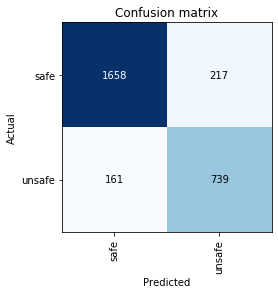

In [31]:
interp.plot_confusion_matrix()

In [33]:
m = learn.model.eval()

torch.Size([1, 3, 3, 3])

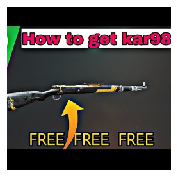

In [34]:
idx=22
x,y = data.valid_ds[idx]
x.show()

k = tensor([
    [0.  ,-5/3,1],
    [-5/3,-5/3,1],
    [1.  ,1   ,1],
]).expand(1,3,3,3)/6

k.shape

In [35]:
from fastai.callbacks.hooks import *
t = data.valid_ds[22][0].data
t.shape

torch.Size([3, 256, 256])

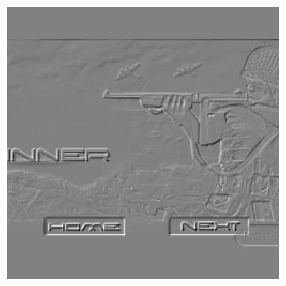

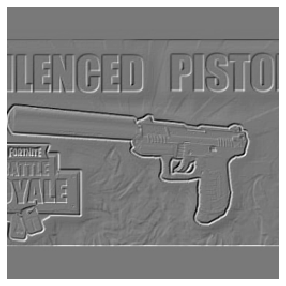

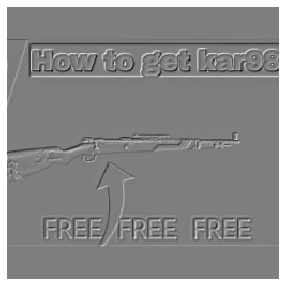

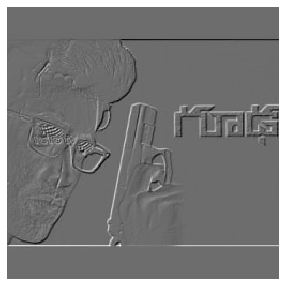

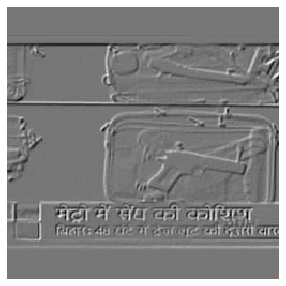

In [36]:
for i in range(20,25):
    t = data.valid_ds[i][0].data
    edge = F.conv2d(t[None], k)
    show_image(edge[0], figsize=(5,5))

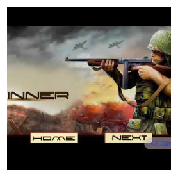

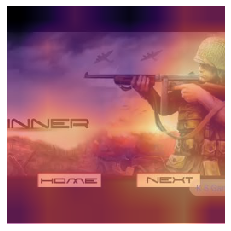

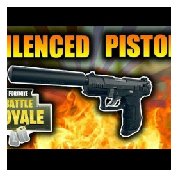

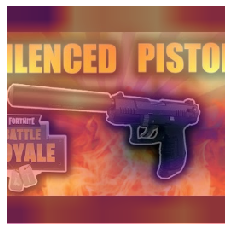

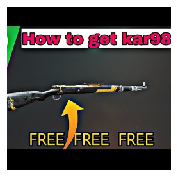

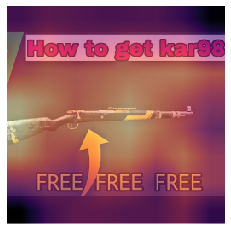

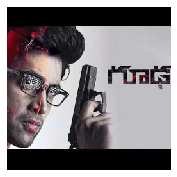

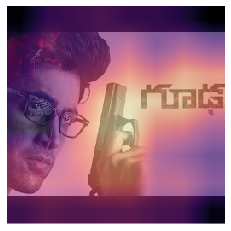

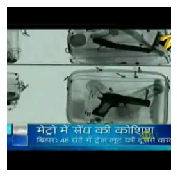

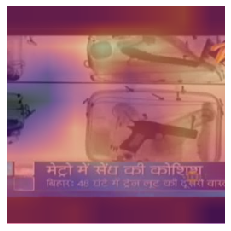

In [37]:
def hooked_backward(cat=y):
    with hook_output(m[0]) as hook_a: 
        with hook_output(m[0], grad=True) as hook_g:
            preds = m(xb)
            preds[0,int(cat)].backward()
    return hook_a,hook_g

def show_heatmap(hm):
    _,ax = plt.subplots()
    xb_im.show(ax)
    ax.imshow(hm, alpha=0.6, extent=(0,256,256,0),
              interpolation='bilinear', cmap='magma')

for i in range(20,25):
    x,y = data.valid_ds[i]
    x.show()
    xb,_ = data.one_item(x)
    xb_im = Image(data.denorm(xb)[0])
    xb = xb.cuda()
    hook_a,hook_g = hooked_backward()
    acts  = hook_a.stored[0].cpu()
    avg_acts = acts.mean(0)
    show_heatmap(avg_acts)

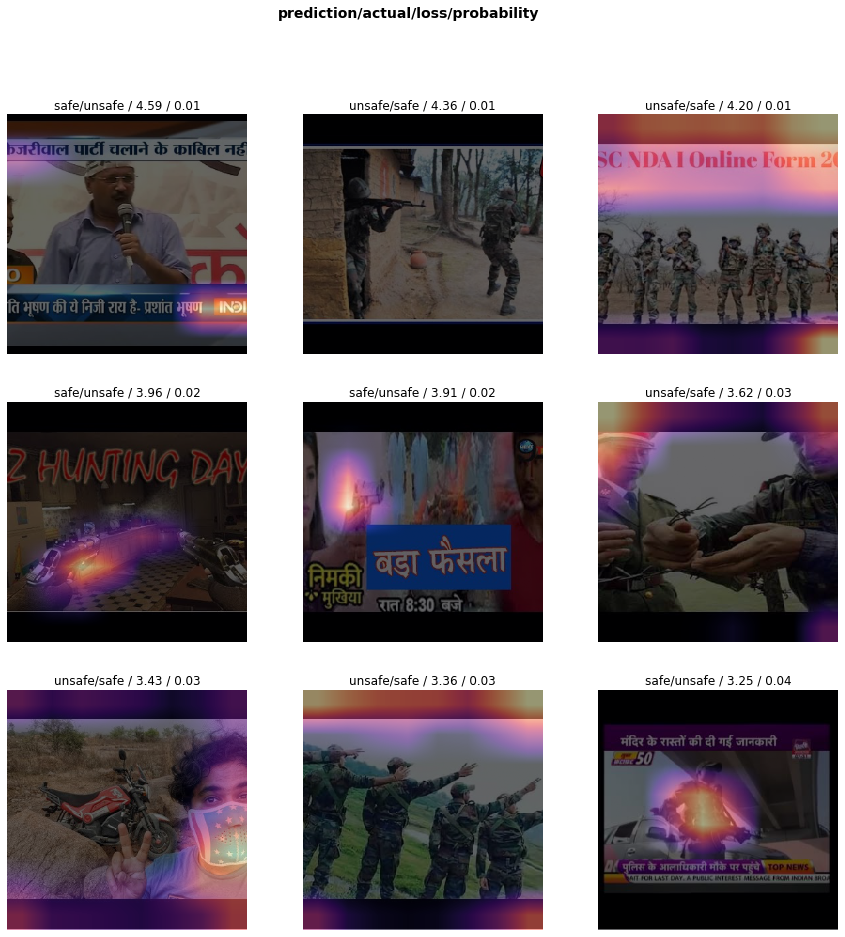

In [38]:
interp.plot_top_losses(9, figsize=(15,15),heatmap = True)

# Print kernel filters

In [63]:
from cv2 import resize

class SaveFeatures():
    def __init__(self, module):
        self.hook = module.register_forward_hook(self.hook_fn)
        self.features = None
    def hook_fn(self, module, input, output):
        self.features = torch.tensor(output,requires_grad=True).cuda()
    def close(self):
        self.hook.remove()

In [64]:
list(m.children())[1][8]

Linear(in_features=512, out_features=2, bias=True)

In [65]:
m = learn.model.eval()

activations = SaveFeatures(list(m.children())[1][8])  # register hook
activations

In [66]:
activations.features

In [23]:
mean_act = [activation]

BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)

In [8]:

class FilterVisualizer():
    def __init__(self, size=56, upscaling_steps=12, upscaling_factor=1.2):
        self.size, self.upscaling_steps, self.upscaling_factor = size, upscaling_steps, upscaling_factor
        self.model = learn.model.eval()
        #set_trainable(self.model, False)

    def visualize(self, layer, filter, lr=0.1, opt_steps=20, blur=None):
        sz = self.size
        img = data.valid_ds[1]
        activations = SaveFeatures(list(self.model.children())[layer])  # register hook

        for _ in range(self.upscaling_steps):  # scale the image up upscaling_steps times
            train_tfms, val_tfms = tfms_from_model(vgg16, sz)
            img_var = V(val_tfms(img)[None], requires_grad=True)  # convert image to Variable that requires grad
            optimizer = torch.optim.Adam([img_var], lr=lr, weight_decay=1e-6)
            for n in range(opt_steps):  # optimize pixel values for opt_steps times
                optimizer.zero_grad()
                self.model(img_var)
                loss = -activations.features[0, filter].mean()
                loss.backward()
                optimizer.step()
            img = val_tfms.denorm(img_var.data.cpu().numpy()[0].transpose(1,2,0))
            self.output = img
            sz = int(self.upscaling_factor * sz)  # calculate new image size
            img = cv2.resize(img, (sz, sz), interpolation = cv2.INTER_CUBIC)  # scale image up
            if blur is not None: img = cv2.blur(img,(blur,blur))  # blur image to reduce high frequency patterns
        self.save(layer, filter)
        activations.close()
        
    def save(self, layer, filter):
        plt.imsave("layer_"+str(layer)+"_filter_"+str(filter)+".jpg", np.clip(self.output, 0, 1))

In [9]:
layer = 40
filter = 265
FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
FV.visualize(layer, filter, blur=5)

IndexError: list index out of range

In [14]:
learn.summary

Sequential
Layer (type)         Output Shape         Param #    Trainable 
Conv2d               [32, 128, 128]       864        False     
______________________________________________________________________
BatchNorm2d          [32, 128, 128]       64         True      
______________________________________________________________________
Conv2d               [32, 128, 128]       288        False     
______________________________________________________________________
BatchNorm2d          [32, 128, 128]       64         True      
______________________________________________________________________
Conv2d               [8, 1, 1]            264        False     
______________________________________________________________________
Conv2d               [32, 1, 1]           288        False     
______________________________________________________________________
Conv2d               [16, 128, 128]       512        False     
___________________________________________________

In [15]:
layer = 42
filter = 64  # will be marked with a vertical line in the plot
total_filters_in_layer = 512

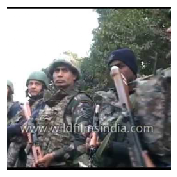

In [23]:
x,y = data.valid_ds[1]
x.show()

In [24]:
m = learn.model.eval()
set_trainable(m, False)

NameError: name 'set_trainable' is not defined

In [19]:
import os
from PIL import Image
import PIL
c=0
for i in os.listdir('../final_data_v3/final_data/train/safe/'):
    try:  
        filename = '../final_data_v3/final_data/train/safe/'+i
        #print('checking, ',i)
        im=Image.open(filename)
        im.verify()
        im.close() #reload is necessary in my case
        im = Image.open(filename) 
        im.transpose(PIL.Image.FLIP_LEFT_RIGHT)
        im.close()
        c += 1
        # do stuff
    # filename not an image file
    except Exception as e:
        print('file: ',i)
        print(e)
print('checked ',c)

checked  25074


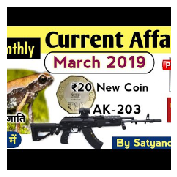

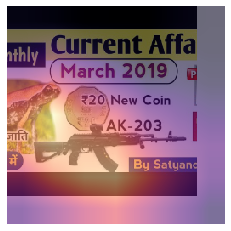

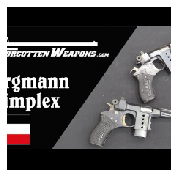

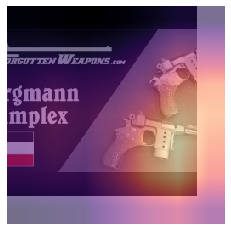

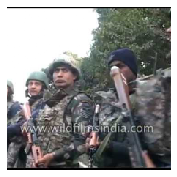

...

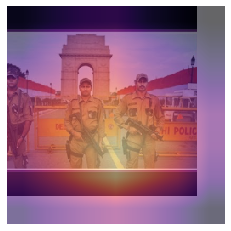

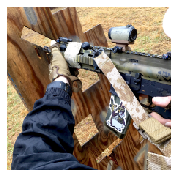

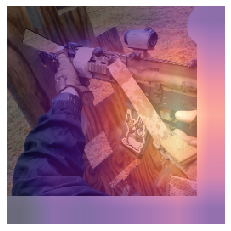

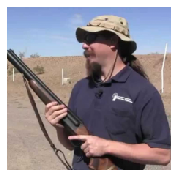

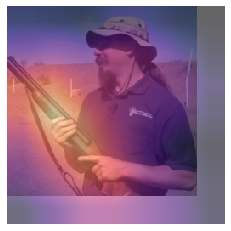

In [20]:
m = learn.model.eval()


def hooked_backward(cat=y):
    with hook_output(m[0]) as hook_a: 
        with hook_output(m[0], grad=True) as hook_g:
            preds = m(xb)
            preds[0,int(cat)].backward()
    return hook_a,hook_g

def show_heatmap(hm):
    _,ax = plt.subplots()
    xb_im.show(ax)
    ax.imshow(hm, alpha=0.6, extent=(0,256,256,0),
              interpolation='bilinear', cmap='magma')

for i in range(10):
    x,y = data.valid_ds[i]
    x.show()
    xb,_ = data.one_item(x)
    xb_im = Image(data.denorm(xb)[0])
    xb = xb.cuda()
    hook_a,hook_g = hooked_backward()
    acts  = hook_a.stored[0].cpu()
    avg_acts = acts.mean(0)
    show_heatmap(avg_acts)